## Importing necessary libraries

In [ ]:
# Install necessary packages
!pip install chembl_webresource_client tensorflow numpy pandas matplotlib seaborn rdkit keras-tuner scikit-learn
!pip install rdkit
!pip install xgboost
!pip install lightgbm
!pip install pubchempy
!pip install lazypredict
!pip install mordred

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.2/55.2 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.3/34.3 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.4/61.4 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pubchempy: filename=PubChemPy-1.0.4-py3-none-any.whl size=13819 sha256=bfdb161eca4c2c524104222d331021723fa86b9d153c2861e0e7580b8f26c816
  Stored in directory: /root/.cache/pip/wheels/8b/e3/6c/3385b2db08b0985a87f5b117f98d0cb61a3ae3ca3bcbbd8307
Successfully built pubchempy
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.8/128.8 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 29.2 MB/s eta 0:00:00
  Created wheel for mordred: filename=mordred-1.2.0-py3-none-any.whl size=

In [ ]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd
from glob import glob

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Importing necessary modules from the RDKit library
# Importing the Chem module for basic chemistry functions
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Descriptors
from rdkit.Chem import AllChem, PandasTools, MACCSkeys, AtomPairs, rdFingerprintGenerator
from rdkit import DataStructs
from rdkit.Chem.rdmolops import PatternFingerprint
from rdkit.Avalon import pyAvalonTools
from rdkit.Chem.AtomPairs.Pairs import GetAtomPairFingerprintAsBitVect
pd.set_option('display.max_rows', None)

# Importing various submodules from rdkit.Chem for chemical descriptors and fingerprints
from rdkit.Chem import Descriptors   # For calculating molecular descriptors
from rdkit.Chem import MACCSkeys      # For generating MACCS keys fingerprints
from rdkit.Chem import AllChem          # For various chemical functions, including fingerprint generation
from rdkit.Chem import rdMolDescriptors   # For calculating more advanced molecular descriptors

# Importing the Fingerprinter class from rdkit.Chem.EState for EState fingerprints
from rdkit.Chem.EState import Fingerprinter as EStateFingerprinter

# Library to split data in train and test
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from lightgbm import LGBMClassifier
import xgboost as xgb
import lightgbm as lgb
import pubchempy as pcp
from rdkit.Chem import Crippen

# To get diferent metric scores
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    precision_recall_curve,
    roc_curve,
    matthews_corrcoef,
    r2_score
)

import warnings
warnings.filterwarnings("ignore")

# Importing the new_client module from the ChEMBL web resource client library
# The ChEMBL web resource client is used to access the ChEMBL database, a large bioactivity database
from chembl_webresource_client.new_client import new_client


from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score, roc_auc_score, matthews_corrcoef
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier # Import MLPClassifier


from rdkit.Chem import AllChem, rdFingerprintGenerator

import mordred
from mordred import Calculator, descriptors
pd.set_option('display.max_columns', 2000)
warnings.filterwarnings("ignore")
sns.set(style='whitegrid')


## Dataset Compilation, Data preprocessing, Data Curation








In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### HER2 Dataset






#### Loading dataset

In [ ]:
 # Load erbB2/HER2
data = pd.read_csv('/content/drive/MyDrive/ML_erbB2/Data File/erbB2_1.csv')

In [ ]:
data.head()

,Molecule ChEMBL ID,Molecule Name,Molecule Max Phase,Molecular Weight,#RO5 Violations,AlogP,Compound Key,Smiles,Standard Type,Standard Relation,Standard Value,Standard Units,pChEMBL Value,Data Validity Comment,Comment,Uo Units,Ligand Efficiency BEI,Ligand Efficiency LE,Ligand Efficiency LLE,Ligand Efficiency SEI,Potential Duplicate,Assay ChEMBL ID,Assay Description,Assay Type,BAO Format ID,BAO Label,Assay Organism,Assay Tissue ChEMBL ID,Assay Tissue Name,Assay Cell Type,Assay Subcellular Fraction,Assay Parameters,Assay Variant Accession,Assay Variant Mutation,Target ChEMBL ID,Target Name,Target Organism,Target Type,Document ChEMBL ID,Source ID,Source Description,Document Journal,Document Year,Cell ChEMBL ID,Properties,Action Type,Standard Text Value
0,CHEMBL1454946,FLUBENDAZOLE,2.0,313.29,0.0,3.11,FLUBENDAZOLE,COC(=O)Nc1nc2cc(C(=O)c3ccc(F)cc3)ccc2[nH]1,Ki,NaN,NaN,NaN,NaN,NaN,Not Active (inhibition < 50% @ 10 uM and thus ...,NaN,NaN,NaN,NaN,NaN,0.0,CHEMBL1909205,DRUGMATRIX: Protein Tyrosine Kinase,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CHEMBL456,ETHACRYNIC ACID,4.0,303.14,0.0,3.61,ETHACRYNIC ACID,C=C(CC)C(=O)c1ccc(OCC(=O)O)c(Cl)c1Cl,Ki,NaN,NaN,NaN,NaN,NaN,Not Active (inhibition < 50% @ 10 uM and thus ...,NaN,NaN,NaN,NaN,NaN,0.0,CHEMBL1909205,DRUGMATRIX: Protein Tyrosine Kinase,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,CHEMBL2348865,NaN,NaN,391.44,0.0,2.39,9a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,CHEMBL283196,ALPHA-NAPHTHOFLAVONE,NaN,272.30,0.0,4.61,ALPHA-NAPHTHOFLAVONE,O=c1cc(-c2ccccc2)oc2c1ccc1ccccc12,IC50,NaN,NaN,NaN,NaN,NaN,Not Active (inhibition < 50% @ 10 uM and thus ...,NaN,NaN,NaN,NaN,NaN,0.0,CHEMBL1909205,DRUGMATRIX: Protein Tyrosine Kinase,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,CHEMBL204934,GW813360X,NaN,345.37,0.0,2.67,GW813360X,COc1cccc(-n2cnc3c(N/N=C/c4ccncc4)ncnc32)c1,Inhibition,'=',7.49,%,NaN,NaN,NaN,UO_0000187,NaN,NaN,NaN,NaN,0.0,CHEMBL1962281,GSK_PKIS: ERBB2 mean inhibition at 1 uM [Nanosyn],B,BAO_0000357,single protein format,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CHEMBL1824,Receptor protein-tyrosine kinase erbB-2,Homo sapiens,SINGLE PROTEIN,CHEMBL1961873,16.0,GSK Published Kinase Inhibitor Set,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
data.tail()

In [ ]:
data.shape

(7851, 47)

In [ ]:
data.info()

#### HER2 Dataset imported from CHEMBL






In [ ]:
# Fetch data for HER2
target = new_client.target
target_query = target.search('her2')
targets = pd.DataFrame.from_dict(target_query)
her2 = targets.target_chembl_id[1]


In [ ]:
targets.head()

,cross_references,organism,pref_name,score,species_group_flag,target_chembl_id,target_components,target_type,tax_id
0,[],Homo sapiens,FASN/HER2,17.0,False,CHEMBL4106134,"[{'accession': 'P04626', 'component_descriptio...",PROTEIN COMPLEX,9606
1,"[{'xref_id': 'P04626', 'xref_name': None, 'xre...",Homo sapiens,Receptor protein-tyrosine kinase erbB-2,15.0,False,CHEMBL1824,"[{'accession': 'P04626', 'component_descriptio...",SINGLE PROTEIN,9606
2,[],Homo sapiens,Epidermal growth factor receptor and ErbB2 (HE...,13.0,False,CHEMBL2111431,"[{'accession': 'P04626', 'component_descriptio...",PROTEIN FAMILY,9606
3,[],Homo sapiens,ErbB-2/ErbB-3 heterodimer,12.0,False,CHEMBL4630723,"[{'accession': 'P04626', 'component_descriptio...",PROTEIN COMPLEX,9606
4,[],Homo sapiens,Epidermal growth factor receptor,9.0,False,CHEMBL2363049,"[{'accession': 'P04626', 'component_descriptio...",PROTEIN FAMILY,9606


In [ ]:
her2

'CHEMBL1824'

In [ ]:
# Function to fetch activities for a specific target
def fetch_data_for_target(target_chembl_id):
    res = new_client.activity.filter(target_chembl_id=target_chembl_id).filter(standard_type="IC50")
    df = pd.DataFrame.from_records(res)
    return df


In [ ]:
# Fetch data
her2_data = fetch_data_for_target(her2)

#### Dataset Overview

In [ ]:
her2_data.shape

(4098, 46)

In [ ]:
her2_data.head()

,action_type,activity_comment,activity_id,activity_properties,assay_chembl_id,assay_description,assay_type,assay_variant_accession,assay_variant_mutation,bao_endpoint,bao_format,bao_label,canonical_smiles,data_validity_comment,data_validity_description,document_chembl_id,document_journal,document_year,ligand_efficiency,molecule_chembl_id,molecule_pref_name,parent_molecule_chembl_id,pchembl_value,potential_duplicate,qudt_units,record_id,relation,src_id,standard_flag,standard_relation,standard_text_value,standard_type,standard_units,standard_upper_value,standard_value,target_chembl_id,target_organism,target_pref_name,target_tax_id,text_value,toid,type,units,uo_units,upper_value,value
0,None,None,32264,[],CHEMBL845865,Inhibition of autophosphorylation of human Her...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL68920,None,CHEMBL68920,6.52,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,nM,None,300.0,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,0.3
1,None,None,32264,[],CHEMBL845865,Inhibition of autophosphorylation of human Her...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL68920,None,CHEMBL68920,6.52,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,nM,None,300.0,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,0.3
2,None,None,32266,[],CHEMBL615491,Inhibition of ligand induced proliferation in ...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL68920,None,CHEMBL68920,5.60,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,nM,None,2500.0,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,2.5
3,None,None,32271,[],CHEMBL683802,Inhibition of autophosphorylation of human Her...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL69960,None,CHEMBL69960,6.40,0,http://www.openphacts.org/units/Nanomolar,119494,=,1,1,=,None,IC50,nM,None,400.0,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,0.4
4,None,None,32273,[],CHEMBL615491,Inhibition of ligand induced proliferation in ...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL69960,None,CHEMBL69960,5.92,0,http://www.openphacts.org/units/Nanomolar,119494,=,1,1,=,None,IC50,nM,None,1210.0,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,1.21


In [ ]:
her2_data.tail()

,action_type,activity_comment,activity_id,activity_properties,assay_chembl_id,assay_description,assay_type,assay_variant_accession,assay_variant_mutation,bao_endpoint,bao_format,bao_label,canonical_smiles,data_validity_comment,data_validity_description,document_chembl_id,document_journal,document_year,ligand_efficiency,molecule_chembl_id,molecule_pref_name,parent_molecule_chembl_id,pchembl_value,potential_duplicate,qudt_units,record_id,relation,src_id,standard_flag,standard_relation,standard_text_value,standard_type,standard_units,standard_upper_value,standard_value,target_chembl_id,target_organism,target_pref_name,target_tax_id,text_value,toid,type,units,uo_units,upper_value,value
4093,"{'action_type': 'INHIBITOR', 'description': 'N...",None,25073466,[],CHEMBL5253688,Inhibition of human recombinant ERBB2 expresse...,B,None,None,BAO_0000190,BAO_0000019,assay format,COc1cc2ncnc(NCCOc3ccccc3F)c2cc1OC,None,None,CHEMBL5252533,J Med Chem,2016.0,"{'bei': '14.73', 'le': '0.28', 'lle': '1.78', ...",CHEMBL5270270,None,CHEMBL5270270,5.06,0,http://www.openphacts.org/units/Nanomolar,3930293,=,1,1,=,None,IC50,nM,None,8730.0,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,nM,UO_0000065,None,8730.0
4094,"{'action_type': 'INHIBITOR', 'description': 'N...",None,25078778,[],CHEMBL5255145,Inhibition of HER2 (unknown origin),B,None,None,BAO_0000190,BAO_0000357,single protein format,C=CC(=O)N1CCC(Oc2cc3c(Nc4ccc(Cl)c(Cl)c4F)ncnc3...,None,None,CHEMBL5252585,Bioorg Med Chem,2023.0,"{'bei': '18.08', 'le': '0.37', 'lle': '3.50', ...",CHEMBL3545154,POZIOTINIB,CHEMBL3545154,8.88,0,http://www.openphacts.org/units/Nanomolar,3931196,=,1,1,=,None,IC50,nM,None,1.31,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,nM,UO_0000065,None,1.31
4095,"{'action_type': 'INHIBITOR', 'description': 'N...",None,25078779,[],CHEMBL5255145,Inhibition of HER2 (unknown origin),B,None,None,BAO_0000190,BAO_0000357,single protein format,CN(C)C/C=C/C(=O)Nc1cc2c(Nc3ccc(F)c(Cl)c3)ncnc2...,None,None,CHEMBL5252585,Bioorg Med Chem,2023.0,"{'bei': '17.91', 'le': '0.35', 'lle': '4.31', ...",CHEMBL1173655,AFATINIB,CHEMBL1173655,8.70,0,http://www.openphacts.org/units/Nanomolar,3931197,=,1,1,=,None,IC50,nM,None,1.98,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,nM,UO_0000065,None,1.98
4096,"{'action_type': 'INHIBITOR', 'description': 'N...",None,25078780,[],CHEMBL5255145,Inhibition of HER2 (unknown origin),B,None,None,BAO_0000190,BAO_0000357,single protein format,C=CC(=O)N1CCC(Oc2cc3c(Nc4ccc(Cl)c(Cl)c4F)ncnc3...,None,None,CHEMBL5252585,Bioorg Med Chem,2023.0,"{'bei': '16.47', 'le': '0.33', 'lle': '3.48', ...",CHEMBL5282641,None,CHEMBL5282641,9.02,0,http://www.openphacts.org/units/Nanomolar,3931171,=,1,1,=,None,IC50,nM,None,0.96,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,nM,UO_0000065,None,0.96
4097,"{'action_type': 'INHIBITOR', 'description': 'N...",None,25078781,[],CHEMBL5255145,Inhibition of HER2 (unknown origin),B,None,None,BAO_0000190,BAO_0000357,single protein format,C=CC(=O)N1CCC(Oc2cc3c(Nc4cccc(Cl)c4F)ncnc3cc2O...,None,None,CHEMBL5252585,Bioorg Med Chem,2023.0,"{'bei': '17.25', 'le': '0.34', 'lle': '3.96', ...",CHEMBL5288888,None,CHEMBL5288888,8.85,0,http://www.openphacts.org/units/Nanomolar,3931184,=,1,1,=,None,IC50,nM,None,1.42,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,nM,UO_0000065,None,1.42


In [ ]:
her2_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4098 entries, 0 to 4097
Data columns (total 46 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   action_type                217 non-null    object 
 1   activity_comment           942 non-null    object 
 2   activity_id                4098 non-null   int64  
 3   activity_properties        4098 non-null   object 
 4   assay_chembl_id            4098 non-null   object 
 5   assay_description          4098 non-null   object 
 6   assay_type                 4098 non-null   object 
 7   assay_variant_accession    14 non-null     object 
 8   assay_variant_mutation     14 non-null     object 
 9   bao_endpoint               4098 non-null   object 
 10  bao_format                 4098 non-null   object 
 11  bao_label                  4098 non-null   object 
 12  canonical_smiles           4066 non-null   object 
 13  data_validity_comment      27 non-null     objec

#### Data Curation

In [ ]:
# Get unique values and their counts
unique_values = her2_data['standard_type'].value_counts()
print(unique_values)

standard_type
IC50    4098
Name: count, dtype: int64


In [ ]:
missing_values_count = her2_data['standard_units'].isna().sum()
print(f"Number of missing values in 'standard_units': {missing_values_count}")

Number of missing values in 'standard_units': 907


In [ ]:
# Remove rows with missing values in the 'standard_units' column
her2_data = her2_data.dropna(subset=['standard_units'])

In [ ]:
missing_values_count = her2_data['standard_units'].isna().sum()
print(f"Number of missing values in 'standard_units': {missing_values_count}")

Number of missing values in 'standard_units': 0


In [ ]:
her2_data.shape

(3191, 46)

In [ ]:
# Get unique values and their counts
unique_values = her2_data['standard_units'].value_counts()
print(unique_values)

standard_units
nM         3147
ug.mL-1      44
Name: count, dtype: int64


In [ ]:
# Filter rows where 'standard_units' is 'nM'
her2_data = her2_data[her2_data['standard_units'] == 'nM']

# Reset the index after filtering rows
her2_data.reset_index(drop=True, inplace=True)

In [ ]:
her2_data.head()

,action_type,activity_comment,activity_id,activity_properties,assay_chembl_id,assay_description,assay_type,assay_variant_accession,assay_variant_mutation,bao_endpoint,bao_format,bao_label,canonical_smiles,data_validity_comment,data_validity_description,document_chembl_id,document_journal,document_year,ligand_efficiency,molecule_chembl_id,molecule_pref_name,parent_molecule_chembl_id,pchembl_value,potential_duplicate,qudt_units,record_id,relation,src_id,standard_flag,standard_relation,standard_text_value,standard_type,standard_units,standard_upper_value,standard_value,target_chembl_id,target_organism,target_pref_name,target_tax_id,text_value,toid,type,units,uo_units,upper_value,value
0,None,None,32264,[],CHEMBL845865,Inhibition of autophosphorylation of human Her...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL68920,None,CHEMBL68920,6.52,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,nM,None,300.0,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,0.3
1,None,None,32264,[],CHEMBL845865,Inhibition of autophosphorylation of human Her...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL68920,None,CHEMBL68920,6.52,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,nM,None,300.0,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,0.3
2,None,None,32266,[],CHEMBL615491,Inhibition of ligand induced proliferation in ...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL68920,None,CHEMBL68920,5.60,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,nM,None,2500.0,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,2.5
3,None,None,32271,[],CHEMBL683802,Inhibition of autophosphorylation of human Her...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL69960,None,CHEMBL69960,6.40,0,http://www.openphacts.org/units/Nanomolar,119494,=,1,1,=,None,IC50,nM,None,400.0,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,0.4
4,None,None,32273,[],CHEMBL615491,Inhibition of ligand induced proliferation in ...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL69960,None,CHEMBL69960,5.92,0,http://www.openphacts.org/units/Nanomolar,119494,=,1,1,=,None,IC50,nM,None,1210.0,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,1.21


In [ ]:
unique_values = her2_data['standard_units'].unique()
print(unique_values)

['nM']


In [ ]:
her2_data.shape

(3147, 46)

In [ ]:
# Convert 'standard_value' to numeric, errors='coerce' will convert invalid parsing to NaN
her2_data['standard_value'] = pd.to_numeric(her2_data['standard_value'], errors='coerce')

# Filter and convert values
her2_data.loc[her2_data['standard_units'] == 'nM', 'standard_value'] /= 1000

# Update 'standard_units' to µM
her2_data.loc[her2_data['standard_units'] == 'nM', 'standard_units'] = 'µM'

In [ ]:
her2_data.head()

,action_type,activity_comment,activity_id,activity_properties,assay_chembl_id,assay_description,assay_type,assay_variant_accession,assay_variant_mutation,bao_endpoint,bao_format,bao_label,canonical_smiles,data_validity_comment,data_validity_description,document_chembl_id,document_journal,document_year,ligand_efficiency,molecule_chembl_id,molecule_pref_name,parent_molecule_chembl_id,pchembl_value,potential_duplicate,qudt_units,record_id,relation,src_id,standard_flag,standard_relation,standard_text_value,standard_type,standard_units,standard_upper_value,standard_value,target_chembl_id,target_organism,target_pref_name,target_tax_id,text_value,toid,type,units,uo_units,upper_value,value
0,None,None,32264,[],CHEMBL845865,Inhibition of autophosphorylation of human Her...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL68920,None,CHEMBL68920,6.52,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,µM,None,0.30,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,0.3
1,None,None,32264,[],CHEMBL845865,Inhibition of autophosphorylation of human Her...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL68920,None,CHEMBL68920,6.52,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,µM,None,0.30,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,0.3
2,None,None,32266,[],CHEMBL615491,Inhibition of ligand induced proliferation in ...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL68920,None,CHEMBL68920,5.60,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,µM,None,2.50,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,2.5
3,None,None,32271,[],CHEMBL683802,Inhibition of autophosphorylation of human Her...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL69960,None,CHEMBL69960,6.40,0,http://www.openphacts.org/units/Nanomolar,119494,=,1,1,=,None,IC50,µM,None,0.40,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,0.4
4,None,None,32273,[],CHEMBL615491,Inhibition of ligand induced proliferation in ...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL69960,None,CHEMBL69960,5.92,0,http://www.openphacts.org/units/Nanomolar,119494,=,1,1,=,None,IC50,µM,None,1.21,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,1.21


In [ ]:
missing_values_count = her2_data['standard_value'].isna().sum()
print(f"Number of missing values in 'standard_value': {missing_values_count}")

Number of missing values in 'standard_value': 21


In [ ]:
# Remove rows where 'standard_value' column has NaN values
her2_data = her2_data.dropna(subset=['standard_value'])

In [ ]:
missing_values_count = her2_data['standard_value'].isna().sum()
print(f"Number of missing values in 'standard_value': {missing_values_count}")

Number of missing values in 'standard_value': 0


In [ ]:
her2_data.shape

(3126, 46)

In [ ]:
her2_data.head()

,action_type,activity_comment,activity_id,activity_properties,assay_chembl_id,assay_description,assay_type,assay_variant_accession,assay_variant_mutation,bao_endpoint,bao_format,bao_label,canonical_smiles,data_validity_comment,data_validity_description,document_chembl_id,document_journal,document_year,ligand_efficiency,molecule_chembl_id,molecule_pref_name,parent_molecule_chembl_id,pchembl_value,potential_duplicate,qudt_units,record_id,relation,src_id,standard_flag,standard_relation,standard_text_value,standard_type,standard_units,standard_upper_value,standard_value,target_chembl_id,target_organism,target_pref_name,target_tax_id,text_value,toid,type,units,uo_units,upper_value,value
0,None,None,32264,[],CHEMBL845865,Inhibition of autophosphorylation of human Her...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL68920,None,CHEMBL68920,6.52,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,µM,None,0.30,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,0.3
1,None,None,32264,[],CHEMBL845865,Inhibition of autophosphorylation of human Her...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL68920,None,CHEMBL68920,6.52,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,µM,None,0.30,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,0.3
2,None,None,32266,[],CHEMBL615491,Inhibition of ligand induced proliferation in ...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL68920,None,CHEMBL68920,5.60,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,µM,None,2.50,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,2.5
3,None,None,32271,[],CHEMBL683802,Inhibition of autophosphorylation of human Her...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL69960,None,CHEMBL69960,6.40,0,http://www.openphacts.org/units/Nanomolar,119494,=,1,1,=,None,IC50,µM,None,0.40,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,0.4
4,None,None,32273,[],CHEMBL615491,Inhibition of ligand induced proliferation in ...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL69960,None,CHEMBL69960,5.92,0,http://www.openphacts.org/units/Nanomolar,119494,=,1,1,=,None,IC50,µM,None,1.21,CHEMBL1824,Homo sapiens,Receptor protein-tyrosine kinase erbB-2,9606,None,None,IC50,uM,UO_0000065,None,1.21


In [ ]:
her2_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3126 entries, 0 to 3146
Data columns (total 46 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   action_type                217 non-null    object 
 1   activity_comment           14 non-null     object 
 2   activity_id                3126 non-null   int64  
 3   activity_properties        3126 non-null   object 
 4   assay_chembl_id            3126 non-null   object 
 5   assay_description          3126 non-null   object 
 6   assay_type                 3126 non-null   object 
 7   assay_variant_accession    14 non-null     object 
 8   assay_variant_mutation     14 non-null     object 
 9   bao_endpoint               3126 non-null   object 
 10  bao_format                 3126 non-null   object 
 11  bao_label                  3126 non-null   object 
 12  canonical_smiles           3122 non-null   object 
 13  data_validity_comment      14 non-null     object 
 1

In [ ]:
#Getting the statistical summary for the all variables
her2_data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
action_type,217,1,"{'action_type': 'INHIBITOR', 'description': 'N...",217,NaN,NaN,NaN,NaN,NaN,NaN,NaN
activity_comment,14,14,233612,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
activity_id,3126.0,NaN,NaN,NaN,9116477.954575,7962047.520043,32264.0,2021335.25,5243237.0,16903160.75,25078781.0
activity_properties,3126,17,[],2975,NaN,NaN,NaN,NaN,NaN,NaN,NaN
assay_chembl_id,3126,385,CHEMBL3882760,250,NaN,NaN,NaN,NaN,NaN,NaN,NaN
assay_description,3126,296,Inhibition of recombinant human full length Er...,250,NaN,NaN,NaN,NaN,NaN,NaN,NaN
assay_type,3126,3,B,2885,NaN,NaN,NaN,NaN,NaN,NaN,NaN
assay_variant_accession,14,1,P04626,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN
assay_variant_mutation,14,5,D769H,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
bao_endpoint,3126,1,BAO_0000190,3126,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
her2_data.shape

(3126, 46)

In [ ]:
# Clean and select data
def clean_and_select_data(df):
    df = df[df['standard_value'].notna() & df['canonical_smiles'].notna()]
    df = df.drop_duplicates(['canonical_smiles'])
    df = df[['molecule_chembl_id', 'canonical_smiles', 'standard_value']]
    return df


In [ ]:
her2_data = clean_and_select_data(her2_data)

In [ ]:
her2_data = her2_data.reset_index(drop=True)
her2_data

,molecule_chembl_id,canonical_smiles,standard_value
0,CHEMBL68920,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,0.30000
1,CHEMBL69960,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.40000
2,CHEMBL67057,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.10000
3,CHEMBL65848,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,5.00000
4,CHEMBL69629,Cc1cc(C(=O)NCCN2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncn...,0.10000
5,CHEMBL66570,CCN1CCN(C(=O)c2cc(C)c(/C=C3\C(=O)Nc4ncnc(Nc5cc...,0.10000
6,CHEMBL305194,Cc1cc(C(=O)O)[nH]c1/C=C1\C(=O)Nc2ncnc(Nc3ccc(F...,5.00000
7,CHEMBL67003,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.10000
8,CHEMBL305246,Cc1cc(C(=O)N2CCN(C)CC2)[nH]c1/C=C1\C(=O)Nc2ncn...,0.20000
9,CHEMBL69966,C#Cc1cccc(Nc2ncnc3c2/C(=C/c2[nH]c(C(=O)NCCN4CC...,0.04000


 ##### Tanimoton Similarity

In [ ]:
from rdkit.Chem import PandasTools

# Add a column to 'her2_data' DataFrame where each entry is an RDKit Mol object
PandasTools.AddMoleculeColumnToFrame(her2_data, 'canonical_smiles', 'mol')

In [ ]:
from rdkit.DataStructs.cDataStructs import TanimotoSimilarity
from rdkit.Chem import MACCSkeys
import pandas as pd
import numpy as np

# Generate MACCS fingerprints for each compound
her2_data['Fingerprint'] = her2_data['mol'].apply(MACCSkeys.GenMACCSKeys)

# Initialize lists to store unique compounds, averaged IC50 values, and duplicates
unique_compounds = []
duplicates = []

# Keep track of indices already processed
processed_indices = set()

# Find and process duplicates
for i in range(len(her2_data)):
    if i in processed_indices:
        continue  # Skip already processed compounds

    duplicate_indices = [i]

    # Compare current compound with all remaining compounds
    for j in range(i + 1, len(her2_data)):
        if j not in processed_indices:
            # Calculate Tanimoto similarity between the two fingerprints
            tanimoto = TanimotoSimilarity(her2_data.iloc[i]['Fingerprint'], her2_data.iloc[j]['Fingerprint'])

            if tanimoto == 1.0:  # Identical compounds (Tanimoto = 1.0)
                duplicate_indices.append(j)
                processed_indices.add(j)  # Mark as processed

    # If duplicates are found, store them for further analysis
    if len(duplicate_indices) > 1:
        duplicates.append({
            'canonical_smiles': her2_data.iloc[i]['canonical_smiles'],
            'duplicates': her2_data.iloc[duplicate_indices]['canonical_smiles'].tolist(),
            'ic50_values': her2_data.iloc[duplicate_indices]['standard_value'].tolist()
        })

    # Average the IC50 values of the duplicates
    avg_ic50 = np.mean(her2_data.iloc[duplicate_indices]['standard_value'])

    # Collect the unique compound's SMILES and averaged IC50 in a list
    unique_compounds.append({
        'canonical_smiles': her2_data.iloc[i]['canonical_smiles'],
        'standard_value': avg_ic50
    })


In [ ]:
#  Create the final DataFrame with unique compounds
unique_data = pd.DataFrame(unique_compounds)



In [ ]:
unique_data

,canonical_smiles,standard_value
0,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,0.300000
1,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.400000
2,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.100000
3,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,5.000000
4,Cc1cc(C(=O)NCCN2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncn...,0.100000
5,CCN1CCN(C(=O)c2cc(C)c(/C=C3\C(=O)Nc4ncnc(Nc5cc...,0.100000
6,Cc1cc(C(=O)O)[nH]c1/C=C1\C(=O)Nc2ncnc(Nc3ccc(F...,5.000000
7,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.100000
8,Cc1cc(C(=O)N2CCN(C)CC2)[nH]c1/C=C1\C(=O)Nc2ncn...,0.200000
9,C#Cc1cccc(Nc2ncnc3c2/C(=C/c2[nH]c(C(=O)NCCN4CC...,0.040000


In [ ]:
unique_data.shape

(2173, 2)

In [ ]:
her2_data = unique_data

In [ ]:
# duplicates to DataFrames for further analysis
duplicates_df = pd.DataFrame(duplicates)


In [ ]:
duplicates_df

,canonical_smiles,duplicates,ic50_values
0,COc1cc(/C=C(\C#N)C(N)=O)cc(CSCc2ccccc2Cl)c1O,"[COc1cc(/C=C(\C#N)C(N)=O)cc(CSCc2ccccc2Cl)c1O,...","[0.25119, 1.99526]"
1,COc1cc(/C=C(\C#N)C(N)=O)cc(SCCCC(=O)O)c1O,"[COc1cc(/C=C(\C#N)C(N)=O)cc(SCCCC(=O)O)c1O, CO...","[15.848930000000001, 91.20108]"
2,COc1cc(NC(=O)/C=C/CN(C)C)cc2c(Nc3cccc(Br)c3)c(...,[COc1cc(NC(=O)/C=C/CN(C)C)cc2c(Nc3cccc(Br)c3)c...,"[9.35, 5.66]"
3,COc1cc(NC(=O)/C=C/CN2CCOCC2)cc2c(Nc3cccc(Br)c3...,[COc1cc(NC(=O)/C=C/CN2CCOCC2)cc2c(Nc3cccc(Br)c...,"[23.59, 34.13]"
4,c1ccc(Cn2cnc3cc(Nc4ncnc5ccccc45)ccc32)cc1,"[c1ccc(Cn2cnc3cc(Nc4ncnc5ccccc45)ccc32)cc1, c1...","[27.0, 21.0]"
5,COc1cc2ncnc(Nc3ccc4c(cnn4Cc4ccccc4)c3)c2cc1OC,[COc1cc2ncnc(Nc3ccc4c(cnn4Cc4ccccc4)c3)c2cc1OC...,"[0.29, 3.1]"
6,C=CC(=O)Nc1ccc2ncnc(Nc3cccc(Br)c3)c2c1,"[C=CC(=O)Nc1ccc2ncnc(Nc3cccc(Br)c3)c2c1, C=CC(...","[0.0057, 0.073]"
7,C=CC(=O)Nc1ccc2ncnc(Nc3ccc(F)c(Cl)c3)c2n1,"[C=CC(=O)Nc1ccc2ncnc(Nc3ccc(F)c(Cl)c3)c2n1, C=...","[0.012, 0.003]"
8,C=CC(=O)Nc1cc2c(Nc3ccc(F)c(Br)c3)ncnc2cn1,"[C=CC(=O)Nc1cc2c(Nc3ccc(F)c(Br)c3)ncnc2cn1, C=...","[0.0011, 0.026]"
9,O=C1Nc2ccccc2/C1=C/c1sccc1Br,"[O=C1Nc2ccccc2/C1=C/c1sccc1Br, O=C1Nc2ccccc2/C...","[100.0, 100.0]"


In [ ]:
# Number of compounds with duplicates
num_duplicates = len(duplicates_df)

print(f"Number of duplicates: {num_duplicates}")

Number of duplicates: 321


In [ ]:
# Total number of duplicates (including all entries for each duplicate)
total_duplicates = sum([len(row['duplicates']) for _, row in duplicates_df.iterrows()])

print(f"Total number of duplicate entries: {total_duplicates}")


Total number of duplicate entries: 825


##### Classification of HER2 Dataset

In [ ]:
 # Classify compounds based on IC50 threshold of 1 uM
# If 'standard_value' is less than or equal to 1, assign '1' (active); otherwise, assign '0' (inactive)

In [ ]:
#Labeling compounds as either being active, inactive or intermediate The bioactivity data is in the IC50 unit.
 #Compounds having values of less than 1 uM will be considered to be active while those greater than 10 uM will be considered to be inactive.
 # As for those values in between 1 and 10 uM will be referred to as intermediate.

In [ ]:
bioactivity_threshold = []

for i in her2_data['standard_value']:
    i = float(i)  # Ensure the value is treated as a float

    if i >= 10:  # Inactive threshold (≥ 10 uM)
        bioactivity_threshold.append(0)  # Inactive
    elif i <= 1:  # Active threshold (≤ 1 uM)
        bioactivity_threshold.append(1)  # Active
    else:
        bioactivity_threshold.append(2)  # Intermediate


In [ ]:
# Add the new column to your dataframe
her2_data['class'] = bioactivity_threshold

In [ ]:
her2_data = her2_data.reset_index(drop=True)
her2_data

,canonical_smiles,standard_value,class
0,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,0.300000,1
1,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.400000,1
2,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.100000,1
3,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,5.000000,2
4,Cc1cc(C(=O)NCCN2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncn...,0.100000,1
5,CCN1CCN(C(=O)c2cc(C)c(/C=C3\C(=O)Nc4ncnc(Nc5cc...,0.100000,1
6,Cc1cc(C(=O)O)[nH]c1/C=C1\C(=O)Nc2ncnc(Nc3ccc(F...,5.000000,2
7,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.100000,1
8,Cc1cc(C(=O)N2CCN(C)CC2)[nH]c1/C=C1\C(=O)Nc2ncn...,0.200000,1
9,C#Cc1cccc(Nc2ncnc3c2/C(=C/c2[nH]c(C(=O)NCCN4CC...,0.040000,1


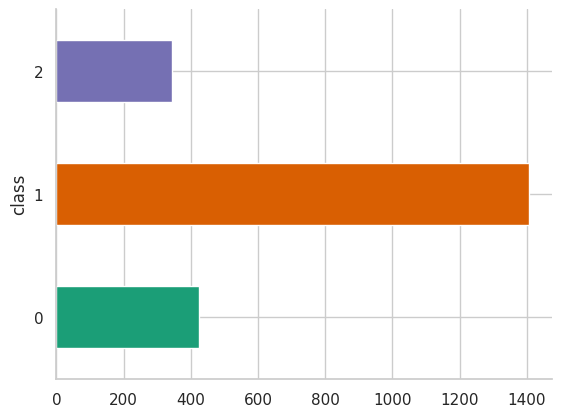

In [ ]:
# Bar chat of number of actives, inactives and intermediates

from matplotlib import pyplot as plt
import seaborn as sns
her2_data.groupby('class').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
her2_data = her2_data[her2_data['class'] != 2]  # Exclude intermediate class (2)
her2_data


,canonical_smiles,standard_value,class
0,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,0.300000,1
1,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.400000,1
2,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.100000,1
4,Cc1cc(C(=O)NCCN2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncn...,0.100000,1
5,CCN1CCN(C(=O)c2cc(C)c(/C=C3\C(=O)Nc4ncnc(Nc5cc...,0.100000,1
7,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.100000,1
8,Cc1cc(C(=O)N2CCN(C)CC2)[nH]c1/C=C1\C(=O)Nc2ncn...,0.200000,1
9,C#Cc1cccc(Nc2ncnc3c2/C(=C/c2[nH]c(C(=O)NCCN4CC...,0.040000,1
10,CCN(CC)CCNC(=O)c1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4...,0.200000,1
11,Cc1cc(C(=O)N2CC(C)NC(C)C2)[nH]c1/C=C1\C(=O)Nc2...,0.500000,1


In [ ]:
her2_data["class"].value_counts()

,count
class,
1,1406
0,424


In [ ]:
her2_data["class"].value_counts(1)

In [ ]:
# Convert IC50 to pIC50
def convert_to_pIC50(data, column_name='standard_value'):
    molar_values = data[column_name].astype(float) * (10**-6)     # Convert IC50 values to molar concentration (in M)
    data['pIC50'] = -np.log10(molar_values)                       # Calculate pIC50 values: -log10(IC50 in M)

    return data

In [ ]:
her2_data = convert_to_pIC50(her2_data, 'standard_value')
her2_data


,canonical_smiles,standard_value,class,pIC50
0,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,0.300000,1,6.522879
1,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.400000,1,6.397940
2,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.100000,1,7.000000
4,Cc1cc(C(=O)NCCN2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncn...,0.100000,1,7.000000
5,CCN1CCN(C(=O)c2cc(C)c(/C=C3\C(=O)Nc4ncnc(Nc5cc...,0.100000,1,7.000000
7,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,0.100000,1,7.000000
8,Cc1cc(C(=O)N2CCN(C)CC2)[nH]c1/C=C1\C(=O)Nc2ncn...,0.200000,1,6.698970
9,C#Cc1cccc(Nc2ncnc3c2/C(=C/c2[nH]c(C(=O)NCCN4CC...,0.040000,1,7.397940
10,CCN(CC)CCNC(=O)c1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4...,0.200000,1,6.698970
11,Cc1cc(C(=O)N2CC(C)NC(C)C2)[nH]c1/C=C1\C(=O)Nc2...,0.500000,1,6.301030


In [ ]:
# Check column names
print(her2_data.columns)

Index(['canonical_smiles', 'standard_value', 'class', 'pIC50'], dtype='object')


In [ ]:
# Save the updated dataset to a new CSV file
her2_data.to_csv('her2_data.csv', index=False)

### EGFR Dataset

#### EGFR Dataset imported from CHEMBL

In [ ]:
# Fetch data for EGFR
target = new_client.target
target_query = target.search('EGFR')
targets = pd.DataFrame.from_dict(target_query)
erbB1 = targets.target_chembl_id[4]

In [ ]:
targets

,cross_references,organism,pref_name,score,species_group_flag,target_chembl_id,target_components,target_type,tax_id
0,[],Mus musculus,Epidermal growth factor receptor erbB1,16.0,False,CHEMBL3608,"[{'accession': 'Q01279', 'component_descriptio...",SINGLE PROTEIN,10090
1,[],Homo sapiens,EGFR/PPP1CA,16.0,False,CHEMBL4523747,"[{'accession': 'P00533', 'component_descriptio...",PROTEIN-PROTEIN INTERACTION,9606
2,[],Homo sapiens,VHL/EGFR,16.0,False,CHEMBL4523998,"[{'accession': 'P00533', 'component_descriptio...",PROTEIN-PROTEIN INTERACTION,9606
3,[],Homo sapiens,CCN2-EGFR,16.0,False,CHEMBL5465557,"[{'accession': 'P00533', 'component_descriptio...",PROTEIN-PROTEIN INTERACTION,9606
4,[],Homo sapiens,Epidermal growth factor receptor erbB1,12.0,False,CHEMBL203,"[{'accession': 'P00533', 'component_descriptio...",SINGLE PROTEIN,9606
5,[],Homo sapiens,Protein cereblon/Epidermal growth factor receptor,12.0,False,CHEMBL4523680,"[{'accession': 'P00533', 'component_descriptio...",PROTEIN-PROTEIN INTERACTION,9606
6,[],Homo sapiens,Epidermal growth factor receptor,11.0,False,CHEMBL2363049,"[{'accession': 'P04626', 'component_descriptio...",PROTEIN FAMILY,9606
7,[],Homo sapiens,Epidermal growth factor receptor and ErbB2 (HE...,10.0,False,CHEMBL2111431,"[{'accession': 'P04626', 'component_descriptio...",PROTEIN FAMILY,9606
8,[],Homo sapiens,MER intracellular domain/EGFR extracellular do...,10.0,False,CHEMBL3137284,"[{'accession': 'P00533', 'component_descriptio...",CHIMERIC PROTEIN,9606
9,[],Homo sapiens,ErbB-2/ErbB-3 heterodimer,10.0,False,CHEMBL4630723,"[{'accession': 'P04626', 'component_descriptio...",PROTEIN COMPLEX,9606


In [ ]:
erbB1

'CHEMBL203'

In [ ]:
# Function to fetch activities for a specific target
def fetch_data_for_target(target_chembl_id):
    res = new_client.activity.filter(target_chembl_id=target_chembl_id).filter(standard_type="IC50")
    df = pd.DataFrame.from_records(res)
    return df

In [ ]:
# Fetch data
EGFR_data = fetch_data_for_target(erbB1)

#### Dataset Overview

In [ ]:
EGFR_data.shape

(18106, 46)

In [ ]:
EGFR_data.head()

,action_type,activity_comment,activity_id,activity_properties,assay_chembl_id,assay_description,assay_type,assay_variant_accession,assay_variant_mutation,bao_endpoint,bao_format,bao_label,canonical_smiles,data_validity_comment,data_validity_description,document_chembl_id,document_journal,document_year,ligand_efficiency,molecule_chembl_id,molecule_pref_name,parent_molecule_chembl_id,pchembl_value,potential_duplicate,qudt_units,record_id,relation,src_id,standard_flag,standard_relation,standard_text_value,standard_type,standard_units,standard_upper_value,standard_value,target_chembl_id,target_organism,target_pref_name,target_tax_id,text_value,toid,type,units,uo_units,upper_value,value
0,None,None,32260,[],CHEMBL674637,Inhibitory activity towards tyrosine phosphory...,B,None,None,BAO_0000190,BAO_0000357,single protein format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,"{'bei': '19.25', 'le': '0.37', 'lle': '2.94', ...",CHEMBL68920,None,CHEMBL68920,7.39,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,nM,None,41.0,CHEMBL203,Homo sapiens,Epidermal growth factor receptor erbB1,9606,None,None,IC50,uM,UO_0000065,None,0.041
1,None,None,32260,[],CHEMBL674637,Inhibitory activity towards tyrosine phosphory...,B,None,None,BAO_0000190,BAO_0000357,single protein format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,"{'bei': '19.25', 'le': '0.37', 'lle': '2.94', ...",CHEMBL68920,None,CHEMBL68920,7.39,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,nM,None,41.0,CHEMBL203,Homo sapiens,Epidermal growth factor receptor erbB1,9606,None,None,IC50,uM,UO_0000065,None,0.041
2,None,None,32263,[],CHEMBL621151,Inhibition of autophosphorylation of human epi...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL68920,None,CHEMBL68920,6.52,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,nM,None,300.0,CHEMBL203,Homo sapiens,Epidermal growth factor receptor erbB1,9606,None,None,IC50,uM,UO_0000065,None,0.3
3,None,None,32265,[],CHEMBL615325,Inhibition of ligand-induced proliferation in ...,F,None,None,BAO_0000190,BAO_0000219,cell-based format,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,None,CHEMBL68920,None,CHEMBL68920,5.11,0,http://www.openphacts.org/units/Nanomolar,119482,=,1,1,=,None,IC50,nM,None,7820.0,CHEMBL203,Homo sapiens,Epidermal growth factor receptor erbB1,9606,None,None,IC50,uM,UO_0000065,None,7.82
4,None,None,32267,[],CHEMBL674637,Inhibitory activity towards tyrosine phosphory...,B,None,None,BAO_0000190,BAO_0000357,single protein format,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,None,None,CHEMBL1134862,Bioorg Med Chem Lett,2002.0,"{'bei': '14.02', 'le': '0.27', 'lle': '3.16', ...",CHEMBL69960,None,CHEMBL69960,6.77,0,http://www.openphacts.org/units/Nanomolar,119494,=,1,1,=,None,IC50,nM,None,170.0,CHEMBL203,Homo sapiens,Epidermal growth factor receptor erbB1,9606,None,None,IC50,uM,UO_0000065,None,0.17


In [ ]:
EGFR_data.tail()

,action_type,activity_comment,activity_id,activity_properties,assay_chembl_id,assay_description,assay_type,assay_variant_accession,assay_variant_mutation,bao_endpoint,bao_format,bao_label,canonical_smiles,data_validity_comment,data_validity_description,document_chembl_id,document_journal,document_year,ligand_efficiency,molecule_chembl_id,molecule_pref_name,parent_molecule_chembl_id,pchembl_value,potential_duplicate,qudt_units,record_id,relation,src_id,standard_flag,standard_relation,standard_text_value,standard_type,standard_units,standard_upper_value,standard_value,target_chembl_id,target_organism,target_pref_name,target_tax_id,text_value,toid,type,units,uo_units,upper_value,value
18101,None,None,25785193,"[{'comments': None, 'relation': '=', 'result_f...",CHEMBL5471956,Selectivity interaction (TR-FRET binding assay...,B,None,None,BAO_0000190,BAO_0000357,single protein format,CC[C@@H]1CN(C(=O)NCC(F)(F)F)C[C@@H]1c1cnc2cnc3...,None,None,CHEMBL5465560,None,2024.0,None,CHEMBL3622821,UPADACITINIB,CHEMBL3622821,None,0,http://www.openphacts.org/units/Nanomolar,4018635,>,65,1,>,None,IC50,nM,None,10000.0,CHEMBL203,Homo sapiens,Epidermal growth factor receptor erbB1,9606,None,None,IC50,uM,UO_0000065,None,10.0
18102,None,None,25785838,"[{'comments': None, 'relation': '=', 'result_f...",CHEMBL5472624,Selectivity interaction (Kinase panel (radiome...,B,None,None,BAO_0000190,BAO_0000357,single protein format,COc1cc(C)c(Sc2cnc(NC(=O)c3ccc(CNC(C)C(C)(C)C)c...,None,None,CHEMBL5465560,None,2024.0,None,CHEMBL209148,None,CHEMBL209148,None,0,http://www.openphacts.org/units/Nanomolar,4018637,>,65,1,>,None,IC50,nM,None,50000.0,CHEMBL203,Homo sapiens,Epidermal growth factor receptor erbB1,9606,None,None,IC50,nM,UO_0000065,None,50000.0
18103,None,None,25786818,"[{'comments': None, 'relation': None, 'result_...",CHEMBL5473647,Selectivity interaction (Kinase panel (Enzymat...,B,None,None,BAO_0000190,BAO_0000357,single protein format,CCN1CCN(c2ccc(Nc3cc(N(C)C(=O)Nc4c(Cl)c(OC)cc(O...,None,None,CHEMBL5465560,None,2024.0,None,CHEMBL1852688,INFIGRATINIB,CHEMBL1852688,None,0,http://www.openphacts.org/units/Nanomolar,4018642,>,65,1,>,None,IC50,nM,None,10000.0,CHEMBL203,Homo sapiens,Epidermal growth factor receptor erbB1,9606,None,None,IC50,uM,UO_0000065,None,10.0
18104,None,None,25787599,"[{'comments': None, 'relation': None, 'result_...",CHEMBL5474412,Selectivity interaction (Kinase panel (33PanQi...,B,None,None,BAO_0000190,BAO_0000357,single protein format,CCC(=O)N1CC[C@H](Nc2ncnc3c2CN(c2cnc(OC)c(C(F)(...,None,None,CHEMBL5465560,None,2024.0,None,CHEMBL3643413,LENIOLISIB,CHEMBL3643413,None,0,http://www.openphacts.org/units/Nanomolar,4018645,>,65,1,>,None,IC50,nM,None,10000.0,CHEMBL203,Homo sapiens,Epidermal growth factor receptor erbB1,9606,None,None,IC50,uM,UO_0000065,None,10.0
18105,None,None,25789586,"[{'comments': None, 'relation': None, 'result_...",CHEMBL5481337,Selectivity interaction (Radiometric kinase as...,B,None,None,BAO_0000190,BAO_0000357,single protein format,CC(=O)c1c(C)c2cnc(Nc3ccc(N4CCNCC4)cn3)nc2n(C2C...,None,None,CHEMBL5465560,None,2024.0,None,CHEMBL189963,PALBOCICLIB,CHEMBL189963,None,0,http://www.openphacts.org/units/Nanomolar,4018709,>,65,1,>,None,IC50,nM,None,10000.0,CHEMBL203,Homo sapiens,Epidermal growth factor receptor erbB1,9606,None,None,IC50,uM,UO_0000065,None,10.0


In [ ]:
EGFR_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18106 entries, 0 to 18105
Data columns (total 46 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   action_type                2708 non-null   object 
 1   activity_comment           2010 non-null   object 
 2   activity_id                18106 non-null  int64  
 3   activity_properties        18106 non-null  object 
 4   assay_chembl_id            18106 non-null  object 
 5   assay_description          18106 non-null  object 
 6   assay_type                 18106 non-null  object 
 7   assay_variant_accession    3572 non-null   object 
 8   assay_variant_mutation     4151 non-null   object 
 9   bao_endpoint               18106 non-null  object 
 10  bao_format                 18106 non-null  object 
 11  bao_label                  18106 non-null  object 
 12  canonical_smiles           18073 non-null  object 
 13  data_validity_comment      385 non-null    obj

#### Data Curation

In [ ]:
# Get unique values and their counts
unique_values = EGFR_data['standard_type'].value_counts()
print(unique_values)

standard_type
IC50    18106
Name: count, dtype: int64


In [ ]:
# checking missing values of standard unit
missing_values_count = EGFR_data['standard_units'].isna().sum()
print(f"Number of missing values in 'standard_units': {missing_values_count}")

Number of missing values in 'standard_units': 1245


In [ ]:
# Remove rows with missing values in the 'standard_units' column
EGFR_data = EGFR_data.dropna(subset=['standard_units'])

In [ ]:
missing_values_count = EGFR_data['standard_units'].isna().sum()
print(f"Number of missing values in 'standard_units': {missing_values_count}")

Number of missing values in 'standard_units': 0


In [ ]:
# Get unique values of standard unit and their counts
unique_values = EGFR_data['standard_units'].value_counts()
print(unique_values)

standard_units
nM         16769
ug.mL-1       86
/uM            6
Name: count, dtype: int64


In [ ]:
# Filter rows where 'standard_units' is 'nM'
EGFR_data = EGFR_data[EGFR_data['standard_units'] == 'nM']

# Reset the index after filtering rows
EGFR_data.reset_index(drop=True, inplace=True)

In [ ]:
unique_values = EGFR_data['standard_units'].unique()
print(unique_values)

['nM']


In [ ]:
EGFR_data.shape

(16769, 46)

In [ ]:
# Convert 'standard_value' to numeric, errors='coerce' will convert invalid parsing to NaN
EGFR_data['standard_value'] = pd.to_numeric(EGFR_data['standard_value'], errors='coerce')

# Filter and convert values
EGFR_data.loc[EGFR_data['standard_units'] == 'nM', 'standard_value'] /= 1000

# Update 'standard_units' to µM
EGFR_data.loc[EGFR_data['standard_units'] == 'nM', 'standard_units'] = 'µM'

In [ ]:
# checking missing values of standard unit
missing_values_count = EGFR_data['standard_value'].isna().sum()
print(f"Number of missing values in 'standard_value': {missing_values_count}")

Number of missing values in 'standard_value': 142


In [ ]:
# Remove rows where 'standard_value' column has NaN values
EGFR_data = EGFR_data.dropna(subset=['standard_value'])

In [ ]:
missing_values_count = EGFR_data['standard_value'].isna().sum()
print(f"Number of missing values in 'standard_value': {missing_values_count}")

Number of missing values in 'standard_value': 0


In [ ]:
EGFR_data.shape

(16627, 46)

In [ ]:
EGFR_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16627 entries, 0 to 16768
Data columns (total 46 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   action_type                2708 non-null   object 
 1   activity_comment           626 non-null    object 
 2   activity_id                16627 non-null  int64  
 3   activity_properties        16627 non-null  object 
 4   assay_chembl_id            16627 non-null  object 
 5   assay_description          16627 non-null  object 
 6   assay_type                 16627 non-null  object 
 7   assay_variant_accession    3446 non-null   object 
 8   assay_variant_mutation     4012 non-null   object 
 9   bao_endpoint               16627 non-null  object 
 10  bao_format                 16627 non-null  object 
 11  bao_label                  16627 non-null  object 
 12  canonical_smiles           16620 non-null  object 
 13  data_validity_comment      361 non-null    object 


In [ ]:
# Clean and select data
def clean_and_select_data(df):
    df = df[df['standard_value'].notna() & df['canonical_smiles'].notna()]
    df = df.drop_duplicates(['canonical_smiles'])
    df = df[['molecule_chembl_id', 'canonical_smiles', 'standard_value']]
    return df


In [ ]:
EGFR_data = clean_and_select_data(EGFR_data)

In [ ]:
EGFR_dataa = EGFR_data.reset_index(drop=True)
EGFR_data

Output hidden; open in https://colab.research.google.com to view.

 ##### Tanimoton Similarity for EGFR

In [ ]:
from rdkit.Chem import PandasTools

# Add a column to 'her2_data' DataFrame where each entry is an RDKit Mol object
PandasTools.AddMoleculeColumnToFrame(EGFR_data, 'canonical_smiles', 'mol')

In [ ]:
from rdkit.DataStructs.cDataStructs import TanimotoSimilarity
from rdkit.Chem import MACCSkeys
import pandas as pd
import numpy as np

# Generate MACCS fingerprints for each compound
EGFR_data['Fingerprint'] = EGFR_data['mol'].apply(MACCSkeys.GenMACCSKeys)

# Initialize lists to store unique compounds, averaged IC50 values, and duplicates
unique_compounds = []
duplicates = []

# Keep track of indices already processed
processed_indices = set()

# Find and process duplicates
for i in range(len(EGFR_data)):
    if i in processed_indices:
        continue  # Skip already processed compounds

    duplicate_indices = [i]

    # Compare current compound with all remaining compounds
    for j in range(i + 1, len(EGFR_data)):
        if j not in processed_indices:
            # Calculate Tanimoto similarity between the two fingerprints
            tanimoto = TanimotoSimilarity(EGFR_data.iloc[i]['Fingerprint'], EGFR_data.iloc[j]['Fingerprint'])

            if tanimoto == 1.0:  # Identical compounds (Tanimoto = 1.0)
                duplicate_indices.append(j)
                processed_indices.add(j)  # Mark as processed

    # If duplicates are found, store them for further analysis
    if len(duplicate_indices) > 1:
        duplicates.append({
            'canonical_smiles': EGFR_data.iloc[i]['canonical_smiles'],
            'duplicates': EGFR_data.iloc[duplicate_indices]['canonical_smiles'].tolist(),
            'ic50_values': EGFR_data.iloc[duplicate_indices]['standard_value'].tolist()
        })

    # Average the IC50 values of the duplicates
    avg_ic50 = np.mean(EGFR_dataa.iloc[duplicate_indices]['standard_value'])

    # Collect the unique compound's SMILES and averaged IC50 in a list
    unique_compounds.append({
        'canonical_smiles': EGFR_data.iloc[i]['canonical_smiles'],
        'standard_value': avg_ic50
    })


In [ ]:
#  Create the final DataFrame with unique compounds
unique_data = pd.DataFrame(unique_compounds)


In [ ]:
unique_data

,canonical_smiles,standard_value
0,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,4.100000e-02
1,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,1.700000e-01
2,CN(c1ccccc1)c1ncnc2ccc(N/N=N/Cc3ccccn3)cc12,9.300000e+00
3,CC(=C(C#N)C#N)c1ccc(NC(=O)CCC(=O)O)cc1,5.000000e+02
4,O=C(O)/C=C/c1ccc(O)cc1,3.000000e+03
5,N#CC(C#N)=Cc1cc(O)ccc1[N+](=O)[O-],9.600000e+01
6,Cc1cc(C(=O)NCCN2CCOCC2)[nH]c1/C=C1\C(=O)N(C)c2...,5.310000e+00
7,COc1cc(/C=C(\C#N)C(=O)O)cc(OC)c1O,2.640000e+02
8,N#CC(C#N)=C(N)/C(C#N)=C/c1ccc(O)cc1,1.250000e-01
9,COc1cc(C=C(C#N)C#N)cc(OC)c1,1.250000e+03


In [ ]:
unique_data.shape

(8165, 2)

In [ ]:
EGFR_data = unique_data

In [ ]:
# duplicates to DataFrames for further analysis
duplicates_df = pd.DataFrame(duplicates)

In [ ]:
duplicates_df

,canonical_smiles,duplicates,ic50_values
0,N#CC(C#N)=Cc1ccc(O)c(O)c1,"[N#CC(C#N)=Cc1ccc(O)c(O)c1, N#CC(C#N)=C(C#N)c1...","[35.0, 10.0]"
1,COc1cc(C=C(C#N)C#N)cc(OC)c1O,"[COc1cc(C=C(C#N)C#N)cc(OC)c1O, COc1cc(C(C#N)=C...","[850.0, 900.0]"
2,N#CC(C#N)=Cc1cc(O)c(O)c(O)c1,"[N#CC(C#N)=Cc1cc(O)c(O)c(O)c1, N#CC(C#N)=C(C#N...","[3.0, 3.0]"
3,N#CC(C#N)=Cc1ccncc1,"[N#CC(C#N)=Cc1ccncc1, N#CC(C#N)=Cc1cccnc1]","[250.0, 225.0]"
4,N#CC(C#N)=Cc1ccc(O)c([N+](=O)[O-])c1,"[N#CC(C#N)=Cc1ccc(O)c([N+](=O)[O-])c1, N#CC(C#...","[125.0, 450.0]"
5,Cc1cccc(Nc2ncnc3ccc(N)cc23)c1,"[Cc1cccc(Nc2ncnc3ccc(N)cc23)c1, Cc1cccc(Nc2ncn...","[1.0, 0.04]"
6,N#CC(C#N)=Cc1ccc(C(=O)O)cc1,"[N#CC(C#N)=Cc1ccc(C(=O)O)cc1, N#CC(C#N)=Cc1ccc...","[430.0, 450.0]"
7,COc1ccc(C=C(C#N)C#N)cc1O,"[COc1ccc(C=C(C#N)C#N)cc1O, COc1cc(C=C(C#N)C#N)...","[250.0, 200.0]"
8,Nc1ccc2ncnc(NCc3ccccc3)c2c1,"[Nc1ccc2ncnc(NCc3ccccc3)c2c1, Nc1cc2ncnc(NCc3c...","[0.508, 0.58, 10.0, 1.0]"
9,Cc1cc(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)c32)...,[Cc1cc(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)c32...,"[0.21, 0.0028]"


In [ ]:
# Number of compounds with duplicates
num_duplicates = len(duplicates_df)

print(f"Number of duplicates: {num_duplicates}")

Number of duplicates: 1203


In [ ]:
# Total number of duplicates (including all entries for each duplicate)
total_duplicates = sum([len(row['duplicates']) for _, row in duplicates_df.iterrows()])

print(f"Total number of duplicate entries: {total_duplicates}")

Total number of duplicate entries: 3032


##### Classification of EGFR Dataset

In [ ]:
 # Classify compounds based on IC50 threshold of 1 uM
# If 'standard_value' is less than or equal to 1, assign '1' (active); otherwise, assign '0' (inactive)

In [ ]:
#Labeling compounds as either being active, inactive or intermediate The bioactivity data is in the IC50 unit.
 #Compounds having values of less than 1 uM will be considered to be active while those greater than 10 uM will be considered to be inactive.
 # As for those values in between 1 and 10 uM will be referred to as intermediate.

In [ ]:
bioactivity_threshold = []

for i in EGFR_data['standard_value']:
    i = float(i)  # Ensure the value is treated as a float

    if i >= 10:  # Inactive threshold (≥ 10 uM)
        bioactivity_threshold.append(0)  # Inactive
    elif i <= 1:  # Active threshold (≤ 1 uM)
        bioactivity_threshold.append(1)  # Active
    else:
        bioactivity_threshold.append(2)  # Intermediate


In [ ]:
# Add the new column to your dataframe
EGFR_data['class'] = bioactivity_threshold

In [ ]:
EGFR_data = EGFR_data.reset_index(drop=True)
EGFR_data

,canonical_smiles,standard_value,class
0,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,4.100000e-02,1
1,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,1.700000e-01,1
2,CN(c1ccccc1)c1ncnc2ccc(N/N=N/Cc3ccccn3)cc12,9.300000e+00,2
3,CC(=C(C#N)C#N)c1ccc(NC(=O)CCC(=O)O)cc1,5.000000e+02,0
4,O=C(O)/C=C/c1ccc(O)cc1,3.000000e+03,0
5,N#CC(C#N)=Cc1cc(O)ccc1[N+](=O)[O-],9.600000e+01,0
6,Cc1cc(C(=O)NCCN2CCOCC2)[nH]c1/C=C1\C(=O)N(C)c2...,5.310000e+00,2
7,COc1cc(/C=C(\C#N)C(=O)O)cc(OC)c1O,2.640000e+02,0
8,N#CC(C#N)=C(N)/C(C#N)=C/c1ccc(O)cc1,1.250000e-01,1
9,COc1cc(C=C(C#N)C#N)cc(OC)c1,1.250000e+03,0


In [ ]:
EGFR_data = EGFR_data[EGFR_data['class'] != 2]  # Exclude intermediate class (2)
EGFR_data

,canonical_smiles,standard_value,class
0,Cc1cc(C)c(/C=C2\C(=O)Nc3ncnc(Nc4ccc(F)c(Cl)c4)...,4.100000e-02,1
1,Cc1cc(C(=O)N2CCOCC2)[nH]c1/C=C1\C(=O)Nc2ncnc(N...,1.700000e-01,1
3,CC(=C(C#N)C#N)c1ccc(NC(=O)CCC(=O)O)cc1,5.000000e+02,0
4,O=C(O)/C=C/c1ccc(O)cc1,3.000000e+03,0
5,N#CC(C#N)=Cc1cc(O)ccc1[N+](=O)[O-],9.600000e+01,0
7,COc1cc(/C=C(\C#N)C(=O)O)cc(OC)c1O,2.640000e+02,0
8,N#CC(C#N)=C(N)/C(C#N)=C/c1ccc(O)cc1,1.250000e-01,1
9,COc1cc(C=C(C#N)C#N)cc(OC)c1,1.250000e+03,0
10,N#CC(C#N)=Cc1ccc(N2CCOCC2)cc1,6.250000e+02,0
11,N#CC(C#N)=Cc1ccc(O)c(O)c1,2.250000e+01,0


In [ ]:
EGFR_data["class"].value_counts()

,count
class,
1,5114
0,1768


In [ ]:
EGFR_data["class"].value_counts(1)

,proportion
class,
1,0.743098
0,0.256902


In [ ]:
# Save the updated dataset to a new CSV file
EGFR_data.to_csv('EGFR.csv', index=False)

#### Load pre-processed data for both her2 and EGFR

In [ ]:
her2_data = pd.read_csv('/content/drive/MyDrive/ML_erbB2/Data File/her2_data.csv')

In [ ]:
EGFR_data = pd.read_csv('/content/drive/MyDrive/ML_erbB2/Data File/EGFR.csv')

In [ ]:

# Concatenate the curated dataset for both her2 and EGFR
combined_data = pd.concat([her2_data, EGFR_data])


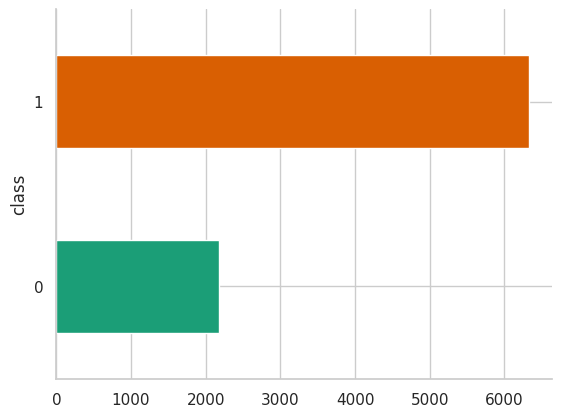

In [ ]:
# Bar chat for both her2 and EGFR

from matplotlib import pyplot as plt
import seaborn as sns
combined_data.groupby('class').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
combined_data["class"].value_counts()

,count
class,
1,6325
0,2179


In [ ]:
# Save the updated dataset to a new CSV file
combined_data.to_csv('combined_data.csv', index=False)

In [ ]:
her2_data = combined_data

In [ ]:
her2_data.shape

(8504, 2)

#### Chemical space analysis

In [ ]:
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import Descriptors
from rdkit.Chem.rdMolDescriptors import CalcNumAromaticRings, CalcNumRings
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

# Function to compute physicochemical properties
def compute_properties(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        # Handle invalid SMILES strings
        return None
    num_atoms = mol.GetNumAtoms()  # Number of atoms in the molecule
    properties = {
        'MW': Descriptors.MolWt(mol),  # Molecular weight
        'ALogP': Descriptors.MolLogP(mol),  # Octanol-water partition coefficient (ALogP)
        'nHAcc': Descriptors.NumHAcceptors(mol),  # Number of hydrogen bond acceptors
        'nHDon': Descriptors.NumHDonors(mol),  # Number of hydrogen bond donors
        'ARR': CalcNumAromaticRings(mol) / num_atoms if num_atoms > 0 else 0,  # Aromatic ring ratio
        'nCIC': CalcNumRings(mol),  # Number of rings in the structure
        'RBN': Descriptors.NumRotatableBonds(mol),  # Number of rotatable bonds
        'nBnz': CalcNumAromaticRings(mol)  # Number of benzene-like rings
    }
    return properties

# Drop rows with missing SMILES values
her2_data = her2_data.dropna(subset=['canonical_smiles'])

# Initialize a list to store the computed properties
properties_list = []

# Loop through each molecule in the dataframe and compute properties
for index, row in her2_data.iterrows():
    smiles = row['canonical_smiles']  # Get the canonical SMILES string
    molecule_class = row['class']  # Get the activity classification (1 for active, 0 for inactive)
    props = compute_properties(smiles)  # Compute properties for the molecule
    if props is not None:
        props['class'] = molecule_class  # Add the class to the properties
        properties_list.append(props)  # Append the properties to the list

# Convert the list of properties into a new dataframe
properties_df = pd.DataFrame(properties_list)

# Group by activity class (1 for active, 0 for inactive)
grouped = properties_df.groupby('class')

# Calculate descriptive statistics: min, max, median, and mean for each property
stats = grouped.agg(['min', 'max', 'median', 'mean'])

# Display the calculated statistics
print(stats)



ModuleNotFoundError: No module named 'rdkit'

In [ ]:
stats

MW                                   ALogP                   \
           min       max   median        mean      min     max   median   
class                                                                     
0      138.122   853.918  380.989  390.702113 -1.98000  8.8503  3.89415   
1      264.292  1145.358  506.937  521.725810 -0.60642  9.3856  4.93080   

                nHAcc                      nHDon                       ARR  \
           mean   min max median      mean   min max median      mean  min   
class                                                                        
0      3.988373     0  14    5.0  4.992925     0   7    2.0  1.646226  0.0   
1      5.021652     2  18    7.5  7.511380     0   8    2.0  2.119488  0.0   

                                    nCIC                      RBN             \
            max    median      mean  min max median      mean min max median   
class                                                                          
0      0.250000  0.105263  0.109558    1   8    4.0  3.648585   0  17    5.0   
1      0.214286  0.111111  0.111284    1   9    5.0  4.895448   0  18    7.0   

                nBnz                       
           mean  min max median      mean  
class                                      
0      4.884434    0   6    3.0  3.033019  
1      7.733997    0   7    4.0  4.077525

MW: Mann-Whitney U Test p-value = 1.0481e-83
ALogP: Mann-Whitney U Test p-value = 4.4302e-31
nHAcc: Mann-Whitney U Test p-value = 6.2646e-84
nHDon: Mann-Whitney U Test p-value = 2.2571e-22
ARR: Mann-Whitney U Test p-value = 2.2668e-03
nCIC: Mann-Whitney U Test p-value = 3.6465e-55
RBN: Mann-Whitney U Test p-value = 2.0016e-63
nBnz: Mann-Whitney U Test p-value = 9.5061e-47


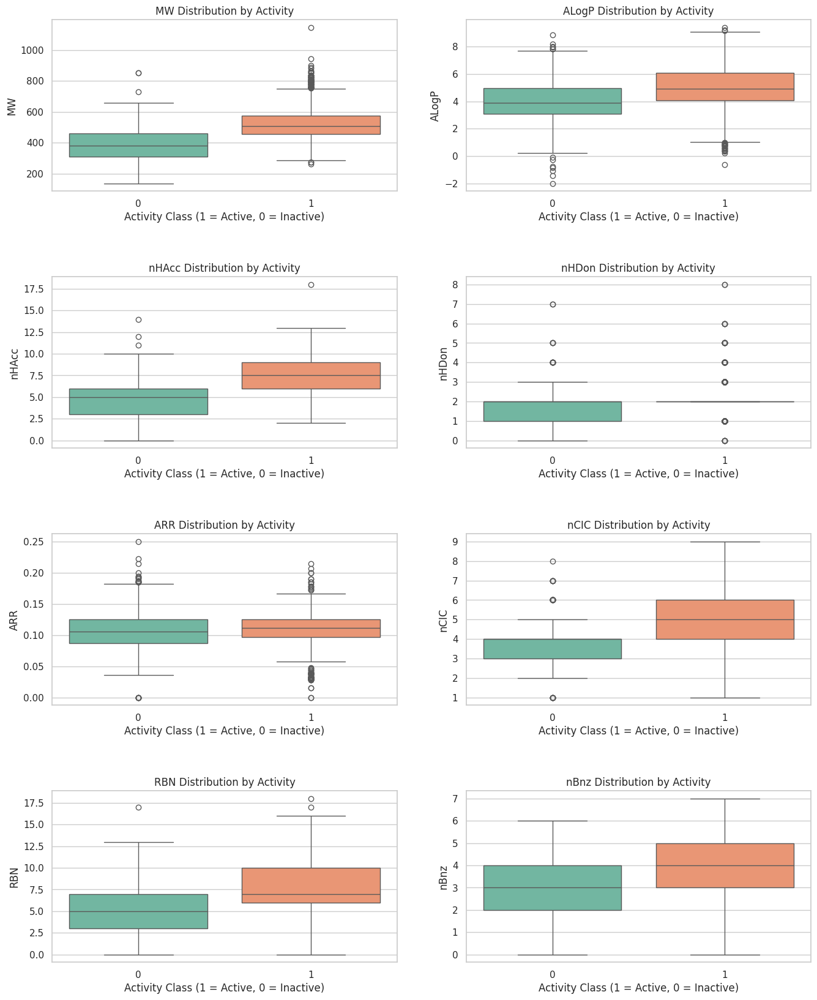

In [ ]:
# List of properties to compare
properties = ['MW', 'ALogP', 'nHAcc', 'nHDon', 'ARR', 'nCIC', 'RBN', 'nBnz']

# Perform the Mann-Whitney U Test to compare active and inactive groups
for prop in properties:
    active_values = properties_df[properties_df['class'] == 1][prop]  # Active group values
    inactive_values = properties_df[properties_df['class'] == 0][prop]  # Inactive group values
    stat, p_value = mannwhitneyu(active_values, inactive_values, alternative='two-sided')
    print(f"{prop}: Mann-Whitney U Test p-value = {p_value:.4e}")

# Visualize the properties using boxplots
plt.figure(figsize=(16, 20))
plt.subplots_adjust(hspace=0.5)

# Plot boxplots for each property
for i, prop in enumerate(properties, 1):
    plt.subplot(4, 2, i)
    sns.boxplot(x='class', y=prop, data=properties_df, palette='Set2')  # Create boxplot
    plt.title(f'{prop} Distribution by Activity')  # Set title
    plt.xlabel('Activity Class (1 = Active, 0 = Inactive)')  # X-axis label
    plt.ylabel(prop)  # Y-axis label

plt.show()  # Display the plots


In [ ]:
for prop in properties:
    active_values = properties_df[properties_df['class'] == 1][prop]
    inactive_values = properties_df[properties_df['class'] == 0][prop]

    # Check sizes
    print(f"Active values count for {prop}: {len(active_values)}")
    print(f"Inactive values count for {prop}: {len(inactive_values)}")

    # Perform Mann-Whitney U Test only if both groups have values
    if len(active_values) > 0 and len(inactive_values) > 0:
        stat, p_value = mannwhitneyu(active_values, inactive_values, alternative='two-sided')
        print(f"{prop}: Mann-Whitney U Test p-value = {p_value:.4e}")
    else:
        print(f"Skipping {prop}: One of the groups is empty.")


Active values count for MW: 1406
Inactive values count for MW: 424
MW: Mann-Whitney U Test p-value = 1.0481e-83
Active values count for ALogP: 1406
Inactive values count for ALogP: 424
ALogP: Mann-Whitney U Test p-value = 4.4302e-31
Active values count for nHAcc: 1406
Inactive values count for nHAcc: 424
nHAcc: Mann-Whitney U Test p-value = 6.2646e-84
Active values count for nHDon: 1406
Inactive values count for nHDon: 424
nHDon: Mann-Whitney U Test p-value = 2.2571e-22
Active values count for ARR: 1406
Inactive values count for ARR: 424
ARR: Mann-Whitney U Test p-value = 2.2668e-03
Active values count for nCIC: 1406
Inactive values count for nCIC: 424
nCIC: Mann-Whitney U Test p-value = 3.6465e-55
Active values count for RBN: 1406
Inactive values count for RBN: 424
RBN: Mann-Whitney U Test p-value = 2.0016e-63
Active values count for nBnz: 1406
Inactive values count for nBnz: 424
nBnz: Mann-Whitney U Test p-value = 9.5061e-47


In [ ]:
# Convert 'class' column to int if it's not already
properties_df['class'] = properties_df['class'].astype(int)


In [ ]:
# Recheck the active and inactive values for a specific property (e.g., MW)
active_mw_values = properties_df[properties_df['class'] == 1]['MW']
inactive_mw_values = properties_df[properties_df['class'] == 0]['MW']

print("Active MW values:\n", active_mw_values)
print("Inactive MW values:\n", inactive_mw_values)


Active MW values:
 0        383.814
1        482.903
2        559.630
3        525.972
4        509.973
5        560.618
6        495.946
7        497.559
8        511.989
9        509.973
10       602.699
11       540.422
13       558.869
14       526.439
15       485.947
16       513.961
18       498.385
20       498.381
21       521.379
22       497.397
26       343.386
27       520.655
28       357.413
29       581.069
30       510.516
31       466.966
32       573.090
33       506.628
34       616.662
35       438.553
36       554.694
37       383.451
38       562.671
39       566.108
40       531.663
41       555.689
42       599.660
43       584.098
44       477.974
49       340.404
61       332.469
64       341.392
65       384.413
70       397.481
79       435.281
80       465.307
81       479.334
84       504.432
86       478.350
89       504.432
90       451.280
91       541.837
92       488.548
93       503.563
94       349.781
95       398.651
96       442.523
97       428

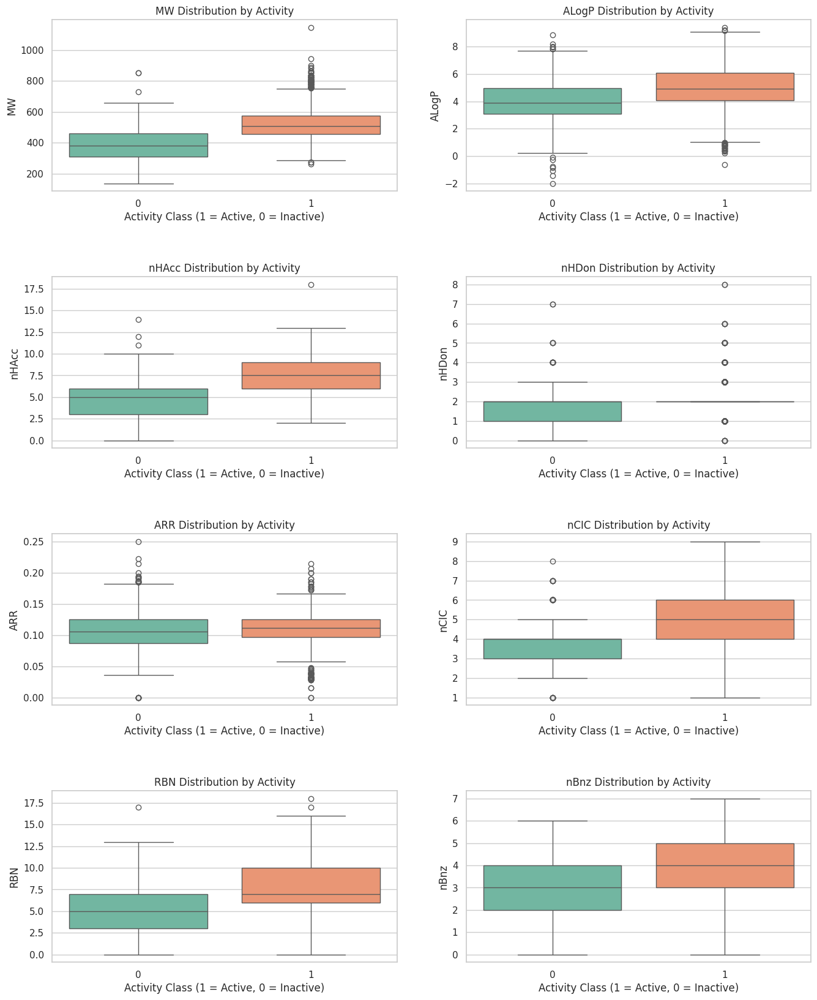

In [ ]:
# Visualize the properties using boxplots
plt.figure(figsize=(16, 20))
plt.subplots_adjust(hspace=0.5)

# Plot boxplots for each property
for i, prop in enumerate(properties, 1):
    plt.subplot(4, 2, i)
    sns.boxplot(x='class', y=prop, data=properties_df, palette='Set2')  # Create boxplot
    plt.title(f'{prop} Distribution by Activity')  # Set title
    plt.xlabel('Activity Class (1 = Active, 0 = Inactive)')  # X-axis label
    plt.ylabel(prop)  # Y-axis label

plt.show()  # Display the plots

##### Exploratory data analysis via Linpinski descriptors

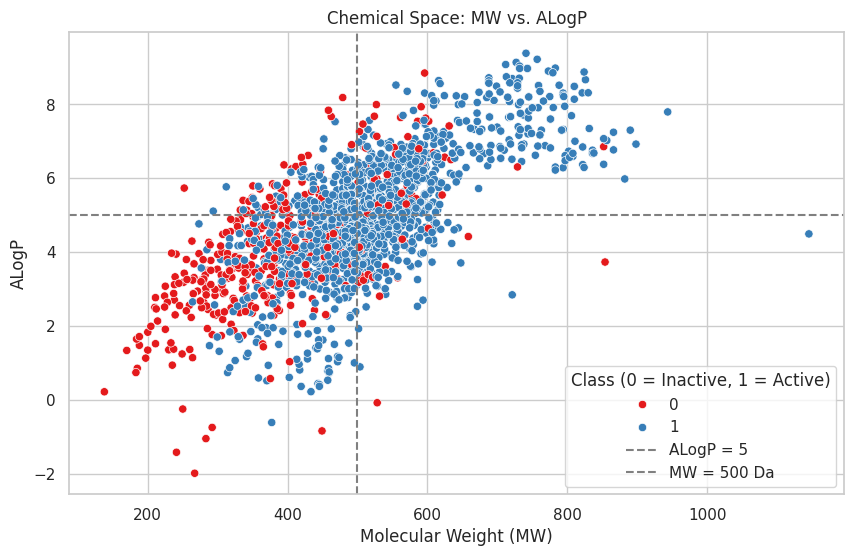

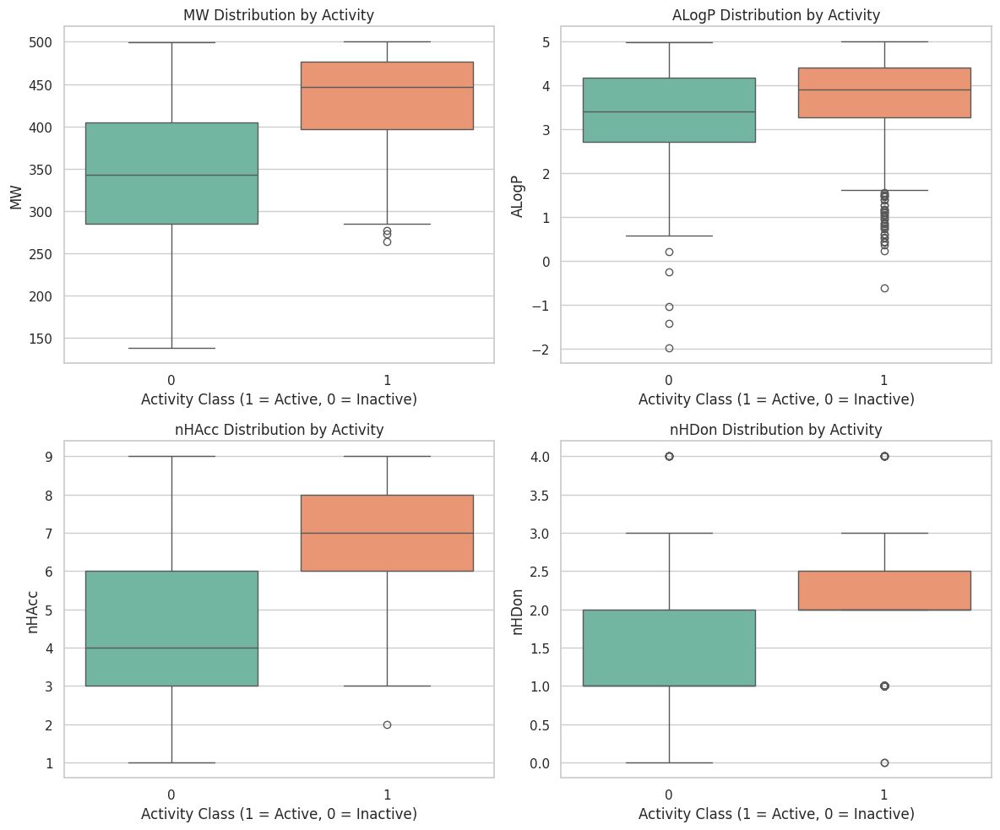

MW: Mann-Whitney U Test p-value = 7.8484e-49
ALogP: Mann-Whitney U Test p-value = 3.4045e-07
nHAcc: Mann-Whitney U Test p-value = 2.9972e-46
nHDon: Mann-Whitney U Test p-value = 3.9233e-14


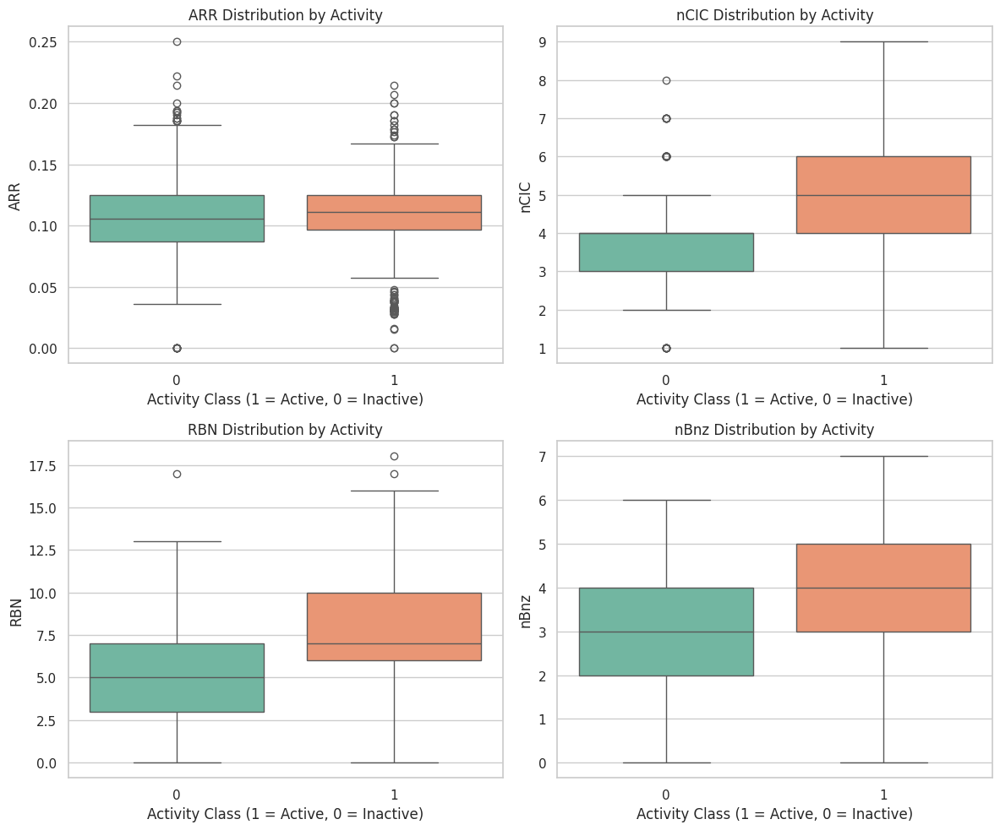

ARR: Mann-Whitney U Test p-value = 2.2668e-03
nCIC: Mann-Whitney U Test p-value = 3.6465e-55
RBN: Mann-Whitney U Test p-value = 2.0016e-63
nBnz: Mann-Whitney U Test p-value = 9.5061e-47


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# Assuming properties_df is the DataFrame containing the computed properties

# 1. Scatter plot of MW vs. ALogP for active vs. inactive compounds
plt.figure(figsize=(10, 6))
sns.scatterplot(x='MW', y='ALogP', hue='class', data=properties_df, palette='Set1')
plt.title('Chemical Space: MW vs. ALogP')
plt.xlabel('Molecular Weight (MW)')
plt.ylabel('ALogP')
plt.axhline(y=5, color='gray', linestyle='--', label='ALogP = 5')
plt.axvline(x=500, color='gray', linestyle='--', label='MW = 500 Da')
plt.legend(title='Class (0 = Inactive, 1 = Active)')
plt.show()

# 2. Ro5 Analysis: Filter compounds based on Ro5 thresholds
ro5_filter = (properties_df['MW'] < 500) & (properties_df['ALogP'] < 5) & (properties_df['nHAcc'] < 10) & (properties_df['nHDon'] < 5)
filtered_df = properties_df[ro5_filter]

# 3. Boxplots comparing active and inactive based on Ro5 descriptors
ro5_descriptors = ['MW', 'ALogP', 'nHAcc', 'nHDon']

plt.figure(figsize=(12, 10))
for i, desc in enumerate(ro5_descriptors, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x='class', y=desc, data=filtered_df, palette='Set2')
    plt.title(f'{desc} Distribution by Activity')
    plt.xlabel('Activity Class (1 = Active, 0 = Inactive)')
    plt.ylabel(desc)

plt.tight_layout()
plt.show()

# 4. Statistical Analysis with Mann-Whitney U Test
for desc in ro5_descriptors:
    active_values = filtered_df[filtered_df['class'] == 1][desc]
    inactive_values = filtered_df[filtered_df['class'] == 0][desc]

    if not active_values.empty and not inactive_values.empty:
        stat, p_value = mannwhitneyu(active_values, inactive_values, alternative='two-sided')
        print(f"{desc}: Mann-Whitney U Test p-value = {p_value:.4e}")
    else:
        print(f"Skipping {desc}: One of the groups is empty after filtering.")

# 5. Additional Boxplots for molecular complexity descriptors
complexity_descriptors = ['ARR', 'nCIC', 'RBN', 'nBnz']

plt.figure(figsize=(12, 10))
for i, desc in enumerate(complexity_descriptors, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x='class', y=desc, data=properties_df, palette='Set2')
    plt.title(f'{desc} Distribution by Activity')
    plt.xlabel('Activity Class (1 = Active, 0 = Inactive)')
    plt.ylabel(desc)

plt.tight_layout()
plt.show()

# Mann-Whitney U Test for molecular complexity
for desc in complexity_descriptors:
    active_values = properties_df[properties_df['class'] == 1][desc]
    inactive_values = properties_df[properties_df['class'] == 0][desc]

    if not active_values.empty and not inactive_values.empty:
        stat, p_value = mannwhitneyu(active_values, inactive_values, alternative='two-sided')
        print(f"{desc}: Mann-Whitney U Test p-value = {p_value:.4e}")
    else:
        print(f"Skipping {desc}: One of the groups is empty after filtering.")


In [ ]:
filtered_df

,MW,ALogP,nHAcc,nHDon,ARR,nCIC,RBN,nBnz,class
0,383.814,4.45034,4,3,0.111111,4,3,3,1
1,482.903,3.61432,6,3,0.088235,5,4,3,1
6,495.946,3.52952,6,3,0.085714,5,4,3,1
7,497.559,2.39272,7,4,0.081081,5,7,3,1
12,417.465,3.88178,7,1,0.096774,3,10,3,0
15,485.947,4.39150,7,2,0.088235,4,9,3,1
17,393.443,3.40510,7,1,0.103448,3,10,3,0
18,498.385,3.09350,7,3,0.093750,3,9,3,1
19,470.932,4.75228,7,1,0.090909,4,8,3,0
20,498.381,4.12550,7,2,0.093750,3,9,3,1


#### Molecular Fingerprints

In [ ]:
# Load the dataset
her2_data = her2_data

# Convert SMILES strings to RDKit molecule objects and add as a new column
her2_data['mol'] = her2_data['canonical_smiles'].apply(Chem.MolFromSmiles)

In [ ]:
# Define fingerprint functions for molecular descriptors

def get_atom_pair_fp(mol):
    """
    Generate the Atom Pair fingerprint for a molecule.

    Args:
    mol (rdkit.Chem.Mol): RDKit molecule object

    Returns:
    list: Atom Pair fingerprint as a list of integers
    """
    return list(rdFingerprintGenerator.GetAtomPairGenerator().GetCountFingerprint(mol))

def get_maccs_keys(mol):
    """
    Generate the MACCS keys fingerprint for a molecule.

    Args:
    mol (rdkit.Chem.Mol): RDKit molecule object

    Returns:
    list: MACCS keys fingerprint as a list of integers
    """
    return list(MACCSkeys.GenMACCSKeys(mol))

def get_2d_atom_pair_fp(mol):
    """
    Generate the 2D Atom Pair fingerprint for a molecule.

    Args:
    mol (rdkit.Chem.Mol): RDKit molecule object

    Returns:
    list: 2D Atom Pair fingerprint as a list of bits
    """
    return list(rdMolDescriptors.GetHashedAtomPairFingerprintAsBitVect(mol))

def get_cdk_fp(mol):
    """
    Generate the Topological Torsion fingerprint (CDK) for a molecule.

    Args:
    mol (rdkit.Chem.Mol): RDKit molecule object

    Returns:
    list: Topological Torsion fingerprint as a list of bits
    """
    return list(rdMolDescriptors.GetHashedTopologicalTorsionFingerprintAsBitVect(mol))

def get_cdk_extended_fp(mol):
    """
    Generate the Extended Morgan fingerprint (CDK) with radius 3 and 2048 bits for a molecule.

    Args:
    mol (rdkit.Chem.Mol): RDKit molecule object

    Returns:
    list: Extended Morgan fingerprint as a list of bits
    """
    return list(Chem.rdMolDescriptors.GetMorganFingerprintAsBitVect(mol, radius=3, nBits=2048))

def get_cdk_graph_fp(mol):
    """
    Generate the RDKit Graph fingerprint for a molecule.

    Args:
    mol (rdkit.Chem.Mol): RDKit molecule object

    Returns:
    list: RDKit Graph fingerprint as a list of bits
    """
    return list(Chem.RDKFingerprint(mol))

def get_circle_fp(mol):
    """
    Generate the Morgan fingerprint with radius 2 and 2048 bits for a molecule.

    Args:
    mol (rdkit.Chem.Mol): RDKit molecule object

    Returns:
    list: Morgan fingerprint with radius 2 as a list of bits
    """
    return list(rdMolDescriptors.GetMorganFingerprintAsBitVect(mol, radius=2, nBits=2048))

def get_estate_fp(mol):
    """
    Generate the E-State fingerprint for a molecule.

    Args:
    mol (rdkit.Chem.Mol): RDKit molecule object

    Returns:
    list: E-State fingerprint as a list of bits
    """
    fp = EStateFingerprinter.FingerprintMol(mol)
    return list(np.concatenate(fp))

def get_hybrid_fp(mol):
    """
    Generate the Hybrid Morgan fingerprint with chirality and radius 2, using 2048 bits.

    Args:
    mol (rdkit.Chem.Mol): RDKit molecule object

    Returns:
    list: Hybrid Morgan fingerprint as a list of bits
    """
    return list(rdMolDescriptors.GetMorganFingerprintAsBitVect(mol, radius=2, useChirality=True, nBits=2048))

def get_klekota_roth_fp(mol):
    """
    Generate the Klekota-Roth fingerprint with 2048 bits for a molecule.

    Args:
    mol (rdkit.Chem.Mol): RDKit molecule object

    Returns:
    list: Klekota-Roth fingerprint as a list of bits
    """
    return list(rdMolDescriptors.GetHashedAtomPairFingerprintAsBitVect(mol, nBits=2048))

def get_pubchem_fp(mol):
    """
    Generate the PubChem fingerprint for a molecule using the SMILES representation.

    Args:
    mol (rdkit.Chem.Mol): RDKit molecule object

    Returns:
    np.array: PubChem fingerprint as a numpy array of bits
    """
    smiles = Chem.MolToSmiles(mol)
    compound = pcp.get_compounds(smiles, 'smiles')[0]
    fingerprint = compound.cactvs_fingerprint
    return np.array([int(bit) for bit in fingerprint])

In [ ]:

from rdkit.Chem import MACCSkeys, rdMolDescriptors, Crippen

# Create a safe function to handle exceptions
def safe_get_fingerprint(func, mol):
    try:
        if mol is None:
            return np.nan  # Return NaN if molecule is not valid
        return func(mol)
    except Exception as e:
        print(f"Error generating fingerprint: {e}")
        return np.nan

# Define molecular descriptor and fingerprint functions

def get_maccs_keys(mol):
    return list(MACCSkeys.GenMACCSKeys(mol))

def get_2d_atom_pair_fp(mol):
    return list(rdMolDescriptors.GetHashedAtomPairFingerprintAsBitVect(mol))

def get_cdk_fp(mol):
    return list(rdMolDescriptors.GetHashedTopologicalTorsionFingerprintAsBitVect(mol))

# Additional fingerprint functions
def get_cdk_extended_fp(mol):
    return list(rdMolDescriptors.GetMorganFingerprintAsBitVect(mol, radius=3, nBits=2048))

def get_cdk_graph_fp(mol):
    return list(Chem.RDKFingerprint(mol))

def get_circle_fp(mol):
    return list(rdMolDescriptors.GetMorganFingerprintAsBitVect(mol, radius=2, nBits=2048))

def get_estate_fp(mol):
    fp = EStateFingerprinter.FingerprintMol(mol)
    return list(np.concatenate(fp))

def get_hybrid_fp(mol):
    return list(rdMolDescriptors.GetMorganFingerprintAsBitVect(mol, radius=2, useChirality=True, nBits=2048))

def get_klekota_roth_fp(mol):
    return list(rdMolDescriptors.GetHashedAtomPairFingerprintAsBitVect(mol, nBits=2048))

def get_pubchem_fp(mol):
    try:
        smiles = Chem.MolToSmiles(mol)
        compound = pcp.get_compounds(smiles, 'smiles')[0]
        fingerprint = compound.cactvs_fingerprint
        return np.array([int(bit) for bit in fingerprint])
    except Exception as e:
        print(f"Error fetching PubChem fingerprint: {e}")
        return np.nan

In [ ]:
# Define a dictionary to map fingerprint types to their corresponding functions
fingerprint_functions = {
    'MACCS': get_maccs_keys,
    '2D Atom Pair': get_2d_atom_pair_fp,
    'CDK': get_cdk_fp,
    'CDK Extended': get_cdk_extended_fp,
    'CDK Graph': get_cdk_graph_fp,
    'Circle': get_circle_fp,
    'Estate': get_estate_fp,
    'Hybrid': get_hybrid_fp,
    'Klekota-Roth': get_klekota_roth_fp,
    'Pubchem': get_pubchem_fp
}

In [ ]:
# Safe function to get fingerprints with default value handling
def safe_get_fingerprint(func, mol):
    try:
        fingerprint = func(mol)
        if fingerprint is None:
            return np.nan  # or a default value you choose
        return fingerprint
    except Exception as e:
        print(f"Error fetching fingerprint: {e}")
        return np.nan  # or a default value you choose

# Function to generate a separate DataFrame for each fingerprint
def generate_separate_dataframes(her2_data, fingerprint_functions):
    separate_dfs = {}  # Dictionary to store separate dataframes

    # Generate fingerprint dataframes
    for name, func in fingerprint_functions.items():
        her2_data[f'{name}_FP'] = her2_data['mol'].apply(lambda mol: safe_get_fingerprint(func, mol))
        # Handle cases where fingerprints are NaN
        fingerprint_data = her2_data[f'{name}_FP'].apply(pd.Series)
        separate_dfs[f'{name}_FP'] = fingerprint_data.fillna(0)  # Replace NaN with 0 or another default value
        print(f"Created DataFrame for {name} fingerprint")

    return separate_dfs

# Apply the function
separate_dataframes = generate_separate_dataframes(her2_data, fingerprint_functions)

In [ ]:
separate_dataframes

In [ ]:
separate_dataframes.to_csv('separate_dataframes.csv', index=False)

###FINGERPRINTS

###Atom pair 2D

In [ ]:
_2d_atom_pair_fp = separate_dataframes['2D Atom Pair_FP']

In [ ]:
_2d_atom_pair_fp.head()

0     1     2     3     4     5     6     7     8     9     10    11    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     1     1     0     0     1     1     1     0     1     0     0     0   
2     1     1     0     0     1     1     1     0     1     1     0     0   
3     1     1     0     0     1     1     1     0     1     0     0     0   
4     1     1     0     0     1     1     1     0     1     0     0     0   

   12    13    14    15    16    17    18    19    20    21    22    23    \
0     0     0     0     0     1     1     0     0     0     0     0     0   
1     0     0     0     0     1     1     1     0     0     0     0     0   
2     0     0     0     0     1     1     1     0     1     0     0     0   
3     0     0     0     0     1     1     1     0     0     0     0     0   
4     0     0     0     0     1     1     1     0     0     0     0     0   

   24    25    26    27    28    29    30    31    32    33    34    35    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   36    37    38    39    40    41    42    43    44    45    46    47    \
0     0     0     0     0     0     0     0     0     1     1     1     0   
1     0     0     0     0     1     1     0     0     1     1     1     1   
2     0     0     0     0     1     1     1     0     1     1     1     1   
3     0     0     0     0     1     1     0     0     1     1     1     1   
4     0     0     0     0     1     1     0     0     1     1     1     1   

   48    49    50    51    52    53    54    55    56    57    58    59    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     1     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   60    61    62    63    64    65    66    67    68    69    70    71    \
0     0     0     0     0     1     1     1     0     0     0     0     0   
1     0     0     0     0     1     1     0     0     1     0     0     0   
2     0     0     0     0     1     1     0     0     0     0     0     0   
3     0     0     0     0     1     1     0     0     0     0     0     0   
4     0     0     0     0     1     1     0     0     1     0     0     0   

   72    73    74    75    76    77    78    79    80    81    82    83    \
0     1     1     1     0     0     0     0     0     0     0     0     0   
1     1     1     1     0     1     0     0     0     0     0     0     0   
2     1     1     1     0     1     0     0     0     0     0     0     0   
3     1     1     1     0     1     0     0     0     0     0     0     0   
4     1     1     1     0     1     0     0     0     0     0     0     0   

   84    85    86    87    88    89    90    91    92    93    94    95    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     1     0     0     0   
4     0     0     0     0     0     0     0     0     1     0     0     0   

   96    97    98    99    100   101   102   103   104   105   106   107   \
0     0     0     0     0     0     0     0     0     1     1     0     0   
1     0     0     0     0     1     1     0     0     1     1     0     0   
2     1     1     0     0     1     1     0     0     1     1     0 

In [ ]:
# Save individual dataframes to files Save to CSV
_2d_atom_pair_fp.to_csv('AtomPair_Fingerprint.csv', index=False)

#### MACCS

In [ ]:
# Accessing individual DataFrames
maccs_df = separate_dataframes['MACCS_FP']

In [ ]:
maccs_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,1,1,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,1,0,1,0,0,0,1,0,1,1,1,0,1,0,0,0,0,1,1,1,1,0,0,0,1,1,1,0,0,1,0,1,0,1,0,1,1,1,1,1,1,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0,0,1,0,1,1,1,0,0,0,1,1,0,0,1,1,1,1,1,1,1,0,1,0,1,0,1,0,1,1,1,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,1,1,1,0,1,1,1,1,1,1,1,1,0,0,0,1,1,1,1,1,1,1,0,1,1,0,1,1,0,1,1,1,1,1,1,1,1,1,1,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0,0,1,0,1,1,0,0,0,0,1,1,0,0,1,1,1,1,1,1,1,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,1,1,1,0,1,1,1,0,1,1,1,1,0,0,0,1,1,1,1,1,1,1,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0,1,1,0,1,1,1,0,0,0,1,1,0,0,1,1,1,1,1,1,1,0,1,1,1,0,1,0,1,1,1,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,1,1,1,0,1,1,1,1,1,1,1,1,0,0,0,1,1,1,1,1,1,1,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0,0,1,0,1,1,1,0,0,0,1,1,0,0,1,1,1,1,1,1,1,0,1,0,1,0,1,1,0,1,1,0,0,1,0,1,1,1,0,1,1,1,0,0,1,0,1,1,1,0,1,0,1,1,1,1,1,1,0,0,0,1,1,1,1,0,1,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,1,1,1,0


In [ ]:
# Save individual dataframes to files Save to CSV
maccs_df.to_csv('MACCSS_Fingerprint.csv', index=False)

#### Topological Torsion (CDK) fingerprint

In [ ]:
# Accessing individual DataFrames
CDK_df = separate_dataframes['CDK_FP']


In [ ]:
CDK_df.head()

0     1     2     3     4     5     6     7     8     9     10    11    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   12    13    14    15    16    17    18    19    20    21    22    23    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     1     1     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   24    25    26    27    28    29    30    31    32    33    34    35    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   36    37    38    39    40    41    42    43    44    45    46    47    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   48    49    50    51    52    53    54    55    56    57    58    59    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     1     1     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   60    61    62    63    64    65    66    67    68    69    70    71    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   72    73    74    75    76    77    78    79    80    81    82    83    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   84    85    86    87    88    89    90    91    92    93    94    95    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   96    97    98    99    100   101   102   103   104   105   106   107   \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0 

#### Extended Morgan fingerprint (CDK)

In [ ]:
# Accessing individual DataFrames
CDK_Extended_df = separate_dataframes['CDK Extended_FP']

In [ ]:
CDK_Extended_df.head()

0     1     2     3     4     5     6     7     8     9     10    11    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     1   
2     0     0     0     0     0     0     0     0     0     0     0     1   
3     0     0     0     0     0     0     0     0     1     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   12    13    14    15    16    17    18    19    20    21    22    23    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   24    25    26    27    28    29    30    31    32    33    34    35    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     1     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     1     0   

   36    37    38    39    40    41    42    43    44    45    46    47    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     1     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   48    49    50    51    52    53    54    55    56    57    58    59    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   60    61    62    63    64    65    66    67    68    69    70    71    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     1     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   72    73    74    75    76    77    78    79    80    81    82    83    \
0     0     0     0     0     0     0     1     0     0     0     0     0   
1     0     0     0     0     0     0     1     0     0     0     0     0   
2     0     0     0     0     0     0     1     0     1     0     0     0   
3     0     0     0     0     0     0     1     0     1     0     0     0   
4     0     0     1     0     0     0     1     0     1     0     0     0   

   84    85    86    87    88    89    90    91    92    93    94    95    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     1     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   96    97    98    99    100   101   102   103   104   105   106   107   \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     1     0     0     0     1     0     0 

#### CDK Graph fingerprint

In [ ]:
CDK_Graph_df = separate_dataframes['CDK Graph_FP']

In [ ]:
CDK_Graph_df .head()

0     1     2     3     4     5     6     7     8     9     10    11    \
0     1     0     1     1     0     1     0     1     1     0     1     1   
1     1     0     1     1     0     1     0     1     1     0     1     1   
2     1     0     1     1     0     1     1     1     1     0     1     1   
3     1     0     1     1     0     1     0     1     1     0     1     1   
4     1     0     1     1     0     1     0     1     1     0     1     1   

   12    13    14    15    16    17    18    19    20    21    22    23    \
0     0     1     0     1     1     0     1     0     1     1     1     0   
1     0     1     1     1     1     0     1     0     1     1     1     0   
2     0     1     1     1     1     0     1     0     0     1     1     0   
3     0     1     0     1     1     0     1     0     1     1     1     0   
4     0     1     1     1     1     0     1     0     1     1     1     0   

   24    25    26    27    28    29    30    31    32    33    34    35    \
0     1     1     1     0     1     0     1     1     1     0     1     1   
1     1     1     1     0     1     0     1     1     1     0     1     1   
2     1     1     1     0     1     0     1     1     1     0     1     1   
3     1     1     1     0     1     0     1     1     1     0     1     1   
4     1     1     1     0     1     0     1     1     1     0     1     1   

   36    37    38    39    40    41    42    43    44    45    46    47    \
0     1     0     0     1     1     1     1     1     1     0     0     1   
1     1     0     1     1     1     1     1     1     1     1     0     1   
2     1     0     1     1     1     1     1     1     1     1     0     1   
3     1     0     0     1     1     1     1     1     1     1     0     1   
4     1     0     0     1     1     1     1     1     1     1     0     1   

   48    49    50    51    52    53    54    55    56    57    58    59    \
0     1     1     1     1     1     0     1     1     0     0     0     1   
1     1     1     1     1     1     1     1     1     0     0     0     1   
2     1     1     1     1     1     1     1     1     0     0     0     1   
3     1     1     1     1     1     1     1     1     0     0     0     1   
4     1     1     1     1     1     1     1     1     0     0     0     1   

   60    61    62    63    64    65    66    67    68    69    70    71    \
0     1     1     0     1     1     0     1     0     1     1     1     1   
1     1     1     1     1     1     0     1     0     1     1     1     1   
2     1     1     1     1     1     1     1     0     1     1     1     1   
3     1     1     0     1     1     0     1     0     1     1     1     1   
4     1     1     1     1     1     0     1     0     1     1     1     1   

   72    73    74    75    76    77    78    79    80    81    82    83    \
0     1     0     1     0     1     1     1     0     0     1     1     1   
1     1     0     1     0     1     1     1     0     0     1     1     1   
2     1     0     1     0     1     1     1     0     0     1     1     1   
3     1     0     1     0     1     1     1     0     0     1     1     1   
4     1     0     1     0     1     1     1     0     0     1     1     1   

   84    85    86    87    88    89    90    91    92    93    94    95    \
0     0     1     0     1     1     0     0     0     1     1     0     0   
1     0     1     0     1     1     0     0     0     1     1     0     0   
2     0     1     0     1     1     0     0     0     1     1     1     1   
3     0     1     0     1     1     0     0     0     1     1     0     0   
4     0     1     0     1     1     0     0     0     1     1     0     0   

   96    97    98    99    100   101   102   103   104   105   106   107   \
0     1     1     1     0     1     0     1     1     1     1     0     0   
1     1     1     1     0     1     1     1     1     1     1     0     0   
2     1     1     1     0     0     1     1     1     1     1     0 

 #### Morgan fingerprint with radius 2 (circle)

In [ ]:
Circle_df = separate_dataframes['Circle_FP']

In [ ]:
Circle_df.head()

0     1     2     3     4     5     6     7     8     9     10    11    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     1   
2     0     0     0     0     0     0     0     0     0     0     0     1   
3     0     0     0     0     0     0     0     0     1     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   12    13    14    15    16    17    18    19    20    21    22    23    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   24    25    26    27    28    29    30    31    32    33    34    35    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     1     0   

   36    37    38    39    40    41    42    43    44    45    46    47    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     1     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   48    49    50    51    52    53    54    55    56    57    58    59    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   60    61    62    63    64    65    66    67    68    69    70    71    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     1     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   72    73    74    75    76    77    78    79    80    81    82    83    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     1     0     0     0   
3     0     0     0     0     0     0     0     0     1     0     0     0   
4     0     0     1     0     0     0     0     0     1     0     0     0   

   84    85    86    87    88    89    90    91    92    93    94    95    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   96    97    98    99    100   101   102   103   104   105   106   107   \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     1     0     0     0     0     0     0 

#### E-State fingerprint

In [ ]:
Estate_df = separate_dataframes['Estate_FP']

In [ ]:
Estate_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157
0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,5.0,0.0,0.0,0.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.913566,0.0,0.000000,0.0,1.773492,7.608568,0.0,0.0,0.0,0.170000,4.288470,0.000000,0.0,0.0,0.0,0.0,0.0,5.825359,3.228704,0.0,0.0,0.0,8.392338,0.000000,0.0,0.000000,0.0,0.0,12.497581,0.000000,0.0,13.399867,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.846499,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,1.0,5.0,0.0,0.0,0.0,3.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.855084,0.0,2.077805,0.0,1.665451,7.258677,0.0,0.0,0.0,-0.154097,2.942091,0.000000,0.0,0.0,0.0,0.0,0.0,5.799385,3.130888,0.0,0.0,0.0,8.425905,1.729131,0.0,0.000000,0.0,0.0,25.635377,5.312854,0.0,13.542332,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.890227,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,5.0,0.0,1.0,12.0,0.0,0.0,0.0,3.0,8.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,2.0,1.0,0.0,1.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.909280,0.0,2.955817,0.0,1.757961,23.935055,0.0,0.0,0.0,0.052376,5.634634,2.213402,0.0,0.0,0.0,0.0,0.0,6.242648,3.213724,0.0,0.0,0.0,8.790753,1.769676,0.0,2.219264,0.0,0.0,26.102810,5.369267,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,6.0,0.0,1.0,5.0,0.0,0.0,0.0,3.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.849545,0.0,4.387316,0.0,1.659912,7.238734,0.0,0.0,0.0,-0.270467,2.859993,0.000000,0.0,0.0,0.0,0.0,0.0,8.736450,3.108414,0.0,0.0,0.0,8.441403,2.239401,0.0,0.000000,0.0,0.0,25.537869,5.343796,0.0,13.575572,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.903173,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,5.0,0.0,1.0,5.0,0.0,0.0,0.0,3.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.993377,0.0,4.030520,0.0,1.688970,7.331806,0.0,0.0,0.0,-0.070625,3.074541,0.000000,0.0,0.0,0.0,0.0,0.0,5.834470,3.183299,0.0,0.0,0.0,8.467852,4.151727,0.0,0.000000,0.0,0.0,25.935885,0.000000,0.0,13.579967,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.

#### Hybrid Morgan fingerprint with chirality

In [ ]:
Hybrid_df = separate_dataframes['Hybrid_FP']

In [ ]:
Hybrid_df.head()

0     1     2     3     4     5     6     7     8     9     10    11    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     1   
2     0     0     0     0     0     0     0     0     0     0     0     1   
3     0     0     0     0     0     0     0     0     1     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   12    13    14    15    16    17    18    19    20    21    22    23    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   24    25    26    27    28    29    30    31    32    33    34    35    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     1     0   

   36    37    38    39    40    41    42    43    44    45    46    47    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     1     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   48    49    50    51    52    53    54    55    56    57    58    59    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   60    61    62    63    64    65    66    67    68    69    70    71    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     1     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   72    73    74    75    76    77    78    79    80    81    82    83    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     1     0     0     0   
3     0     0     0     0     0     0     0     0     1     0     0     0   
4     0     0     1     0     0     0     0     0     1     0     0     0   

   84    85    86    87    88    89    90    91    92    93    94    95    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   96    97    98    99    100   101   102   103   104   105   106   107   \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     1     0     0     0     0     0     0 

#### Klekota-Roth fingerprint

In [ ]:
Klekota_Roth_df = separate_dataframes['Klekota-Roth_FP']

In [ ]:
Klekota_Roth_df.head()

0     1     2     3     4     5     6     7     8     9     10    11    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     1     1     0     0     1     1     1     0     1     0     0     0   
2     1     1     0     0     1     1     1     0     1     1     0     0   
3     1     1     0     0     1     1     1     0     1     0     0     0   
4     1     1     0     0     1     1     1     0     1     0     0     0   

   12    13    14    15    16    17    18    19    20    21    22    23    \
0     0     0     0     0     1     1     0     0     0     0     0     0   
1     0     0     0     0     1     1     1     0     0     0     0     0   
2     0     0     0     0     1     1     1     0     1     0     0     0   
3     0     0     0     0     1     1     1     0     0     0     0     0   
4     0     0     0     0     1     1     1     0     0     0     0     0   

   24    25    26    27    28    29    30    31    32    33    34    35    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   36    37    38    39    40    41    42    43    44    45    46    47    \
0     0     0     0     0     0     0     0     0     1     1     1     0   
1     0     0     0     0     1     1     0     0     1     1     1     1   
2     0     0     0     0     1     1     1     0     1     1     1     1   
3     0     0     0     0     1     1     0     0     1     1     1     1   
4     0     0     0     0     1     1     0     0     1     1     1     1   

   48    49    50    51    52    53    54    55    56    57    58    59    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     1     0     0     0   
3     0     0     0     0     0     0     0     0     0     0     0     0   
4     0     0     0     0     0     0     0     0     0     0     0     0   

   60    61    62    63    64    65    66    67    68    69    70    71    \
0     0     0     0     0     1     1     1     0     0     0     0     0   
1     0     0     0     0     1     1     0     0     1     0     0     0   
2     0     0     0     0     1     1     0     0     0     0     0     0   
3     0     0     0     0     1     1     0     0     0     0     0     0   
4     0     0     0     0     1     1     0     0     1     0     0     0   

   72    73    74    75    76    77    78    79    80    81    82    83    \
0     1     1     1     0     0     0     0     0     0     0     0     0   
1     1     1     1     0     1     0     0     0     0     0     0     0   
2     1     1     1     0     1     0     0     0     0     0     0     0   
3     1     1     1     0     1     0     0     0     0     0     0     0   
4     1     1     1     0     1     0     0     0     0     0     0     0   

   84    85    86    87    88    89    90    91    92    93    94    95    \
0     0     0     0     0     0     0     0     0     0     0     0     0   
1     0     0     0     0     0     0     0     0     0     0     0     0   
2     0     0     0     0     0     0     0     0     0     0     0     0   
3     0     0     0     0     0     0     0     0     1     0     0     0   
4     0     0     0     0     0     0     0     0     1     0     0     0   

   96    97    98    99    100   101   102   103   104   105   106   107   \
0     0     0     0     0     0     0     0     0     1     1     0     0   
1     0     0     0     0     1     1     0     0     1     1     0     0   
2     1     1     0     0     1     1     0     0     1     1     0 

#### Pubchem_FP

In [ ]:
# Accessing individual DataFrames
pubchem_df = separate_dataframes['Pubchem_FP']

In [ ]:
pubchem_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880
0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0

In [ ]:
# Save individual dataframes to files Save to CSV
pubchem_df.to_csv('Pubchem_Fingerprint.csv', index=False)

In [ ]:
her2_data.shape

(8504, 13)

#### Splitting her2_data into Training and Independent Test Sets for Active and Inactive Compounds

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Assuming 'her2_data' is your dataframe with compounds and their classification status
# Columns: 'compound', 'class' where 'class' is 1 for active and 0 for inactive

# Separate active and inactive compounds
active_compounds = her2_data[her2_data['class'] == 1]
inactive_compounds = her2_data[her2_data['class'] == 0]

# Check that the data matches the required number
print(f"Active compounds: {len(active_compounds)}, Inactive compounds: {len(inactive_compounds)}")

Active compounds: 6325, Inactive compounds: 2179


In [ ]:
# Randomly select training and independent test sets for actives
active_train, active_test = train_test_split(active_compounds, train_size=5060, random_state=42)

# Randomly select training and independent test sets for inactives
inactive_train, inactive_test = train_test_split(inactive_compounds, train_size=1743, random_state=42)

# Combine active and inactive compounds for training
train_data = pd.concat([active_train, inactive_train])
test_data = pd.concat([active_test, inactive_test])

# Shuffle datasets to mix actives and inactives
train_data = train_data.sample(frac=1, random_state=42).reset_index(drop=True)
test_data = test_data.sample(frac=1, random_state=42).reset_index(drop=True)

# Check the final distribution
print(f"Training set: {len(train_data)} compounds, Test set: {len(test_data)} compounds")

# Now you have the AR-TRN (training set) and AR-IND (independent test set)


Training set: 6803 compounds, Test set: 1701 compounds


In [ ]:
train_data

,canonical_smiles,class
0,COc1cc(C2=C(c3c[nH]c4ccccc34)C(=O)NC2=O)cc(OC)...,0
1,COCCOc1cc2ncnc(Nc3ccc(F)c(Cl)c3)c2cc1NC(=O)CCC...,1
2,COc1cc2c(Nc3cc(Cl)c(Cl)cc3F)ncnc2cc1OCC1CN(C)CCO1,1
3,FC(F)(F)c1ccc(/C=C/c2nc(COc3ccc(CCCCn4ccnn4)cc...,1
4,N#Cc1cnc2ccc(NC(=O)CC3CCSS3)cc2c1Nc1ccc(OCc2cc...,1
5,O=C(/C=C/CN1CCOCC1)Nc1cc2c(Nc3ccc(F)c(Cl)c3)nc...,1
6,OCCn1ccc2ncnc(Nc3ccc(Oc4cccc5sncc45)c(Cl)c3)c21,1
7,COCCOc1cc2ncnc(Nc3ccc4c(cnn4Cc4ccccc4)c3)c2cc1...,1
8,COC(=O)C1=Cc2c(ncnc2Nc2ccc(Oc3cccc(C(F)(F)F)c3...,1
9,COc1cc(C=C(C#N)C#N)cc(CSc2ccccc2C(=O)O)c1O,0


In [ ]:
train_data.to_csv('train_data.csv', index=False)

In [ ]:
test_data

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
test_data.to_csv('test_data.csv', index=False)

In [ ]:
test_data = pd.read_csv('/test_data.csv')

In [ ]:
# Access the individual DataFrames (assuming 'separate_dataframes' is a dictionary of DataFrames)
_2d_atom_pair_fp = separate_dataframes['2D Atom Pair_FP']
maccs_df = separate_dataframes['MACCS_FP']
CDK_df = separate_dataframes['CDK_FP']
CDK_Extended_df = separate_dataframes['CDK Extended_FP']
CDK_Graph_df = separate_dataframes['CDK Graph_FP']
Circle_df = separate_dataframes['Circle_FP']
Estate_df = separate_dataframes['Estate_FP']
Hybrid_df = separate_dataframes['Hybrid_FP']
pubchem_df = separate_dataframes['Pubchem_FP']
Klekota_Roth_df = separate_dataframes['Klekota-Roth_FP']

In [ ]:
# definition of descriptors dictionary
descriptors = {
    '2D Atom Pair_FP': _2d_atom_pair_fp,
    'MACCS_FP': maccs_df,
    'CDK_FP': CDK_df,
    'CDK Extended_FP': CDK_Extended_df,
    'CDK Graph_FP': CDK_Graph_df,
    'Circle_FP': Circle_df,
    'Estate_FP': Estate_df,
    'Hybrid_FP': Hybrid_df,
    'Pubchem_FP': pubchem_df,
    'Klekota-Roth_FP': Klekota_Roth_df
}


In [ ]:
# Combine the individual DataFrames into a single feature matrix
features = pd.concat([
    _2d_atom_pair_fp,
    maccs_df,
    CDK_df,
    CDK_Extended_df,
    CDK_Graph_df,
    Circle_df,
    Estate_df,
    Hybrid_df,
    pubchem_df,
    Klekota_Roth_df,
], axis=1)

In [ ]:
# List of descriptors (already calculated)
descriptors = {
    '2D Atom Pair_FP': _2d_atom_pair_fp,
    'MACCS_FP': maccs_df,
    'CDK_FP': CDK_df,
    'CDK Extended_FP': CDK_Extended_df,
    'CDK Graph_FP': CDK_Graph_df,
    'Circle_FP': Circle_df,
    'Estate_FP': Estate_df,
    'Hybrid_FP': Hybrid_df,
    'Pubchem_FP': pubchem_df,
    'Klekota-Roth_FP': Klekota_Roth_df
}

# Models to evaluate
models = {
    'RF': RandomForestClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'LGBM': GradientBoostingClassifier(),
    'MLP': MLPClassifier(),
    'DT': DecisionTreeClassifier(),
    'ET': ExtraTreesClassifier(),
    'XGB': GradientBoostingClassifier(),
    'KNN': KNeighborsClassifier(),
    'LR': LogisticRegression(),
    'SVM Linear': SVC(kernel='linear', probability=True),
    'SVM RBF': SVC(kernel='rbf', probability=True)
}

####  Evaluate on Independent Test Set

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier,
                              GradientBoostingClassifier, ExtraTreesClassifier)
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import (f1_score, confusion_matrix, roc_auc_score)
from sklearn.preprocessing import StandardScaler
# Import necessary libraries
from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier,
                              GradientBoostingClassifier, ExtraTreesClassifier)
from sklearn.linear_model import (LogisticRegression, RidgeCV)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.cross_decomposition import PLSRegression  # Import for PLS Regression

In [ ]:
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import matthews_corrcoef, accuracy_score, recall_score, confusion_matrix, roc_auc_score
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import ExtraTreesClassifier
import numpy as np
import tensorflow as tf

In [ ]:
# DataFrame to store evaluation results on the independent test set
test_results_df = pd.DataFrame(columns=['Descriptor', 'Model', 'Test Accuracy', 'Test F1 Score', 'Test Sensitivity', 'Test Specificity', 'Test MCC', 'Test AUC'])

# Function to train and evaluate on independent test data
def train_and_evaluate_on_independent(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Check if model supports probability predictions
    if hasattr(model, "predict_proba"):
        y_pred_prob = model.predict_proba(X_test)[:, 1]
        auc_value = roc_auc_score(y_test, y_pred_prob)
    else:
        auc_value = None

    # Confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

    # Metrics calculation
    metrics = {
        'Accuracy': accuracy_score(y_test, y_pred),
        'F1 Score': f1_score(y_test, y_pred),
        'Sensitivity': recall_score(y_test, y_pred),
        'Specificity': tn / (tn + fp) if (tn + fp) > 0 else 0,
        'MCC': matthews_corrcoef(y_test, y_pred),
        'AUC': auc_value
    }

    return metrics

# Loop to evaluate models on the independent test set (AR-IND)
for descriptor_name, descriptor_df in descriptors.items():
    X = descriptor_df
    y = her2_data['class']
    y = y.astype(int)

    # Align indices of X with those of train_data and test_data
    X = X.loc[X.index.intersection(train_data.index.union(test_data.index))]
    y = y.loc[y.index.intersection(train_data.index.union(test_data.index))]

    # Ensure X and y are sorted by the indices to maintain consistency
    X = X.sort_index()
    y = y.sort_index()

    # Define the training and test sets
    X_train = X.loc[train_data.index.intersection(X.index)]
    y_train = y.loc[train_data.index.intersection(y.index)]
    X_test = X.loc[test_data.index.intersection(X.index)]
    y_test = y.loc[test_data.index.intersection(y.index)]

    print(f"Evaluating models for descriptor: {descriptor_name} on independent test set")

    # Train and evaluate each model
    for model_name, model in models.items():
        try:
            metrics = train_and_evaluate_on_independent(model, X_train, y_train, X_test, y_test)

            # Store the results in the DataFrame
            temp_df = pd.DataFrame([{
                'Descriptor': descriptor_name,
                'Model': model_name,
                'Test Accuracy': metrics['Accuracy'],
                'Test F1 Score': metrics['F1 Score'],
                'Test Sensitivity': metrics['Sensitivity'],
                'Test Specificity': metrics['Specificity'],
                'Test MCC': metrics['MCC'],
                'Test AUC': metrics['AUC']
            }])

            test_results_df = pd.concat([test_results_df, temp_df], ignore_index=True)
            print(f"Results on independent test set for {model_name}: {metrics}")

        except Exception as e:
            print(f"Error with model {model_name} on test set: {e}")

    print(f"Completed evaluations for descriptor {descriptor_name} on test set\n")

# Display the test evaluation results
print(test_results_df)


Evaluating models for descriptor: 2D Atom Pair_FP on independent test set
Results on independent test set for RF: {'Accuracy': 1.0, 'F1 Score': 1.0, 'Sensitivity': 1.0, 'Specificity': 1.0, 'MCC': 1.0, 'AUC': 1.0}
Results on independent test set for AdaBoost: {'Accuracy': 0.9234972677595629, 'F1 Score': 0.9411764705882353, 'Sensitivity': 0.9739130434782609, 'Specificity': 0.8382352941176471, 'MCC': 0.8360082347521399, 'AUC': 0.9767423273657289}


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-17-378090af0521>", line 56, in <cell line: 32>
    metrics = train_and_evaluate_on_independent(model, X_train, y_train, X_test, y_test)
  File "<ipython-input-17-378090af0521>", line 6, in train_and_evaluate_on_independent
    model.fit(X_train, y_train)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py", line 783, in fit
    n_stages = self._fit_stages(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py", line 879, in _fit_stages
    raw_predictions = self._fit_stage(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py", line 490, in _fit_stage
    tree.fit(
  File "/usr/lo

TypeError: object of type 'NoneType' has no len()

In [ ]:
test_results_df

,Descriptor,Model,Test Accuracy,Test F1 Score,Test Sensitivity,Test Specificity,Test MCC,Test AUC
0,2D Atom Pair_FP,RF,0.992063,0.994170,0.996968,0.981702,0.981783,0.999879
1,2D Atom Pair_FP,AdaBoost,0.862728,0.902769,0.938935,0.701738,0.676343,0.928048
2,2D Atom Pair_FP,LGBM,0.905056,0.932384,0.964487,0.779506,0.778475,0.964026
3,2D Atom Pair_FP,MLP,0.992063,0.994162,0.995669,0.984446,0.981782,0.999834
4,2D Atom Pair_FP,DT,0.993533,0.995213,0.990472,1.000000,0.985357,0.999874
5,2D Atom Pair_FP,ET,0.993533,0.995213,0.990472,1.000000,0.985357,0.999874
6,2D Atom Pair_FP,XGB,0.905056,0.932384,0.964487,0.779506,0.778475,0.964026
7,2D Atom Pair_FP,KNN,0.940035,0.956816,0.978779,0.858188,0.861218,0.989395
8,2D Atom Pair_FP,LR,0.953851,0.966360,0.976613,0.905764,0.893417,0.988830
9,2D Atom Pair_FP,SVM Linear,0.970899,0.978696,0.984842,0.941446,0.932985,0.988894


In [ ]:
# saving the results to a CSV file
test_results_df.to_csv('independent_test_model_evaluation_results.csv', index=False)

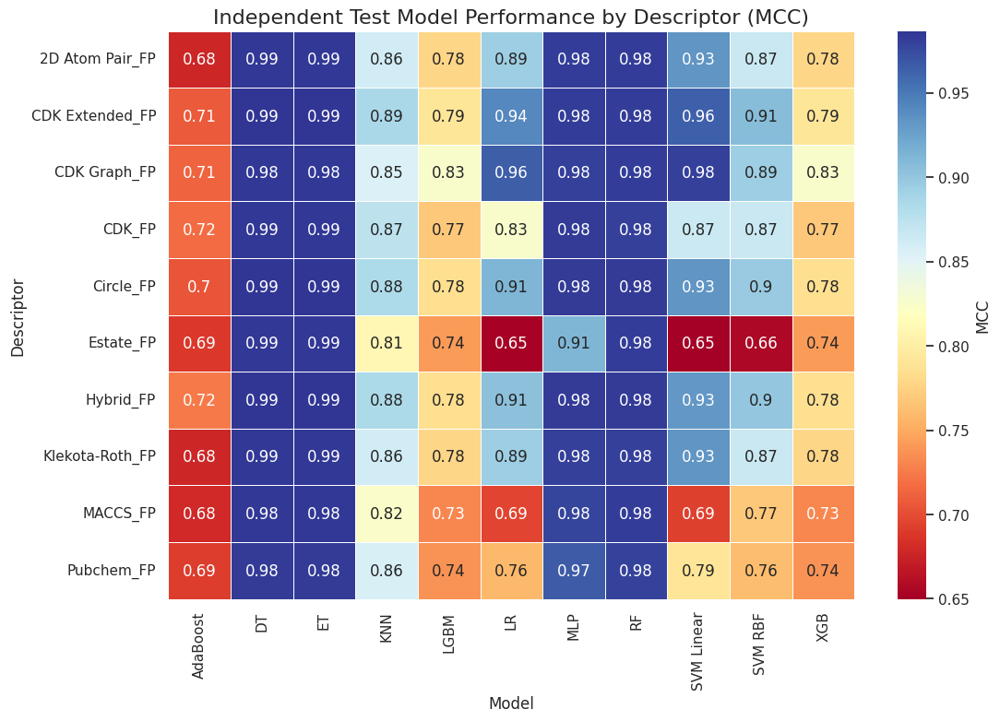

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

heatmap_data = test_results_df.pivot(index="Descriptor", columns="Model", values="Test MCC")

# Set up the matplotlib figure with an appropriate size
plt.figure(figsize=(12, 8))

# Create the heatmap
# 'annot=True' displays the MCC values inside the cells
# 'cmap="RdYlBu"' sets the color map from red to yellow to blue
# 'linewidths=0.5' adds lines between the cells for clarity
# 'cbar_kws' customizes the color bar label
sns.heatmap(heatmap_data, annot=True, cmap="RdYlBu", linewidths=0.5, cbar_kws={'label': 'MCC'})

# Set the plot title and axis labels with font size adjustments
plt.title('Independent Test Model Performance by Descriptor (MCC)', fontsize=16)
plt.ylabel('Descriptor', fontsize=12)
plt.xlabel('Model', fontsize=12)

# Display the heatmap
plt.show()


In [ ]:
test_results_df = pd.read_csv('/content/independent_test_model_evaluation_results.csv')

In [ ]:
test_results_df.columns

Index(['Descriptor', 'Model', 'Test Accuracy', 'Test F1 Score',
       'Test Sensitivity', 'Test Specificity', 'Test MCC', 'Test AUC'],
      dtype='object')

In [ ]:
# Select the top 20 models based on MCC score
top_20_models_test = test_results_df.nlargest(20, 'Test MCC')

# Reset the index to rearrange the models
top_20_models_test = top_20_models_test.reset_index(drop=True)

In [ ]:
top_20_models_test

,Descriptor,Model,Test Accuracy,Test F1 Score,Test Sensitivity,Test Specificity,Test MCC,Test AUC
0,Hybrid_FP,DT,0.994121,0.995650,0.991338,1.000000,0.986673,0.999897
1,Hybrid_FP,ET,0.994121,0.995650,0.991338,1.000000,0.986673,0.999897
2,CDK Extended_FP,DT,0.993827,0.995432,0.990905,1.000000,0.986015,0.999888
3,CDK Extended_FP,ET,0.993827,0.995432,0.990905,1.000000,0.986015,0.999888
4,Circle_FP,DT,0.993827,0.995432,0.990905,1.000000,0.986015,0.999888
5,Circle_FP,ET,0.993827,0.995432,0.990905,1.000000,0.986015,0.999888
6,2D Atom Pair_FP,DT,0.993533,0.995213,0.990472,1.000000,0.985357,0.999874
7,2D Atom Pair_FP,ET,0.993533,0.995213,0.990472,1.000000,0.985357,0.999874
8,CDK_FP,DT,0.993533,0.995213,0.990472,1.000000,0.985357,0.999874
9,CDK_FP,ET,0.993533,0.995213,0.990472,1.000000,0.985357,0.999874


In [ ]:
# Select the top 20 models based on MCC score
top_5_models_test = test_results_df.nlargest(5, 'Test MCC')

# Reset the index to rearrange the models
top_5_models_test = top_5_models_test.reset_index(drop=True)

In [ ]:
top_5_models_test

,Descriptor,Model,Test Accuracy,Test F1 Score,Test Sensitivity,Test Specificity,Test MCC,Test AUC
0,Hybrid_FP,DT,0.994121,0.995650,0.991338,1.0,0.986673,0.999897
1,Hybrid_FP,ET,0.994121,0.995650,0.991338,1.0,0.986673,0.999897
2,CDK Extended_FP,DT,0.993827,0.995432,0.990905,1.0,0.986015,0.999888
3,CDK Extended_FP,ET,0.993827,0.995432,0.990905,1.0,0.986015,0.999888
4,Circle_FP,DT,0.993827,0.995432,0.990905,1.0,0.986015,0.999888


In [ ]:
top_5_models_test.to_csv('top_5_models_test.csv', index=False)

In [ ]:
'''#TRAIN NO CV
# DataFrame to store evaluation results on the training set
train_results_df = pd.DataFrame(columns=['Descriptor', 'Model', 'Train Accuracy', 'Train F1 Score', 'Train Sensitivity', 'Train Specificity', 'Train MCC', 'Train AUC'])

# Function to train and evaluate on the training data
def train_and_evaluate_on_training(model, X_train, y_train):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_train)

    # Check if model supports probability predictions
    if hasattr(model, "predict_proba"):
        y_pred_prob = model.predict_proba(X_train)[:, 1]
        auc_value = roc_auc_score(y_train, y_pred_prob)
    else:
        auc_value = None

    # Confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_train, y_pred).ravel()

    # Metrics calculation
    metrics = {
        'Accuracy': accuracy_score(y_train, y_pred),
        'F1 Score': f1_score(y_train, y_pred),
        'Sensitivity': recall_score(y_train, y_pred),
        'Specificity': tn / (tn + fp) if (tn + fp) > 0 else 0,
        'MCC': matthews_corrcoef(y_train, y_pred),
        'AUC': auc_value
    }

    return metrics

# Loop to evaluate models on the training set
for descriptor_name, descriptor_df in descriptors.items():
    X = descriptor_df
    y = her2_data['class']
    y = y.astype(int)

    # Align indices of X with those of train_data
    X = X.loc[X.index.intersection(train_data.index)]
    y = y.loc[y.index.intersection(train_data.index)]

    # Ensure X and y are sorted by the indices to maintain consistency
    X = X.sort_index()
    y = y.sort_index()

    # Define the training set
    X_train = X.loc[train_data.index.intersection(X.index)]
    y_train = y.loc[train_data.index.intersection(y.index)]

    print(f"Evaluating models for descriptor: {descriptor_name} on training set")

    # Train and evaluate each model
    for model_name, model in models.items():
        try:
            metrics = train_and_evaluate_on_training(model, X_train, y_train)

            # Store the results in the DataFrame
            temp_df = pd.DataFrame([{
                'Descriptor': descriptor_name,
                'Model': model_name,
                'Train Accuracy': metrics['Accuracy'],
                'Train F1 Score': metrics['F1 Score'],
                'Train Sensitivity': metrics['Sensitivity'],
                'Train Specificity': metrics['Specificity'],
                'Train MCC': metrics['MCC'],
                'Train AUC': metrics['AUC']
            }])

            train_results_df = pd.concat([train_results_df, temp_df], ignore_index=True)
            print(f"Results on training set for {model_name}: {metrics}")

        except Exception as e:
            print(f"Error with model {model_name} on training set: {e}")

    print(f"Completed evaluations for descriptor {descriptor_name} on training set\n")

# Display the training evaluation results
print(train_results_df)


####  Train with 5-Fold Cross-Validation

In [ ]:
'''from sklearn.model_selection import StratifiedKFold
import pandas as pd
from sklearn.metrics import (accuracy_score, f1_score, recall_score,
                             confusion_matrix, matthews_corrcoef, roc_auc_score)

# DataFrame to store cross-validation results
cv_results_df = pd.DataFrame(columns=['Descriptor', 'Model', 'CV Accuracy', 'CV F1 Score', 'CV Sensitivity', 'CV Specificity', 'CV MCC', 'CV AUC'])

# Function to perform cross-validation and collect metrics
def cross_validate_and_evaluate(model, X, y, cv):
    fold_metrics = []

    for fold, (train_idx, val_idx) in enumerate(cv.split(X, y), start=1):
        X_train_fold, X_val_fold = X.iloc[train_idx], X.iloc[val_idx]
        y_train_fold, y_val_fold = y.iloc[train_idx], y.iloc[val_idx]

        model.fit(X_train_fold, y_train_fold)
        y_pred = model.predict(X_val_fold)

        # Check if model supports probability predictions
        if hasattr(model, "predict_proba"):
            y_pred_prob = model.predict_proba(X_val_fold)[:, 1]
            auc_value = roc_auc_score(y_val_fold, y_pred_prob)
        else:
            auc_value = None

        # Confusion matrix
        tn, fp, fn, tp = confusion_matrix(y_val_fold, y_pred).ravel()

        # Metrics calculation
        metrics = {
            'Accuracy': accuracy_score(y_val_fold, y_pred),
            'F1 Score': f1_score(y_val_fold, y_pred),
            'Sensitivity': recall_score(y_val_fold, y_pred),
            'Specificity': tn / (tn + fp) if (tn + fp) > 0 else 0,
            'MCC': matthews_corrcoef(y_val_fold, y_pred),
            'AUC': auc_value
        }

        fold_metrics.append(metrics)

    # Average the metrics across all folds
    avg_metrics = {metric: sum(d[metric] for d in fold_metrics) / len(fold_metrics) for metric in fold_metrics[0]}
    return avg_metrics

# Loop through descriptors and perform 10-fold cross-validation
for descriptor_name, descriptor_df in descriptors.items():
    X = descriptor_df
    y = her2_data['class'].astype(int)

    # Align indices of X with those of train_data
    X = X.loc[X.index.intersection(train_data.index)]
    y = y.loc[y.index.intersection(train_data.index)]

    # Ensure X and y are sorted by the indices to maintain consistency
    X = X.sort_index()
    y = y.sort_index()

    print(f"Performing 10-fold cross-validation for descriptor: {descriptor_name}")

    # Define 10-fold cross-validation
    cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Train and evaluate each model with cross-validation
    for model_name, model in models.items():
        try:
            avg_metrics = cross_validate_and_evaluate(model, X, y, cv)

            # Store the average results in the DataFrame
            temp_df = pd.DataFrame([{
                'Descriptor': descriptor_name,
                'Model': model_name,
                'CV Accuracy': avg_metrics['Accuracy'],
                'CV F1 Score': avg_metrics['F1 Score'],
                'CV Sensitivity': avg_metrics['Sensitivity'],
                'CV Specificity': avg_metrics['Specificity'],
                'CV MCC': avg_metrics['MCC'],
                'CV AUC': avg_metrics['AUC']
            }])

            cv_results_df = pd.concat([cv_results_df, temp_df], ignore_index=True)

            print(f"Completed 10-fold cross-validation for {model_name} on {descriptor_name}")

        except Exception as e:
            print(f"Error with model {model_name} during cross-validation: {e}")

    print(f"Completed 10-fold cross-validation for descriptor {descriptor_name}\n")

# Display the cross-validation evaluation results
print(cv_results_df)



Performing 10-fold cross-validation for descriptor: 2D Atom Pair_FP


KeyboardInterrupt: 

In [ ]:
from sklearn.model_selection import StratifiedKFold
import pandas as pd
from sklearn.metrics import (accuracy_score, f1_score, recall_score,
                             confusion_matrix, matthews_corrcoef, roc_auc_score)
import shap

# DataFrame to store cross-validation results
cv_results_df = pd.DataFrame(columns=['Descriptor', 'Model', 'CV Accuracy', 'CV F1 Score',
                                      'CV Sensitivity', 'CV Specificity', 'CV MCC', 'CV AUC'])

# Function to perform cross-validation and collect metrics
def cross_validate_and_evaluate(model, X, y, cv):
    fold_metrics = []

    for fold, (train_idx, val_idx) in enumerate(cv.split(X, y), start=1):
        X_train_fold, X_val_fold = X.iloc[train_idx], X.iloc[val_idx]
        y_train_fold, y_val_fold = y.iloc[train_idx], y.iloc[val_idx]

        model.fit(X_train_fold, y_train_fold)
        y_pred = model.predict(X_val_fold)

        # Check if model supports probability predictions
        if hasattr(model, "predict_proba"):
            y_pred_prob = model.predict_proba(X_val_fold)[:, 1]
            auc_value = roc_auc_score(y_val_fold, y_pred_prob)
        else:
            auc_value = None

        # Confusion matrix
        tn, fp, fn, tp = confusion_matrix(y_val_fold, y_pred).ravel()

        # Metrics calculation
        metrics = {
            'Accuracy': accuracy_score(y_val_fold, y_pred),
            'F1 Score': f1_score(y_val_fold, y_pred),
            'Sensitivity': recall_score(y_val_fold, y_pred),
            'Specificity': tn / (tn + fp) if (tn + fp) > 0 else 0,
            'MCC': matthews_corrcoef(y_val_fold, y_pred),
            'AUC': auc_value
        }

        fold_metrics.append(metrics)

    # Average the metrics across all folds
    avg_metrics = {metric: sum(d[metric] for d in fold_metrics) / len(fold_metrics) for metric in fold_metrics[0]}
    return avg_metrics

# Dictionary to store model objects
model_objects = {}

# Loop through descriptors and perform 5-fold cross-validation
for descriptor_name, descriptor_df in descriptors.items():
    X = descriptor_df
    y = her2_data['class'].astype(int)

    # Align indices of X with those of train_data
    X = X.loc[X.index.intersection(train_data.index)]
    y = y.loc[y.index.intersection(train_data.index)]

    # Ensure X and y are sorted by the indices to maintain consistency
    X = X.sort_index()
    y = y.sort_index()

    print(f"Performing 5-fold cross-validation for descriptor: {descriptor_name}")

    # Define 5-fold cross-validation
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Train and evaluate each model with cross-validation
    for model_name, model in models.items():
        try:
            avg_metrics = cross_validate_and_evaluate(model, X, y, cv)

            # Store the average results in the DataFrame
            temp_df = pd.DataFrame([{
                'Descriptor': descriptor_name,
                'Model': model_name,
                'CV Accuracy': avg_metrics['Accuracy'],
                'CV F1 Score': avg_metrics['F1 Score'],
                'CV Sensitivity': avg_metrics['Sensitivity'],
                'CV Specificity': avg_metrics['Specificity'],
                'CV MCC': avg_metrics['MCC'],
                'CV AUC': avg_metrics['AUC']
            }])

            cv_results_df = pd.concat([cv_results_df, temp_df], ignore_index=True)

            # Store the model object in the dictionary
            model_objects[(descriptor_name, model_name)] = model

            print(f"Completed 5-fold cross-validation for {model_name} on {descriptor_name}")

        except Exception as e:
            print(f"Error with model {model_name} during cross-validation: {e}")

    print(f"Completed 5-fold cross-validation for descriptor {descriptor_name}\n")

# Display the cross-validation evaluation results
print(cv_results_df)


Performing 5-fold cross-validation for descriptor: 2D Atom Pair_FP
Completed 5-fold cross-validation for RF on 2D Atom Pair_FP
Completed 5-fold cross-validation for AdaBoost on 2D Atom Pair_FP
Completed 5-fold cross-validation for LGBM on 2D Atom Pair_FP
Completed 5-fold cross-validation for MLP on 2D Atom Pair_FP
Completed 5-fold cross-validation for DT on 2D Atom Pair_FP
Completed 5-fold cross-validation for ET on 2D Atom Pair_FP
Completed 5-fold cross-validation for XGB on 2D Atom Pair_FP
Completed 5-fold cross-validation for KNN on 2D Atom Pair_FP
Completed 5-fold cross-validation for LR on 2D Atom Pair_FP
Completed 5-fold cross-validation for SVM Linear on 2D Atom Pair_FP
Completed 5-fold cross-validation for SVM RBF on 2D Atom Pair_FP
Completed 5-fold cross-validation for descriptor 2D Atom Pair_FP

Performing 5-fold cross-validation for descriptor: MACCS_FP
Completed 5-fold cross-validation for RF on MACCS_FP
Completed 5-fold cross-validation for AdaBoost on MACCS_FP
Completed 5

In [ ]:
cv_results_df

,Descriptor,Model,CV Accuracy,CV F1 Score,CV Sensitivity,CV Specificity,CV MCC,CV AUC
0,2D Atom Pair_FP,RF,0.903018,0.936507,0.966807,0.721053,0.739705,0.967297
1,2D Atom Pair_FP,AdaBoost,0.890736,0.927922,0.951139,0.718421,0.707126,0.914047
2,2D Atom Pair_FP,LGBM,0.905075,0.937350,0.959430,0.750000,0.745687,0.953958
3,2D Atom Pair_FP,MLP,0.916679,0.944471,0.957574,0.800000,0.779531,0.961078
4,2D Atom Pair_FP,DT,0.892101,0.927617,0.933602,0.773684,0.717605,0.853643
5,2D Atom Pair_FP,ET,0.910538,0.941045,0.964960,0.755263,0.760889,0.970129
6,2D Atom Pair_FP,XGB,0.906440,0.938363,0.962195,0.747368,0.749084,0.954140
7,2D Atom Pair_FP,KNN,0.897559,0.932825,0.961273,0.715789,0.724223,0.941539
8,2D Atom Pair_FP,LR,0.913278,0.942106,0.953896,0.797368,0.771896,0.958836
9,2D Atom Pair_FP,SVM Linear,0.907123,0.937603,0.943745,0.802632,0.757818,0.944751


In [ ]:
# saving the results to a CSV file
cv_results_df.to_csv('cv_train_model_evaluation_results.csv', index=False)

Index(['Descriptor', 'Model', 'CV Accuracy', 'CV F1 Score', 'CV Sensitivity',
       'CV Specificity', 'CV MCC', 'CV AUC'],
      dtype='object')


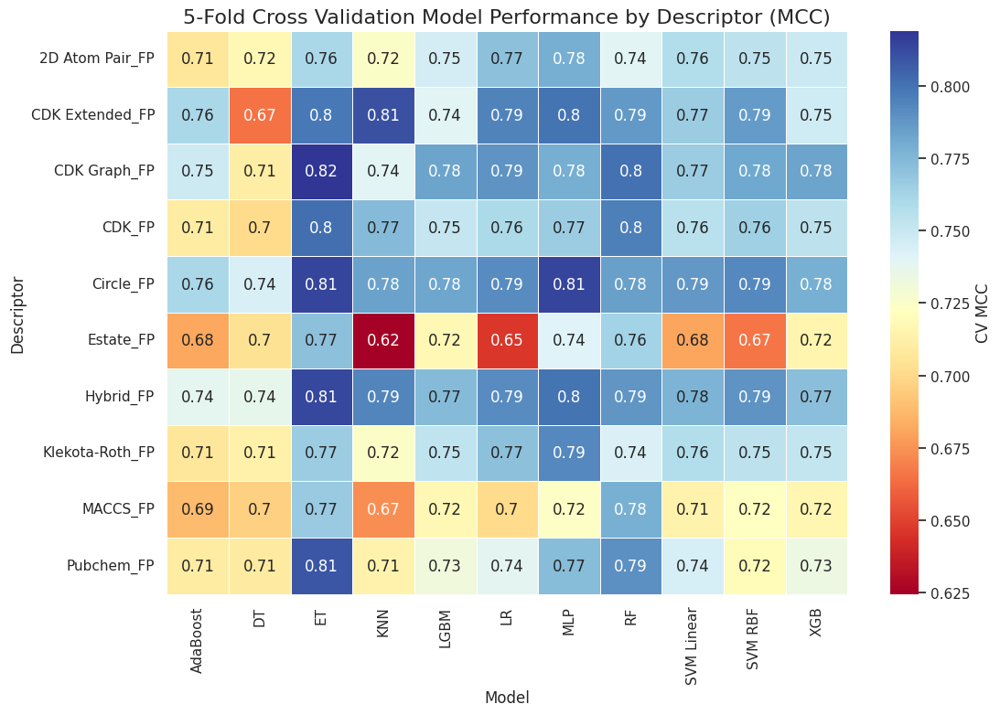

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Print the columns of cv_results_df to check for the correct name
print(cv_results_df.columns)

# Use the correct column name for MCC in the heatmap
heatmap_data = cv_results_df.pivot(index="Descriptor", columns="Model", values="CV MCC")  # Change 'MCC' to 'CV MCC'

# Set up the matplotlib figure with an appropriate size
plt.figure(figsize=(12, 8))

# Create the heatmap
sns.heatmap(heatmap_data, annot=True, cmap="RdYlBu", linewidths=0.5, cbar_kws={'label': 'CV MCC'})

# Set the plot title and axis labels with font size adjustments
plt.title('5-Fold Cross Validation Model Performance by Descriptor (MCC)', fontsize=16)
plt.ylabel('Descriptor', fontsize=12)
plt.xlabel('Model', fontsize=12)

# Display the heatmap
plt.show()


In [ ]:
model_objects


In [ ]:
# Select the top 20 models based on MCC score
top_20_models = cv_results_df.nlargest(20, 'CV MCC')

# Reset the index to rearrange the models
top_20_models = top_20_models.reset_index(drop=True)

In [ ]:
# Display the selected top 20 models
print("Top 20 models based on MCC:")
print(top_20_models)


Top 20 models based on MCC:
         Descriptor    Model  CV Accuracy  CV F1 Score  CV Sensitivity  \
0      CDK Graph_FP       ET     0.930338     0.953065        0.956648   
1         Circle_FP       ET     0.928980     0.952286        0.957578   
2         Circle_FP      MLP     0.929653     0.953121        0.965873   
3         Hybrid_FP       ET     0.928978     0.952408        0.960347   
4   CDK Extended_FP      KNN     0.927610     0.951504        0.960347   
5        Pubchem_FP       ET     0.927610     0.951736        0.964030   
6            CDK_FP       ET     0.924190     0.949119        0.955726   
7      CDK Graph_FP       RF     0.924188     0.949296        0.959417   
8   CDK Extended_FP      MLP     0.924192     0.949457        0.962186   
9         Hybrid_FP      MLP     0.924190     0.949433        0.961265   
10  CDK Extended_FP       ET     0.922827     0.948150        0.953887   
11           CDK_FP       RF     0.922829     0.948667        0.963108   
12  CDK Ex

In [ ]:
top_20_models

,Descriptor,Model,CV Accuracy,CV F1 Score,CV Sensitivity,CV Specificity,CV MCC,CV AUC
0,Hybrid_FP,ET,0.934454,0.953901,0.963095,0.865714,0.842363,0.977823
1,Circle_FP,ET,0.931933,0.951950,0.957143,0.871429,0.836713,0.977908
2,CDK Extended_FP,ET,0.930252,0.950563,0.952381,0.877143,0.833836,0.978010
3,CDK Extended_FP,LR,0.930252,0.950859,0.958333,0.862857,0.832989,0.973367
4,CDK Graph_FP,ET,0.929412,0.949975,0.952381,0.874286,0.831553,0.971361
5,CDK_FP,ET,0.929412,0.950281,0.957143,0.862857,0.830150,0.977721
6,CDK Graph_FP,MLP,0.928571,0.949756,0.958333,0.857143,0.828615,0.972415
7,Circle_FP,LR,0.928571,0.949929,0.960714,0.851429,0.828328,0.974320
8,Hybrid_FP,MLP,0.928571,0.949782,0.957143,0.860000,0.827757,0.973639
9,Circle_FP,MLP,0.927731,0.949310,0.959524,0.851429,0.825411,0.974048


In [ ]:
# Select the top 10 models based on the highest 'CV MCC' scores from the top 20 models
top_5_models = top_20_models.nlargest(5, 'CV MCC')

In [ ]:
top_5_models

,Descriptor,Model,CV Accuracy,CV F1 Score,CV Sensitivity,CV Specificity,CV MCC,CV AUC
0,CDK Graph_FP,ET,0.930338,0.953065,0.956648,0.855263,0.819088,0.970236
1,Circle_FP,ET,0.928980,0.952286,0.957578,0.847368,0.813967,0.973646
2,Circle_FP,MLP,0.929653,0.953121,0.965873,0.826316,0.813901,0.964031
3,Hybrid_FP,ET,0.928978,0.952408,0.960347,0.839474,0.813287,0.972256
4,CDK Extended_FP,KNN,0.927610,0.951504,0.960347,0.834211,0.809988,0.955668


In [ ]:
top_5_models.to_csv('top_5_models_cv.csv', index=False)

#### SHAP anlysis and virtual screening TRY

In [ ]:
import joblib
import matplotlib.pyplot as plt
import shap

# Define function to plot SHAP summary for each model in top_20_models
def plot_shap_summary(row, index):
    """
    Plots a SHAP summary plot for a given model and descriptor.

    Parameters:
        row (pd.Series): A row from the top_20_models DataFrame containing model details.
        index (int): Index of the row to position the subplot.

    Returns:
        None
    """
    descriptor_name = row['Descriptor']
    model_name = row['Model']
    model_object = model_objects[(descriptor_name, model_name)]

    # Extract and align the descriptor data for SHAP explanation
    X_train_descriptor = descriptors[descriptor_name].reindex(train_data.index).dropna()

    # Initialize SHAP explainer with adjusted max_evals
    explainer = shap.Explainer(model_object.predict, X_train_descriptor)
    shap_values = explainer(X_train_descriptor, max_evals=2 * X_train_descriptor.shape[1] + 1)

    # Plot SHAP Summary Dot Plot for the current model
    plt.subplot(len(top_20_models), 1, index + 1)
    shap.summary_plot(shap_values, X_train_descriptor, plot_type="dot", show=False)
    plt.title(f"{descriptor_name} - {model_name} SHAP Summary Plot")
    plt.xlabel("SHAP value (impact on model output)")

# Set up the figure for plotting
plt.figure(figsize=(15, 25))

# Use joblib for parallel processing to plot SHAP summaries
with joblib.parallel_backend('multiprocessing', n_jobs=-1):
    joblib.Parallel()(
        joblib.delayed(plot_shap_summary)(row, i) for i, row in top_20_models.iterrows()
    )

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


PermutationExplainer explainer: 1191it [2:49:04,  8.52s/it]
PermutationExplainer explainer: 1191it [2:49:08,  8.53s/it]
PermutationExplainer explainer:   8%|▊         | 98/1190 [13:41<2:28:13,  8.14s/it]ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/joblib/parallel.py", line 1650, in _get_outputs
    yield from self._retrieve()
  File "/usr/local/lib/python3.10/dist-packages/joblib/parallel.py", line 1762, in _retrieve
    time.sleep(0.01)
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-96-c890401e0310>", line 39, in <cell line: 38>
    joblib.Parallel()(
  File "/usr/local/lib/python3.10/dist-packages/joblib/parallel.py", line 2007, in __call__
    return output if self.return_generator else list(output)
  File "/usr/local/lib/python3.10/dist-packages/joblib/parallel.py", line 1703, in _get_outputs
    self._abort()
  File "/usr/local/lib/python3.10/dist-packages/joblib/parallel.py", line 1614, 

TypeError: object of type 'NoneType' has no len()

<Figure size 1500x2500 with 0 Axes>

In [ ]:
import numpy as np
import pandas as pd

# Assuming model_objects contains trained models, load them as individual models.
models = {
    'RF': model_objects[('2D Atom Pair_FP', 'RF')],
    'AdaBoost': model_objects[('2D Atom Pair_FP', 'AdaBoost')],
    'LGBM': model_objects[('2D Atom Pair_FP', 'LGBM')],
    'MLP': model_objects[('2D Atom Pair_FP', 'MLP')],
    'DT': model_objects[('2D Atom Pair_FP', 'DT')],
    'ET': model_objects[('2D Atom Pair_FP', 'ET')],
    'XGB': model_objects[('2D Atom Pair_FP', 'XGB')],
    'KNN': model_objects[('2D Atom Pair_FP', 'KNN')],
    'LR': model_objects[('2D Atom Pair_FP', 'LR')],
    'SVM Linear': model_objects[('2D Atom Pair_FP', 'SVM Linear')],
    'SVM RBF': model_objects[('2D Atom Pair_FP', 'SVM RBF')]
}

# Define a function to combine predictions by majority voting
def combine_predictions(predictions):
    votes = np.array(predictions)
    final_pred = np.argmax(np.bincount(votes))
    return final_pred

# Define a function to screen compounds
def screen_compounds(compounds, models, combine_func):
    predictions = []
    for _, compound in compounds.iterrows():
        preds = []
        for model_name, model in models.items():
            pred = model.predict([compound])[0]  # Assuming compound is in the right format for each model
            preds.append(pred)
        # Combine the predictions using the specified function
        final_pred = combine_func(preds)
        predictions.append(final_pred)
    return predictions

# Load a library of compounds
compounds = pd.read_csv('compounds.csv')

# Screen the compounds using the pipeline and combination function
predictions = screen_compounds(compounds, models, combine_predictions)

# Print the predictions
print(predictions)


In [ ]:



# Create a dictionary to store the top 10 models for prediction use
selected_models = {
    model_name: model_objects[(descriptor_name, model_name)]
    for descriptor_name, model_name in top_10_models[['Descriptor', 'Model']].values
}


In [ ]:
top_10_models

,Descriptor,Model,CV Accuracy,CV F1 Score,CV Sensitivity,CV Specificity,CV MCC,CV AUC
0,Circle_FP,ET,0.929615,0.952857,0.961247,0.839474,0.815324,0.975100
1,CDK Graph_FP,ET,0.928912,0.952139,0.956626,0.850000,0.815206,0.968579
2,CDK Extended_FP,ET,0.928935,0.952262,0.957543,0.847368,0.814368,0.973859
3,Circle_FP,MLP,0.929615,0.953147,0.965851,0.826316,0.813327,0.969304
4,Hybrid_FP,ET,0.928930,0.952435,0.961256,0.836842,0.813313,0.974117
5,CDK Extended_FP,MLP,0.927565,0.951514,0.959378,0.836842,0.809642,0.969311
6,CDK_FP,ET,0.927579,0.951509,0.959395,0.836842,0.809510,0.974257
7,CDK Extended_FP,LR,0.926885,0.950996,0.958469,0.836842,0.808354,0.970822
8,CDK Graph_FP,RF,0.926861,0.950924,0.958461,0.836842,0.808290,0.975311
9,CDK Extended_FP,KNN,0.926195,0.950579,0.958444,0.834211,0.805625,0.959547


In [ ]:
# Assuming your fingerprints (descriptors) are stored in the columns like 'MACCS_FP', 'CDK_FP', etc.

# Extract features and labels for training and test sets
x_train = train_data[['MACCS_FP', '2D Atom Pair_FP', 'CDK_FP', 'CDK Extended_FP',
                      'CDK Graph_FP', 'Circle_FP', 'Estate_FP', 'Hybrid_FP',
                      'Klekota-Roth_FP', 'Pubchem_FP']]  # Add any other relevant feature columns
y_train = train_data['class']  # Label column for training

x_test = test_data[['MACCS_FP', '2D Atom Pair_FP', 'CDK_FP', 'CDK Extended_FP',
                    'CDK Graph_FP', 'Circle_FP', 'Estate_FP', 'Hybrid_FP',
                    'Klekota-Roth_FP', 'Pubchem_FP']]  # Add the same feature columns for testing
y_test = test_data['class']  # Label column for testing

# Now you should have the correct X_train, X_test, y_train, y_test


In [ ]:
    # Define the training and test sets
    X_train = X.loc[train_data.index.intersection(X.index)]
    y_train = y.loc[train_data.index.intersection(y.index)]
    X_test = X.loc[test_data.index.intersection(X.index)]
    y_test = y.loc[test_data.index.intersection(y.index)]

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import train_test_split

# Dictionary of top 10 models
top_models = {
    'Circle_FP - ET': ExtraTreesClassifier(n_estimators=100, random_state=42),
    'CDK Graph_FP - ET': ExtraTreesClassifier(n_estimators=100, random_state=42),
    'CDK Extended_FP - ET': ExtraTreesClassifier(n_estimators=100, random_state=42),
    'Circle_FP - MLP': MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42),
    'Hybrid_FP - ET': ExtraTreesClassifier(n_estimators=100, random_state=42),
    'CDK Extended_FP - MLP': MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42),
    'CDK_FP - ET': ExtraTreesClassifier(n_estimators=100, random_state=42),
    'CDK Extended_FP - LR': LogisticRegression(random_state=42),
    'CDK Graph_FP - RF': RandomForestClassifier(n_estimators=100, random_state=42),
    'CDK Extended_FP - KNN': KNeighborsClassifier()
}

# Base models for stacking (use their names and models)
base_models = [(name, model) for name, model in top_models.items()]

# Define the final estimator (meta-learner) for the stacking model
final_estimator = LogisticRegression(random_state=42)

# Create the stacking classifier with base models and final estimator
stacking_classifier = StackingClassifier(
    estimators=base_models,  # Top 10 models
    final_estimator=final_estimator,
    cv=5,  # 5-fold cross-validation
    stack_method='auto',
    n_jobs=-1  # Use all available cores
)

# Split the data into training and test sets
X = train_data[descriptors['Circle_FP']]  # Example descriptor, use the appropriate descriptor from your data
y = train_data['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the stacking classifier
stacking_classifier.fit(X_train, y_train)

# Make predictions on the training and test sets
y_train_pred = stacking_classifier.predict(X_train)
y_train_proba = stacking_classifier.predict_proba(X_train)[:, 1]

y_test_pred = stacking_classifier.predict(X_test)
y_test_proba = stacking_classifier.predict_proba(X_test)[:, 1]

# Calculate metrics (accuracy, F1, AUC, etc.) for training and test sets
train_metrics = calculate_metrics(y_train, y_train_pred, y_train_proba)
test_metrics = calculate_metrics(y_test, y_test_pred, y_test_proba)

# Display metrics
print("\nTraining Metrics for Stacked Model:")
for metric, value in train_metrics.items():
    print(f"{metric}: {value:.4f}")

print("\nTest Metrics for Stacked Model:")
for metric, value in test_metrics.items():
    print(f"{metric}: {value:.4f}")


ValueError: Input X contains NaN.
ExtraTreesClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [ ]:
# Select the top 10 models based on MCC scores for stacking
base_models = [(name, model) for name, model in selected_models.items()]

# Define the final estimator for the stacking classifier
final_estimator = LogisticRegression(random_state=42)

# Create the stacking classifier with base models and final estimator
stacking_classifier = StackingClassifier(
    estimators=base_models,  # Use the top 10 models
    final_estimator=final_estimator,
    cv=5,  # 5-fold stratified cross-validation for meta-learning
    stack_method='auto',  # Automatically selects the right method
    n_jobs=-1  # Utilize all available CPU cores
)

# Train the stacked model on the training set
stacking_classifier.fit(x_train, y_train)

# Make predictions on the training set
y_train_pred = stacking_classifier.predict(x_train)
y_train_proba = stacking_classifier.predict_proba(x_train)[:, 1]

# Make predictions on the test set
y_test_pred = stacking_classifier.predict(x_test)
y_test_proba = stacking_classifier.predict_proba(x_test)[:, 1]

# Evaluate and calculate performance metrics for training and test sets
stack_train_metrics = calculate_metrics(y_train, y_train_pred, y_train_proba)
stack_test_metrics = calculate_metrics(y_test, y_test_pred, y_test_proba)

# Display metrics for easy review
print("\nTraining Metrics for Stacked Model:")
for metric, value in stack_train_metrics.items():
    print(f"{metric}: {value:.4f}")

print("\nTest Metrics for Stacked Model:")
for metric, value in stack_test_metrics.items():
    print(f"{metric}: {value:.4f}")


ValueError: setting an array element with a sequence.

In [ ]:
# Define the feature computation function to match model expectations
def compute_features(smiles):
    # Convert SMILES to an RDKit molecule object
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        raise ValueError(f"Invalid SMILES string: {smiles}")

    from rdkit.Chem.rdMolDescriptors import GetMorganFingerprintAsBitVect

    fingerprint = GetMorganFingerprintAsBitVect(mol, radius=2, nBits=2048)

    # Convert to numpy array to match model input requirements
    processed_features = np.array(fingerprint)
    return processed_features

def screen_compounds(compounds, models, combine_func):
    final_predictions = []
    for _, compound_row in compounds.iterrows():
        smiles = compound_row['canonical_smiles']
        compound_features = compute_features(smiles)

        model_probs = [model.predict_proba([compound_features])[0][1] for model in models.values()]
        # Average probability and threshold at 0.5 for final prediction
        avg_prob = np.mean(model_probs)
        final_pred = 1 if avg_prob >= 0.5 else 0
        final_predictions.append(final_pred)
    return final_predictions


In [ ]:
from rdkit import Chem
from rdkit.Chem import rdMolDescriptors
import numpy as np

def compute_features(smiles, descriptor_type):
    mol = Chem.MolFromSmiles(smiles)
    if descriptor_type == 'CDK_FP':
        return get_cdk_fp(mol)
    elif descriptor_type == 'CDK Extended_FP':
        return get_cdk_extended_fp(mol)
    elif descriptor_type == 'CDK Graph_FP':
        return get_cdk_graph_fp(mol)
    elif descriptor_type == 'Circle_FP':
        return get_circle_fp(mol)
    elif descriptor_type == 'Hybrid_FP':
        return get_hybrid_fp(mol)
    else:
        raise ValueError(f"Unknown descriptor type: {descriptor_type}")



In [ ]:
def screen_compounds(compounds, models):
    predictions = []
    for index, row in compounds.iterrows():
        smiles = row['canonical_smiles']
        preds = []
        for (descriptor_type, model) in models.items():
            compound_features = compute_features(smiles, descriptor_type)  # Use descriptor type as string
            pred = model.predict([compound_features])[0]
            preds.append(pred)
        final_pred = combine_predictions(preds)
        predictions.append(final_pred)
    return predictions


In [ ]:
# Load a dataset of compounds
compounds = pd.read_csv('her2_data.csv')

In [ ]:
# Define selected models based on your top 10 models
selected_models = {
    ('Hybrid_FP', 'ET'): model_objects[('Hybrid_FP', 'ET')],
    ('Circle_FP', 'ET'): model_objects[('Circle_FP', 'ET')],
    ('CDK Extended_FP', 'ET'): model_objects[('CDK Extended_FP', 'ET')],
    ('CDK Extended_FP', 'LR'): model_objects[('CDK Extended_FP', 'LR')],
    ('CDK Graph_FP', 'ET'): model_objects[('CDK Graph_FP', 'ET')],
    ('CDK_FP', 'ET'): model_objects[('CDK_FP', 'ET')],
    ('CDK Graph_FP', 'MLP'): model_objects[('CDK Graph_FP', 'MLP')],
    ('Circle_FP', 'LR'): model_objects[('Circle_FP', 'LR')],
    ('Hybrid_FP', 'MLP'): model_objects[('Hybrid_FP', 'MLP')],
    ('Circle_FP', 'MLP'): model_objects[('Circle_FP', 'MLP')],
}

In [ ]:
# Define selected models based on your top 10 models
selected_models = {
    ('Hybrid_FP', 'ET'): model_objects[('Hybrid_FP', 'ET')],
    ('Circle_FP', 'ET'): model_objects[('Circle_FP', 'ET')],
    ('CDK Extended_FP', 'ET'): model_objects[('CDK Extended_FP', 'ET')],
    ('CDK Extended_FP', 'LR'): model_objects[('CDK Extended_FP', 'LR')],
    ('CDK Graph_FP', 'ET'): model_objects[('CDK Graph_FP', 'ET')],
    ('CDK_FP', 'ET'): model_objects[('CDK_FP', 'ET')],
    ('CDK Graph_FP', 'MLP'): model_objects[('CDK Graph_FP', 'MLP')],
    ('Circle_FP', 'LR'): model_objects[('Circle_FP', 'LR')],
    ('Hybrid_FP', 'MLP'): model_objects[('Hybrid_FP', 'MLP')],
    ('Circle_FP', 'MLP'): model_objects[('Circle_FP', 'MLP')],
}

# Screen the compounds using the pipeline and combination function
predictions = screen_compounds(compounds, selected_models)

# Print the predictions
print(predictions)


ValueError: Unknown descriptor type: ('Hybrid_FP', 'ET')

In [ ]:
# Screen compounds using the selected models and combination function
predictions = screen_compounds(compounds, selected_models, combine_predictions)

# Display the predictions
print(predictions)


TypeError: screen_compounds() takes 2 positional arguments but 3 were given

In [ ]:
predictions

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [ ]:
# saving the results to a CSV file
cv_results_df.to_csv('_cross_validation_model_evaluation_results.csv', index=False)

In [ ]:
##### old SHAP

In [ ]:
# Create a new column with the desired format
cv_results_df['Model_Name'] = cv_results_df['Model'] + '_' + cv_results_df['Descriptor']

In [ ]:
# Display the updated DataFrame
print(cv_results_df[['Descriptor', 'Model', 'Model_Name']])

          Descriptor       Model                  Model_Name
0    2D Atom Pair_FP          RF          RF_2D Atom Pair_FP
1    2D Atom Pair_FP    AdaBoost    AdaBoost_2D Atom Pair_FP
2    2D Atom Pair_FP        LGBM        LGBM_2D Atom Pair_FP
3    2D Atom Pair_FP         MLP         MLP_2D Atom Pair_FP
4    2D Atom Pair_FP          DT          DT_2D Atom Pair_FP
5    2D Atom Pair_FP          ET          ET_2D Atom Pair_FP
6    2D Atom Pair_FP         XGB         XGB_2D Atom Pair_FP
7    2D Atom Pair_FP         KNN         KNN_2D Atom Pair_FP
8    2D Atom Pair_FP          LR          LR_2D Atom Pair_FP
9    2D Atom Pair_FP  SVM Linear  SVM Linear_2D Atom Pair_FP
10   2D Atom Pair_FP     SVM RBF     SVM RBF_2D Atom Pair_FP
11          MACCS_FP          RF                 RF_MACCS_FP
12          MACCS_FP    AdaBoost           AdaBoost_MACCS_FP
13          MACCS_FP        LGBM               LGBM_MACCS_FP
14          MACCS_FP         MLP                MLP_MACCS_FP
15          MACCS_FP    

In [ ]:
# Optionally, save to a new CSV file
cv_results_df.to_csv('cv_results_with_model_names.csv', index=False)

In [ ]:
RF_CDK_FP

{'Descriptor': 'CDK_FP',
 'CV Accuracy': 0.9252100840336135,
 'CV F1 Score': 0.9475447845997946,
 'CV Sensitivity': 0.9583333333333334,
 'CV Specificity': 0.8457142857142858,
 'CV MCC': 0.8195536756657953,
 'CV AUC': 0.9760884353741496}

In [ ]:
MLP_Hybrid_FP

{'Descriptor': 'Hybrid_FP',
 'CV Accuracy': 0.926890756302521,
 'CV F1 Score': 0.9488648629420491,
 'CV Sensitivity': 0.9595238095238094,
 'CV Specificity': 0.8485714285714285,
 'CV MCC': 0.8235304074045379,
 'CV AUC': 0.9735034013605443}

In [ ]:
# Create a dictionary to hold your trained models
trained_models = {
    "ET_Hybrid_FP": ET_Hybrid_FP,
    "ET_CDK_FP": ET_CDK_FP,
    "MLP_Circle_FP": MLP_Circle_FP,
    "RF_Hybrid_FP": RF_Hybrid_FP,
}


In [ ]:

# Extract model names from the DataFrame
model_names = cv_results_df['Model_Name'].unique()



In [ ]:
model_names

array(['RF_2D Atom Pair_FP', 'AdaBoost_2D Atom Pair_FP',
       'LGBM_2D Atom Pair_FP', 'MLP_2D Atom Pair_FP',
       'DT_2D Atom Pair_FP', 'ET_2D Atom Pair_FP', 'XGB_2D Atom Pair_FP',
       'KNN_2D Atom Pair_FP', 'LR_2D Atom Pair_FP',
       'SVM Linear_2D Atom Pair_FP', 'SVM RBF_2D Atom Pair_FP',
       'RF_MACCS_FP', 'AdaBoost_MACCS_FP', 'LGBM_MACCS_FP',
       'MLP_MACCS_FP', 'DT_MACCS_FP', 'ET_MACCS_FP', 'XGB_MACCS_FP',
       'KNN_MACCS_FP', 'LR_MACCS_FP', 'SVM Linear_MACCS_FP',
       'SVM RBF_MACCS_FP', 'RF_CDK_FP', 'AdaBoost_CDK_FP', 'LGBM_CDK_FP',
       'MLP_CDK_FP', 'DT_CDK_FP', 'ET_CDK_FP', 'XGB_CDK_FP', 'KNN_CDK_FP',
       'LR_CDK_FP', 'SVM Linear_CDK_FP', 'SVM RBF_CDK_FP',
       'RF_CDK Extended_FP', 'AdaBoost_CDK Extended_FP',
       'LGBM_CDK Extended_FP', 'MLP_CDK Extended_FP',
       'DT_CDK Extended_FP', 'ET_CDK Extended_FP', 'XGB_CDK Extended_FP',
       'KNN_CDK Extended_FP', 'LR_CDK Extended_FP',
       'SVM Linear_CDK Extended_FP', 'SVM RBF_CDK Extended_FP',


In [ ]:
import joblib

# Create a dictionary to save the corresponding models
models_to_save = {name: trained_models[name] for name in model_names if name in trained_models}

# Save the models
for model_name, model in models_to_save.items():
    joblib.dump(model, f"{model_name}.pkl")


In [ ]:
import joblib

# List of model names to load
model_names = [
    "ET_Hybrid_FP",
    "ET_CDK_FP",
    "MLP_Circle_FP",
    "RF_Hybrid_FP"
]

# Dictionary to hold the loaded models
loaded_models = {}

# Load each model from disk
for model_name in model_names:
    loaded_models[model_name] = joblib.load(f"{model_name}.pkl")

# Now you can access your loaded models like this:
# model = loaded_models["ET_CDK_Extended_FP"]


In [ ]:
model = loaded_models["ET_Hybrid_FP"]


In [ ]:
model


{'Descriptor': 'Hybrid_FP',
 'CV Accuracy': 0.9294117647058824,
 'CV F1 Score': 0.9503078156930034,
 'CV Sensitivity': 0.9583333333333334,
 'CV Specificity': 0.86,
 'CV MCC': 0.8306230270503379,
 'CV AUC': 0.9757653061224489}

#### Performance comparison of the top 5 conventional ML classifiers on the training and independent test datasets

In [ ]:
models = {
    'RF': RandomForestClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'LGBM': GradientBoostingClassifier(),
    'MLP': MLPClassifier(),
    'DT': DecisionTreeClassifier(),
    'ET': ExtraTreesClassifier(),
    'XGB': GradientBoostingClassifier(),
    'KNN': KNeighborsClassifier(),
    'LR': LogisticRegression(),
    'SVM Linear': SVC(kernel='linear', probability=True),
    'SVM RBF': SVC(kernel='rbf', probability=True)
}

In [ ]:
# DataFrame to store test evaluation results
test_results_All_df = pd.DataFrame(columns=[
    'Descriptor', 'Model', 'Test Accuracy', 'Test F1 Score',
    'Test Sensitivity', 'Test Specificity', 'Test MCC', 'Test AUC'
])

# Align indices of test data
X_test = features.loc[features.index.intersection(test_data.index)]
y_test = her2_data.loc[her2_data.index.intersection(test_data.index), 'class'].astype(int)

# Ensure X_test and y_test are sorted by indices to maintain consistency
X_test = X_test.sort_index()
y_test = y_test.sort_index()

# Function to train and evaluate model on test data
def evaluate_on_test_data(model, X_train, y_train, X_test, y_test):
    # Train the model on the training dataset
    model.fit(X_train, y_train)

    # Predict on test data
    y_pred_test = model.predict(X_test)

    # Check if model supports probability predictions
    if hasattr(model, "predict_proba"):
        y_pred_prob_test = model.predict_proba(X_test)[:, 1]
        auc_value = roc_auc_score(y_test, y_pred_prob_test)
    else:
        auc_value = None

    # Confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred_test).ravel()

    # Metrics calculation
    metrics = {
        'Accuracy': accuracy_score(y_test, y_pred_test),
        'F1 Score': f1_score(y_test, y_pred_test),
        'Sensitivity': recall_score(y_test, y_pred_test),
        'Specificity': tn / (tn + fp) if (tn + fp) > 0 else 0,
        'MCC': matthews_corrcoef(y_test, y_pred_test),
        'AUC': auc_value
    }

    return metrics

# Train on the entire training data and evaluate on test data
for model_name, model in models.items():
    print(f"Evaluating {model_name} on test data")
    try:
        # Train-test split
        X_train = X
        y_train = y

        # Evaluate the model
        metrics = evaluate_on_test_data(model, X_train, y_train, X_test, y_test)
        result = pd.DataFrame([{
            'Descriptor': 'Combined',
            'Model': model_name,
            'Test Accuracy': metrics['Accuracy'],
            'Test F1 Score': metrics['F1 Score'],
            'Test Sensitivity': metrics['Sensitivity'],
            'Test Specificity': metrics['Specificity'],
            'Test MCC': metrics['MCC'],
            'Test AUC': metrics['AUC']
        }])
        test_results_All_df = pd.concat([test_results_All_df, result], ignore_index=True)
        print(f"Completed evaluation for {model_name}")
    except Exception as e:
        print(f"Error with {model_name} during test evaluation: {e}")

# Display the final DataFrame of test evaluation results
test_results_All_df


Evaluating RF on test data
Completed evaluation for RF
Evaluating AdaBoost on test data
Completed evaluation for AdaBoost
Evaluating LGBM on test data
Completed evaluation for LGBM
Evaluating MLP on test data
Completed evaluation for MLP
Evaluating DT on test data
Completed evaluation for DT
Evaluating ET on test data
Completed evaluation for ET
Evaluating XGB on test data
Completed evaluation for XGB
Evaluating KNN on test data
Completed evaluation for KNN
Evaluating LR on test data
Completed evaluation for LR
Evaluating SVM Linear on test data
Completed evaluation for SVM Linear
Evaluating SVM RBF on test data
Completed evaluation for SVM RBF


,Descriptor,Model,Test Accuracy,Test F1 Score,Test Sensitivity,Test Specificity,Test MCC,Test AUC
0,Combined,RF,0.987654,0.991882,0.988444,0.985112,0.966219,0.998392
1,Combined,AdaBoost,0.951793,0.968462,0.969954,0.893300,0.866237,0.987203
2,Combined,LGBM,0.972957,0.982308,0.983821,0.937965,0.924971,0.994519
3,Combined,MLP,0.980600,0.987204,0.980740,0.980149,0.947466,0.994953
4,Combined,DT,0.970018,0.980132,0.969183,0.972705,0.920061,0.970944
5,Combined,ET,0.986479,0.991103,0.986903,0.985112,0.963104,0.998871
6,Combined,XGB,0.972957,0.982321,0.984592,0.935484,0.924867,0.994806
7,Combined,KNN,0.932393,0.956522,0.974576,0.796526,0.807637,0.974549
8,Combined,LR,0.974721,0.983249,0.972265,0.982630,0.932766,0.994225
9,Combined,SVM Linear,0.964727,0.976471,0.959168,0.982630,0.908495,0.993766


In [ ]:
# Sort the DataFrame by 'CV MCC' in descending order
test_results_All_df = test_results_All_df.sort_values(by="Test MCC", ascending=False)

# Reset the index and drop the old index
test_results_All_df = test_results_All_df.reset_index(drop=True)

# Display the sorted DataFrame
print(test_results_All_df)


   Descriptor       Model  Test Accuracy  Test F1 Score  Test Sensitivity  \
0    Combined          RF       0.987654       0.991882          0.988444   
1    Combined          ET       0.986479       0.991103          0.986903   
2    Combined         MLP       0.980600       0.987204          0.980740   
3    Combined          LR       0.974721       0.983249          0.972265   
4    Combined        LGBM       0.972957       0.982308          0.983821   
5    Combined         XGB       0.972957       0.982321          0.984592   
6    Combined          DT       0.970018       0.980132          0.969183   
7    Combined  SVM Linear       0.964727       0.976471          0.959168   
8    Combined    AdaBoost       0.951793       0.968462          0.969954   
9    Combined         KNN       0.932393       0.956522          0.974576   
10   Combined     SVM RBF       0.930629       0.955065          0.966102   

    Test Specificity  Test MCC  Test AUC  
0           0.985112  0.966219  

In [ ]:
test_results_All_df

,Descriptor,Model,Test Accuracy,Test F1 Score,Test Sensitivity,Test Specificity,Test MCC,Test AUC
0,Combined,RF,0.987654,0.991882,0.988444,0.985112,0.966219,0.998392
1,Combined,ET,0.986479,0.991103,0.986903,0.985112,0.963104,0.998871
2,Combined,MLP,0.980600,0.987204,0.980740,0.980149,0.947466,0.994953
3,Combined,LR,0.974721,0.983249,0.972265,0.982630,0.932766,0.994225
4,Combined,LGBM,0.972957,0.982308,0.983821,0.937965,0.924971,0.994519
5,Combined,XGB,0.972957,0.982321,0.984592,0.935484,0.924867,0.994806
6,Combined,DT,0.970018,0.980132,0.969183,0.972705,0.920061,0.970944
7,Combined,SVM Linear,0.964727,0.976471,0.959168,0.982630,0.908495,0.993766
8,Combined,AdaBoost,0.951793,0.968462,0.969954,0.893300,0.866237,0.987203
9,Combined,KNN,0.932393,0.956522,0.974576,0.796526,0.807637,0.974549


##### CROSS VALIDATION OF TRN

In [ ]:
# DataFrame to store cross-validation results
cv_results_All_df = pd.DataFrame(columns=[
    'Descriptor', 'Model', 'CV Accuracy', 'CV F1 Score',
    'CV Sensitivity', 'CV Specificity', 'CV MCC', 'CV AUC'
])

# Combine the individual DataFrames into a single feature matrix
features = pd.concat([
    _2d_atom_pair_fp,
    maccs_df,
    CDK_df,
    CDK_Extended_df,
    CDK_Graph_df,
    Circle_df,
    Estate_df,
    Hybrid_df,
    pubchem_df,
    Klekota_Roth_df,
], axis=1)

# Define the descriptor and labels
X = features
y = her2_data['class'].astype(int)

# Align indices of X with those of train_data
X = X.loc[X.index.intersection(train_data.index)]
y = y.loc[y.index.intersection(train_data.index)]

# Ensure X and y are sorted by the indices to maintain consistency
X = X.sort_index()
y = y.sort_index()

# Function to perform cross-validation and collect metrics
def cross_validate_and_evaluate(model, X, y, cv):
    fold_metrics = []

    for fold, (train_idx, val_idx) in enumerate(cv.split(X, y), start=1):
        X_train_fold, X_val_fold = X.iloc[train_idx], X.iloc[val_idx]
        y_train_fold, y_val_fold = y.iloc[train_idx], y.iloc[val_idx]

        model.fit(X_train_fold, y_train_fold)
        y_pred = model.predict(X_val_fold)

        # Check if model supports probability predictions
        if hasattr(model, "predict_proba"):
            y_pred_prob = model.predict_proba(X_val_fold)[:, 1]
            auc_value = roc_auc_score(y_val_fold, y_pred_prob)
        else:
            auc_value = None

        # Confusion matrix
        tn, fp, fn, tp = confusion_matrix(y_val_fold, y_pred).ravel()

        # Metrics calculation
        metrics = {
            'Accuracy': accuracy_score(y_val_fold, y_pred),
            'F1 Score': f1_score(y_val_fold, y_pred),
            'Sensitivity': recall_score(y_val_fold, y_pred),
            'Specificity': tn / (tn + fp) if (tn + fp) > 0 else 0,
            'MCC': matthews_corrcoef(y_val_fold, y_pred),
            'AUC': auc_value
        }

        fold_metrics.append(metrics)

    # Average the metrics across all folds
    avg_metrics = {metric: sum(d[metric] for d in fold_metrics) / len(fold_metrics) for metric in fold_metrics[0]}
    return avg_metrics

# Define 5-fold cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Dictionary of models to evaluate
models = {
    'RF': RandomForestClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'LGBM': GradientBoostingClassifier(),
    'MLP': MLPClassifier(),
    'DT': DecisionTreeClassifier(),
    'ET': ExtraTreesClassifier(),
    'XGB': GradientBoostingClassifier(),
    'KNN': KNeighborsClassifier(),
    'LR': LogisticRegression(),
    'SVM Linear': SVC(kernel='linear', probability=True),
    'SVM RBF': SVC(kernel='rbf', probability=True)
}

# Perform 5-fold cross-validation for each model
for model_name, model in models.items():
    print(f"Performing 5-fold cross-validation for {model_name}")
    try:
        metrics = cross_validate_and_evaluate(model, X, y, cv)
        result = pd.DataFrame([{
            'Descriptor': 'Combined',
            'Model': model_name,
            'CV Accuracy': metrics['Accuracy'],
            'CV F1 Score': metrics['F1 Score'],
            'CV Sensitivity': metrics['Sensitivity'],
            'CV Specificity': metrics['Specificity'],
            'CV MCC': metrics['MCC'],
            'CV AUC': metrics['AUC']
        }])
        cv_results_All_df = pd.concat([cv_results_All_df, result], ignore_index=True)
        print(f"Completed 5-fold cross-validation for {model_name}")
    except Exception as e:
        print(f"Error with {model_name} during cross-validation: {e}")

# Display the final DataFrame of cross-validation results
cv_results_All_df


Performing 5-fold cross-validation for RF
Completed 5-fold cross-validation for RF
Performing 5-fold cross-validation for AdaBoost
Completed 5-fold cross-validation for AdaBoost
Performing 5-fold cross-validation for LGBM
Completed 5-fold cross-validation for LGBM
Performing 5-fold cross-validation for MLP
Completed 5-fold cross-validation for MLP
Performing 5-fold cross-validation for DT
Completed 5-fold cross-validation for DT
Performing 5-fold cross-validation for ET
Completed 5-fold cross-validation for ET
Performing 5-fold cross-validation for XGB
Completed 5-fold cross-validation for XGB
Performing 5-fold cross-validation for KNN
Completed 5-fold cross-validation for KNN
Performing 5-fold cross-validation for LR
Completed 5-fold cross-validation for LR
Performing 5-fold cross-validation for SVM Linear
Completed 5-fold cross-validation for SVM Linear
Performing 5-fold cross-validation for SVM RBF
Completed 5-fold cross-validation for SVM RBF


,Descriptor,Model,CV Accuracy,CV F1 Score,CV Sensitivity,CV Specificity,CV MCC,CV AUC
0,Combined,RF,0.920094,0.947027,0.964951,0.792105,0.787153,0.973233
1,Combined,AdaBoost,0.903016,0.935742,0.953883,0.757895,0.740827,0.947324
2,Combined,LGBM,0.911218,0.941293,0.961260,0.768421,0.762696,0.959178
3,Combined,MLP,0.929651,0.952988,0.964030,0.831579,0.814889,0.970033
4,Combined,DT,0.881855,0.920570,0.924377,0.760526,0.690817,0.842452
5,Combined,ET,0.926242,0.950474,0.958504,0.834211,0.807550,0.974188
6,Combined,XGB,0.913266,0.942739,0.964025,0.768421,0.767850,0.960100
7,Combined,KNN,0.900977,0.935218,0.965890,0.715789,0.733690,0.942234
8,Combined,LR,0.924875,0.949660,0.958495,0.828947,0.802707,0.969361
9,Combined,SVM Linear,0.920777,0.946834,0.953887,0.826316,0.792259,0.962118


In [ ]:
# Sort the DataFrame by 'CV MCC' in descending order
cv_results_All_df = cv_results_All_df.sort_values(by="CV MCC", ascending=False)

# Reset the index and drop the old index
cv_results_All_df = cv_results_All_df.reset_index(drop=True)

# Display the sorted DataFrame
print(cv_results_All_df)


   Descriptor       Model  CV Accuracy  CV F1 Score  CV Sensitivity  \
0    Combined         MLP     0.929651     0.952988        0.964030   
1    Combined          ET     0.926242     0.950474        0.958504   
2    Combined          LR     0.924875     0.949660        0.958495   
3    Combined  SVM Linear     0.920777     0.946834        0.953887   
4    Combined          RF     0.920094     0.947027        0.964951   
5    Combined     SVM RBF     0.916679     0.944932        0.965877   
6    Combined         XGB     0.913266     0.942739        0.964025   
7    Combined        LGBM     0.911218     0.941293        0.961260   
8    Combined    AdaBoost     0.903016     0.935742        0.953883   
9    Combined         KNN     0.900977     0.935218        0.965890   
10   Combined          DT     0.881855     0.920570        0.924377   

    CV Specificity    CV MCC    CV AUC  
0         0.831579  0.814889  0.970033  
1         0.834211  0.807550  0.974188  
2         0.828947  0.80

In [ ]:
cv_results_All_df

,Descriptor,Model,CV Accuracy,CV F1 Score,CV Sensitivity,CV Specificity,CV MCC,CV AUC
0,Combined,MLP,0.929651,0.952988,0.964030,0.831579,0.814889,0.970033
1,Combined,ET,0.926242,0.950474,0.958504,0.834211,0.807550,0.974188
2,Combined,LR,0.924875,0.949660,0.958495,0.828947,0.802707,0.969361
3,Combined,SVM Linear,0.920777,0.946834,0.953887,0.826316,0.792259,0.962118
4,Combined,RF,0.920094,0.947027,0.964951,0.792105,0.787153,0.973233
5,Combined,SVM RBF,0.916679,0.944932,0.965877,0.776316,0.777408,0.961141
6,Combined,XGB,0.913266,0.942739,0.964025,0.768421,0.767850,0.960100
7,Combined,LGBM,0.911218,0.941293,0.961260,0.768421,0.762696,0.959178
8,Combined,AdaBoost,0.903016,0.935742,0.953883,0.757895,0.740827,0.947324
9,Combined,KNN,0.900977,0.935218,0.965890,0.715789,0.733690,0.942234


In [ ]:
!pip install python-docx


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 3.5 MB/s eta 0:00:00


In [ ]:
from docx import Document

# Create a Word Document
doc = Document()

# Add a title to the document (optional)
doc.add_heading("Sorted CV Results", level=1)

# Add a table to the document
table = doc.add_table(rows=1, cols=len(cv_results_All_df.columns))

# Add the headers
hdr_cells = table.rows[0].cells
for idx, col_name in enumerate(cv_results_All_df.columns):
    hdr_cells[idx].text = col_name

# Add the DataFrame rows to the table
for _, row in cv_results_All_df.iterrows():
    row_cells = table.add_row().cells
    for idx, value in enumerate(row):
        row_cells[idx].text = str(value)

# Save the document to a file
doc.save("/content/sorted_cv_results.docx")

In [ ]:
# DataFrame to store cross-validation results
cv_results_All_df = pd.DataFrame(columns=[
    'Descriptor', 'Model', 'CV Accuracy', 'CV F1 Score',
    'CV Sensitivity', 'CV Specificity', 'CV MCC', 'CV AUC'
])

# Combine the individual DataFrames into a single feature matrix
features = pd.concat([
    _2d_atom_pair_fp,
    maccs_df,
    CDK_df,
    CDK_Extended_df,
    CDK_Graph_df,
    Circle_df,
    Estate_df,
    Hybrid_df,
    pubchem_df,
    Klekota_Roth_df,
], axis=1)

# Define the descriptor and labels
X = features
y = her2_data['class'].astype(int)

# Align indices of X with those of train_data
X = X.loc[X.index.intersection(train_data.index)]
y = y.loc[y.index.intersection(train_data.index)]

# Ensure X and y are sorted by the indices to maintain consistency
X = X.sort_index()
y = y.sort_index()


In [ ]:
# Function to perform cross-validation and collect metrics
def cross_validate_and_evaluate(model, X, y, cv):
    fold_metrics = []

    for fold, (train_idx, val_idx) in enumerate(cv.split(X, y), start=1):
        X_train_fold, X_val_fold = X.iloc[train_idx], X.iloc[val_idx]
        y_train_fold, y_val_fold = y.iloc[train_idx], y.iloc[val_idx]

        model.fit(X_train_fold, y_train_fold)
        y_pred = model.predict(X_val_fold)

        # Check if model supports probability predictions
        if hasattr(model, "predict_proba"):
            y_pred_prob = model.predict_proba(X_val_fold)[:, 1]
            auc_value = roc_auc_score(y_val_fold, y_pred_prob)
        else:
            auc_value = None

        # Confusion matrix
        tn, fp, fn, tp = confusion_matrix(y_val_fold, y_pred).ravel()

        # Metrics calculation
        metrics = {
            'Accuracy': accuracy_score(y_val_fold, y_pred),
            'F1 Score': f1_score(y_val_fold, y_pred),
            'Sensitivity': recall_score(y_val_fold, y_pred),
            'Specificity': tn / (tn + fp) if (tn + fp) > 0 else 0,
            'MCC': matthews_corrcoef(y_val_fold, y_pred),
            'AUC': auc_value
        }

        fold_metrics.append(metrics)

    # Average the metrics across all folds
    avg_metrics = {metric: sum(d[metric] for d in fold_metrics) / len(fold_metrics) for metric in fold_metrics[0]}
    return avg_metrics


In [ ]:
# Define the models for cross-validation
rf_model = RandomForestClassifier()
et_model = ExtraTreesClassifier()
mlp_model = MLPClassifier()


In [ ]:
# Define 10-fold cross-validation
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Perform 10-fold cross-validation with combined descriptors
print("Performing 10-fold cross-validation with combined descriptors")

# Evaluate RandomForestClassifier
try:
    rf_metrics = cross_validate_and_evaluate(rf_model, X, y, cv)
    rf_result = pd.DataFrame([{
        'Descriptor': 'Combined',
        'Model': 'RF',
        'CV Accuracy': rf_metrics['Accuracy'],
        'CV F1 Score': rf_metrics['F1 Score'],
        'CV Sensitivity': rf_metrics['Sensitivity'],
        'CV Specificity': rf_metrics['Specificity'],
        'CV MCC': rf_metrics['MCC'],
        'CV AUC': rf_metrics['AUC']
    }])
    cv_results_All_df = pd.concat([cv_results_All_df, rf_result], ignore_index=True)
    print("Completed 10-fold cross-validation for RF")
except Exception as e:
    print(f"Error with RF during cross-validation: {e}")

# Evaluate ExtraTreesClassifier
try:
    et_metrics = cross_validate_and_evaluate(et_model, X, y, cv)
    et_result = pd.DataFrame([{
        'Descriptor': 'Combined',
        'Model': 'ET',
        'CV Accuracy': et_metrics['Accuracy'],
        'CV F1 Score': et_metrics['F1 Score'],
        'CV Sensitivity': et_metrics['Sensitivity'],
        'CV Specificity': et_metrics['Specificity'],
        'CV MCC': et_metrics['MCC'],
        'CV AUC': et_metrics['AUC']
    }])
    cv_results_All_df = pd.concat([cv_results_All_df, et_result], ignore_index=True)
    print("Completed 10-fold cross-validation for ET")
except Exception as e:
    print(f"Error with ET during cross-validation: {e}")

# Evaluate MLPClassifier
try:
    mlp_metrics = cross_validate_and_evaluate(mlp_model, X, y, cv)
    mlp_result = pd.DataFrame([{
        'Descriptor': 'Combined',
        'Model': 'MLP',
        'CV Accuracy': mlp_metrics['Accuracy'],
        'CV F1 Score': mlp_metrics['F1 Score'],
        'CV Sensitivity': mlp_metrics['Sensitivity'],
        'CV Specificity': mlp_metrics['Specificity'],
        'CV MCC': mlp_metrics['MCC'],
        'CV AUC': mlp_metrics['AUC']
    }])
    cv_results_All_df = pd.concat([cv_results_All_df, mlp_result], ignore_index=True)
    print("Completed 10-fold cross-validation for MLP")
except Exception as e:
    print(f"Error with MLP during cross-validation: {e}")


Performing 10-fold cross-validation with combined descriptors
Completed 10-fold cross-validation for RF
Completed 10-fold cross-validation for ET
Completed 10-fold cross-validation for MLP


In [ ]:
# Display the cross-validation evaluation results
print(cv_results_All_df)

  Descriptor Model  CV Accuracy  CV F1 Score  CV Sensitivity  CV Specificity  \
0   Combined    RF     0.925210     0.947705        0.960714        0.840000   
1   Combined    ET     0.929412     0.950173        0.955952        0.865714   
2   Combined   MLP     0.923529     0.946331        0.955952        0.845714   

     CV MCC    CV AUC  
0  0.818790  0.976599  
1  0.830914  0.977415  
2  0.814828  0.971599  


#### Base Model Training

In [ ]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, f1_score, recall_score, confusion_matrix,
    matthews_corrcoef, roc_auc_score
)
import pandas as pd

# Define the models to be used
models = {
    'RF': RandomForestClassifier(),
    'MLP': MLPClassifier(),
    'ET': ExtraTreesClassifier(),
    'LR': LogisticRegression()
}

# DataFrame to store evaluation results on the training set
train_results_df = pd.DataFrame(columns=[
    'Descriptor', 'Model', 'Train Accuracy', 'Train F1 Score',
    'Train Sensitivity', 'Train Specificity', 'Train MCC', 'Train AUC'
])

# Function to train and evaluate on the training data
def train_and_evaluate_on_training(model, X_train, y_train):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_train)

    # Check if model supports probability predictions
    if hasattr(model, "predict_proba"):
        y_pred_prob = model.predict_proba(X_train)[:, 1]
        auc_value = roc_auc_score(y_train, y_pred_prob)
    else:
        auc_value = None

    # Confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_train, y_pred).ravel()

    # Metrics calculation
    metrics = {
        'Accuracy': accuracy_score(y_train, y_pred),
        'F1 Score': f1_score(y_train, y_pred),
        'Sensitivity': recall_score(y_train, y_pred),
        'Specificity': tn / (tn + fp) if (tn + fp) > 0 else 0,
        'MCC': matthews_corrcoef(y_train, y_pred),
        'AUC': auc_value
    }

    return metrics

# Loop to evaluate models on the training set
for descriptor_name, descriptor_df in descriptors.items():
    X = features
    y = her2_data['class']
    y = y.astype(int)

    # Align indices of X with those of train_data
    X = X.loc[X.index.intersection(train_data.index)]
    y = y.loc[y.index.intersection(train_data.index)]

    # Ensure X and y are sorted by the indices to maintain consistency
    X = X.sort_index()
    y = y.sort_index()

    # Define the training set
    X_train = X.loc[train_data.index.intersection(X.index)]
    y_train = y.loc[train_data.index.intersection(y.index)]

    print(f"Evaluating models for descriptor: {descriptor_name} on training set")

    # Train and evaluate each model
    for model_name, model in models.items():
        try:
            metrics = train_and_evaluate_on_training(model, X_train, y_train)

            # Store the results in the DataFrame
            temp_df = pd.DataFrame([{
                'Descriptor': descriptor_name,
                'Model': model_name,
                'Train Accuracy': metrics['Accuracy'],
                'Train F1 Score': metrics['F1 Score'],
                'Train Sensitivity': metrics['Sensitivity'],
                'Train Specificity': metrics['Specificity'],
                'Train MCC': metrics['MCC'],
                'Train AUC': metrics['AUC']
            }])

            train_results_df = pd.concat([train_results_df, temp_df], ignore_index=True)
            print(f"Results on training set for {model_name}: {metrics}")

        except Exception as e:
            print(f"Error with model {model_name} on training set: {e}")

    print(f"Completed evaluations for descriptor {descriptor_name} on training set\n")

# Display the training evaluation results
print(train_results_df)


Evaluating models for descriptor: 2D Atom Pair_FP on training set
Results on training set for RF: {'Accuracy': 1.0, 'F1 Score': 1.0, 'Sensitivity': 1.0, 'Specificity': 1.0, 'MCC': 1.0, 'AUC': 0.9999999999999999}
Results on training set for MLP: {'Accuracy': 1.0, 'F1 Score': 1.0, 'Sensitivity': 1.0, 'Specificity': 1.0, 'MCC': 1.0, 'AUC': 1.0}
Results on training set for ET: {'Accuracy': 1.0, 'F1 Score': 1.0, 'Sensitivity': 1.0, 'Specificity': 1.0, 'MCC': 1.0, 'AUC': 1.0}
Results on training set for LR: {'Accuracy': 1.0, 'F1 Score': 1.0, 'Sensitivity': 1.0, 'Specificity': 1.0, 'MCC': 1.0, 'AUC': 1.0}
Completed evaluations for descriptor 2D Atom Pair_FP on training set

Evaluating models for descriptor: MACCS_FP on training set
Results on training set for RF: {'Accuracy': 1.0, 'F1 Score': 1.0, 'Sensitivity': 1.0, 'Specificity': 1.0, 'MCC': 1.0, 'AUC': 1.0}
Results on training set for MLP: {'Accuracy': 1.0, 'F1 Score': 1.0, 'Sensitivity': 1.0, 'Specificity': 1.0, 'MCC': 1.0, 'AUC': 1.0}
Re

In [ ]:
'''#TRAIN NO CV
# DataFrame to store evaluation results on the training set
train_results_df = pd.DataFrame(columns=['Descriptor', 'Model', 'Train Accuracy', 'Train F1 Score', 'Train Sensitivity', 'Train Specificity', 'Train MCC', 'Train AUC'])

# Function to train and evaluate on the training data
def train_and_evaluate_on_training(model, X_train, y_train):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_train)

    # Check if model supports probability predictions
    if hasattr(model, "predict_proba"):
        y_pred_prob = model.predict_proba(X_train)[:, 1]
        auc_value = roc_auc_score(y_train, y_pred_prob)
    else:
        auc_value = None

    # Confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_train, y_pred).ravel()

    # Metrics calculation
    metrics = {
        'Accuracy': accuracy_score(y_train, y_pred),
        'F1 Score': f1_score(y_train, y_pred),
        'Sensitivity': recall_score(y_train, y_pred),
        'Specificity': tn / (tn + fp) if (tn + fp) > 0 else 0,
        'MCC': matthews_corrcoef(y_train, y_pred),
        'AUC': auc_value
    }

    return metrics

# Loop to evaluate models on the training set
for descriptor_name, descriptor_df in descriptors.items():
    X = features
    y = her2_data['class']
    y = y.astype(int)

    # Align indices of X with those of train_data
    X = X.loc[X.index.intersection(train_data.index)]
    y = y.loc[y.index.intersection(train_data.index)]

    # Ensure X and y are sorted by the indices to maintain consistency
    X = X.sort_index()
    y = y.sort_index()

    # Define the training set
    X_train = X.loc[train_data.index.intersection(X.index)]
    y_train = y.loc[train_data.index.intersection(y.index)]

    print(f"Evaluating models for descriptor: {descriptor_name} on training set")

    # Train and evaluate each model
    for model_name, model in models.items():
        try:
            metrics = train_and_evaluate_on_training(model, X_train, y_train)

            # Store the results in the DataFrame
            temp_df = pd.DataFrame([{
                'Descriptor': descriptor_name,
                'Model': model_name,
                'Train Accuracy': metrics['Accuracy'],
                'Train F1 Score': metrics['F1 Score'],
                'Train Sensitivity': metrics['Sensitivity'],
                'Train Specificity': metrics['Specificity'],
                'Train MCC': metrics['MCC'],
                'Train AUC': metrics['AUC']
            }])

            train_results_df = pd.concat([train_results_df, temp_df], ignore_index=True)
            print(f"Results on training set for {model_name}: {metrics}")

        except Exception as e:
            print(f"Error with model {model_name} on training set: {e}")

    print(f"Completed evaluations for descriptor {descriptor_name} on training set\n")

# Display the training evaluation results
print(train_results_df)


In [ ]:
# Combine the individual DataFrames into a single feature matrix
features = pd.concat([
    _2d_atom_pair_fp,
    maccs_df,
    CDK_df,
    CDK_Extended_df,
    CDK_Graph_df,
    Circle_df,
    Estate_df,
    Hybrid_df,
    pubchem_df,
    Klekota_Roth_df,
], axis=1)


# Define the descriptor and labels
X = features
y = her2_data['class'].astype(int)

# Align indices of X with those of train_data and test_data
X = X.loc[X.index.intersection(train_data.index.union(test_data.index))]
y = y.loc[y.index.intersection(train_data.index.union(test_data.index))]


# Ensure X and y are sorted by the indices to maintain consistency
X = X.sort_index()
y = y.sort_index()

# Define the training and test sets
X_train = X.loc[train_data.index.intersection(X.index)]
y_train = y.loc[train_data.index.intersection(y.index)]
X_test = X.loc[test_data.index.intersection(X.index)]
y_test = y.loc[test_data.index.intersection(y.index)]


In [ ]:
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,
                             matthews_corrcoef, balanced_accuracy_score, cohen_kappa_score, confusion_matrix, classification_report)

# Initialize dictionary to store results for each model
results_baseline_models = {}

# Assuming `models` is a dictionary of pre-trained models and `x_train`, `y_train`, `x_test`, `y_test` are defined
for model_name, model in models.items():
    # Fit the model on the training data
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]  # For binary classification (adjust if necessary)

    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_prob)
    mcc = matthews_corrcoef(y_test, y_pred)

    # Calculate Sensitivity (Recall) and Specificity
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    sensibility = tp / (tp + fn) if (tp + fn) != 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) != 0 else 0

    # Store results in the dictionary for this model
    results_baseline_models[model_name] = {
        'Accuracy': accuracy,
        'Precision': precision,
        'F1 Score': f1,
        'ROC AUC': roc_auc,
        'MCC': mcc,
        'Sensibility': sensibility,
        'Specificity': specificity
    }

    # Print the metrics for the current model
    print(f"\n{model_name}:")
    for metric, value in results_baseline_models[model_name].items():
        print(f"{metric}: {value:.4f}")

    # Print classification report for detailed analysis
    print(classification_report(y_test, y_pred))

# Optionally, print the full results dictionary for all models
print("\nResults for all baseline models:")
print(results_baseline_models)



RF:
Accuracy: 1.0000
Precision: 1.0000
F1 Score: 1.0000
ROC AUC: 1.0000
MCC: 1.0000
Sensibility: 1.0000
Specificity: 1.0000
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       136
           1       1.00      1.00      1.00       230

    accuracy                           1.00       366
   macro avg       1.00      1.00      1.00       366
weighted avg       1.00      1.00      1.00       366


MLP:
Accuracy: 1.0000
Precision: 1.0000
F1 Score: 1.0000
ROC AUC: 1.0000
MCC: 1.0000
Sensibility: 1.0000
Specificity: 1.0000
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       136
           1       1.00      1.00      1.00       230

    accuracy                           1.00       366
   macro avg       1.00      1.00      1.00       366
weighted avg       1.00      1.00      1.00       366


ET:
Accuracy: 1.0000
Precision: 1.0000
F1 Score: 1.0000
ROC AUC: 1.0000
MCC: 1.0000
Sensibilit

In [ ]:
def calculate_metrics(y_true, y_pred, y_prob=None):
    """
    Calculate a comprehensive set of evaluation metrics for a classification model.

    Parameters:
    - y_true: array-like of shape (n_samples,) - True labels.
    - y_pred: array-like of shape (n_samples,) - Predicted labels.
    - y_prob: array-like of shape (n_samples,) - Predicted probabilities (optional, required for ROC AUC).

    Returns:
    - dict: A dictionary containing evaluation metrics.
    """
    # Confusion matrix components
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    # Calculate sensitivity (recall for positive class) and specificity
    sensitivity = tp / (tp + fn) if (tp + fn) != 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) != 0 else 0

    # Return a dictionary of metrics
    return {
        'Accuracy': accuracy_score(y_true, y_pred),
        'Precision': precision_score(y_true, y_pred, zero_division=0),
        'F1-Score': f1_score(y_true, y_pred, zero_division=0),
        'ROC AUC': roc_auc_score(y_true, y_prob) if y_prob is not None else None,
        'MCC': matthews_corrcoef(y_true, y_pred),
        'Sensitivity': sensitivity,
        'Specificity': specificity
    }


In [ ]:
# Convert the results dictionary to a DataFrame
results_df = pd.DataFrame.from_dict(results_baseline_models, orient='index')

In [ ]:
# Convert results to DataFrame and save
results_df = pd.DataFrame.from_dict(results_baseline_models, orient='index')
results_df.to_csv('baseline_models_results.csv', index=True)

In [ ]:
# Define the base models for stacking
base_models = [(name, model) for name, model in models.items()]

In [ ]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression

# Define the final estimator for the stacking classifier
final_estimator = LogisticRegression(random_state=42)

# Create the stacking classifier with base models and final estimator
stacking_classifier = StackingClassifier(
    estimators=base_models,  # List of base models [(name, model), ...]
    final_estimator=final_estimator,
    cv=5,  # 5-fold stratified cross-validation for meta-learning
    stack_method='auto',  # Uses 'predict_proba' or 'decision_function' automatically
    n_jobs=-1  # Utilize all available CPU cores
)

# Train the stacked model on the training set
stacking_classifier.fit(X_train, y_train.ravel())

# Make predictions on the training set
y_train_pred = stacking_classifier.predict(X_train)
y_train_proba = stacking_classifier.predict_proba(X_train)[:, 1]

# Make predictions on the test set
y_test_pred = stacking_classifier.predict(X_test)
y_test_proba = stacking_classifier.predict_proba(X_test)[:, 1]

# Evaluate and calculate performance metrics for training and test sets
stack_train_metrics = calculate_metrics(y_train, y_train_pred, y_train_proba)
stack_test_metrics = calculate_metrics(y_test, y_test_pred, y_test_proba)

# Display metrics for easy review
print("\nTraining Metrics for Stacked Model:")
for metric, value in stack_train_metrics.items():
    print(f"{metric}: {value:.4f}")

print("\nTest Metrics for Stacked Model:")
for metric, value in stack_test_metrics.items():
    print(f"{metric}: {value:.4f}")



Training Metrics for Stacked Model:
Accuracy: 0.9952
Precision: 0.9936
F1-Score: 0.9968
ROC AUC: 1.0000
MCC: 0.9876
Sensitivity: 1.0000
Specificity: 0.9816

Test Metrics for Stacked Model:
Accuracy: 1.0000
Precision: 1.0000
F1-Score: 1.0000
ROC AUC: 1.0000
MCC: 1.0000
Sensitivity: 1.0000
Specificity: 1.0000


In [ ]:
import joblib

print("\nStacked Model - Training vs. Testing Performance Comparison:")
for metric in stack_train_metrics.keys():
    print(f"{metric} - Train: {stack_train_metrics[metric]:.4f}, Test: {stack_test_metrics[metric]:.4f}")

# Save the stacked model and metrics
joblib.dump(stacking_classifier, 'stacking_classifier.pkl')
stacked_results_df = pd.DataFrame([stack_train_metrics, stack_test_metrics], index=['Train', 'Test'])
stacked_results_df.to_csv('stacked_model_performance.csv')


Stacked Model - Training vs. Testing Performance Comparison:
Accuracy - Train: 0.9952, Test: 1.0000
Precision - Train: 0.9936, Test: 1.0000
F1-Score - Train: 0.9968, Test: 1.0000
ROC AUC - Train: 1.0000, Test: 1.0000
MCC - Train: 0.9876, Test: 1.0000
Sensitivity - Train: 1.0000, Test: 1.0000
Specificity - Train: 0.9816, Test: 1.0000
